In [1]:
import torch
import torch.nn as nn
from analysis import *
import healthsformer as base

print("Cuda is available:", torch.cuda.is_available())
device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device('cuda')     # Default CUDA device

def load_data(sequence_length=None):
    if sequence_length is None:
        x, y_events, ytdelta = joblib.load("PreparedData/x_eventy_tdeltay_full.pkl")
    elif sequence_length == 4:
        x, y_events, ytdelta = joblib.load("PreparedData/x_eventy_tdeltay_4+.pkl")
    elif sequence_length == 6:
        x, y_events, ytdelta = joblib.load("PreparedData/x_eventy_tdeltay_6+.pkl")
    else:
        x, y_events, ytdelta = joblib.load("PreparedData/x_eventy_tdeltay_8+.pkl")
    return x, y_events, ytdelta

def post_process(model, n=3000, display=False):
    event_sequences, tdelta_sequences = model.generate_n(n) 
    
    print("=" * 50)

    if display:
        for i in range(300):
            print(event_sequences[i])
            print(tdelta_sequences[i])
            print("="*50)
    
    event_occurrence(event_sequences)
    eae_distribution(event_sequences)
    pos_distribution(event_sequences)
    # stay_duration(event_sequences, tdelta_sequences)
    plot_histogram(event_sequences, tdelta_sequences, 'emergency')
    plot_histogram(event_sequences, tdelta_sequences, 'hospital')
    plot_histogram(event_sequences, tdelta_sequences, 'icu')
    time_until_event(event_sequences, tdelta_sequences, "emergency")
    time_until_event(event_sequences, tdelta_sequences, "icu")
    time_until_event(event_sequences, tdelta_sequences, "hospital")
    time_until_event(event_sequences, tdelta_sequences, "tpa")
    time_until_event(event_sequences, tdelta_sequences, "sw")
    time_until_event(event_sequences, tdelta_sequences, "ct")

Cuda is available: True


# 1

In [2]:
model = base.Net(device=device, input_length=373, d_model=16, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())
sum(p.numel() for p in model.parameters() if p.requires_grad)
# not nearly as much data as 10*the number of parameters of the model = 2,800,000+ for this model

2828563

## 1 - full

Epoch 1  --> Training: total loss=2.8486 -- Validation: total loss=2.5346 (Event loss=1.3908 + Tdelta loss=1.1438) -- Run time: 2.46 seconds.
Epoch 2  --> Training: total loss=0.9875 -- Validation: total loss=1.4822 (Event loss=0.4884 + Tdelta loss=0.9939) -- Run time: 1.97 seconds.
Epoch 3  --> Training: total loss=0.9309 -- Validation: total loss=1.3364 (Event loss=0.4324 + Tdelta loss=0.9039) -- Run time: 1.97 seconds.
Epoch 4  --> Training: total loss=1.3341 -- Validation: total loss=1.3091 (Event loss=0.4380 + Tdelta loss=0.8711) -- Run time: 1.99 seconds.
Epoch 5  --> Training: total loss=1.1975 -- Validation: total loss=1.2668 (Event loss=0.4112 + Tdelta loss=0.8556) -- Run time: 2.13 seconds.
Epoch 6  --> Training: total loss=1.1929 -- Validation: total loss=1.2519 (Event loss=0.4113 + Tdelta loss=0.8406) -- Run time: 2.11 seconds.
Epoch 7  --> Training: total loss=0.9858 -- Validation: total loss=1.2456 (Event loss=0.4020 + Tdelta loss=0.8436) -- Run time: 2.17 seconds.
Epoch 

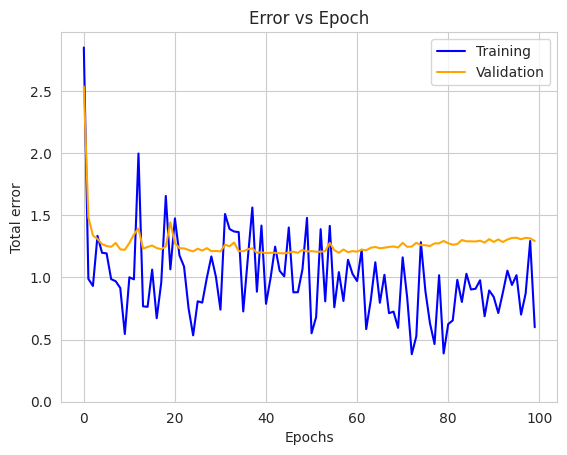

In [3]:
x, y_events, y_tdelta = load_data()

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.1, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0        100.0
1       ED_intime  2205.0         73.5
2      ED_outtime  2205.0         73.5
3         CT_time     0.0          0.0
4         SW_time     0.0          0.0
5        TPA_time     0.0          0.0
6  admission_time  3000.0        100.0
7  discharge_time  3000.0        100.0
8           icuin     0.0          0.0
9          icuout     0.0          0.0


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


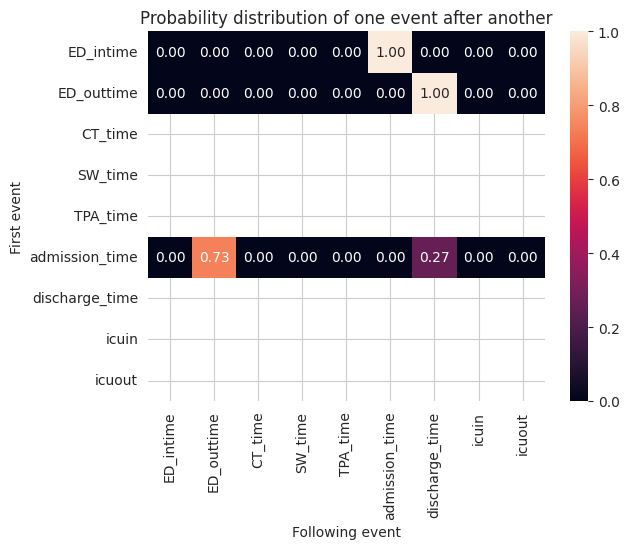

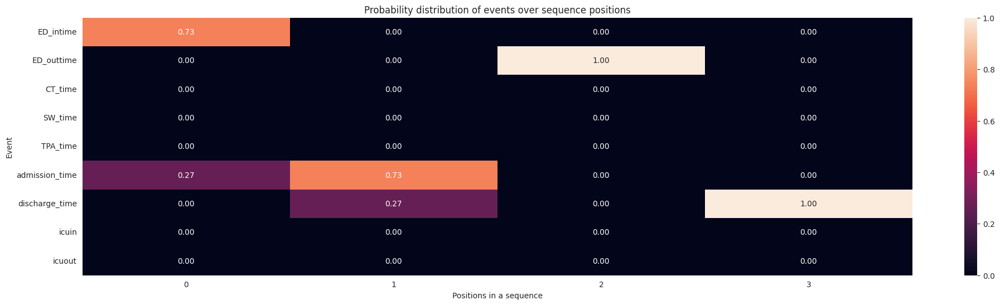

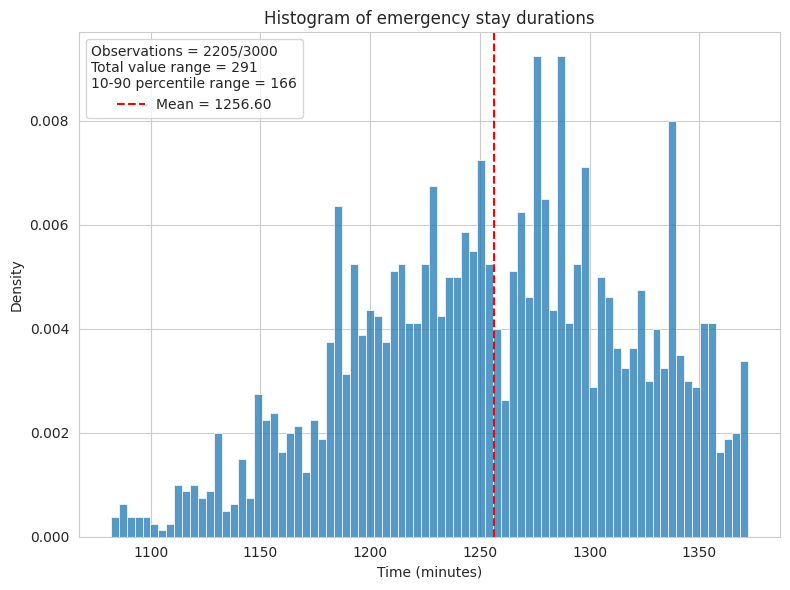

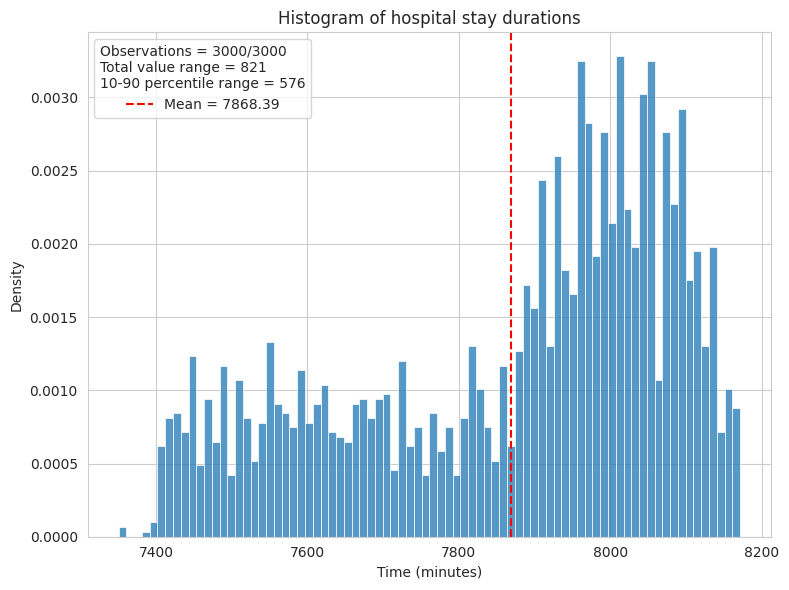

No intervals for event = icu found.


In [4]:
post_process(model)

## 1 - 4+

Epoch 1  --> Training: total loss=2.5053 -- Validation: total loss=3.0934 (Event loss=2.0266 + Tdelta loss=1.0668) -- Run time: 1.06 seconds.
Epoch 2  --> Training: total loss=3.6114 -- Validation: total loss=3.0243 (Event loss=1.9879 + Tdelta loss=1.0363) -- Run time: 0.70 seconds.
Epoch 3  --> Training: total loss=3.0130 -- Validation: total loss=2.4925 (Event loss=1.4632 + Tdelta loss=1.0292) -- Run time: 0.95 seconds.
Epoch 4  --> Training: total loss=1.9637 -- Validation: total loss=2.0507 (Event loss=1.0334 + Tdelta loss=1.0173) -- Run time: 0.89 seconds.
Epoch 5  --> Training: total loss=2.5922 -- Validation: total loss=2.0292 (Event loss=0.9806 + Tdelta loss=1.0486) -- Run time: 0.63 seconds.
Epoch 6  --> Training: total loss=2.2263 -- Validation: total loss=1.8754 (Event loss=0.9124 + Tdelta loss=0.9631) -- Run time: 0.75 seconds.
Epoch 7  --> Training: total loss=1.3531 -- Validation: total loss=1.9089 (Event loss=0.9006 + Tdelta loss=1.0083) -- Run time: 0.68 seconds.
Epoch 

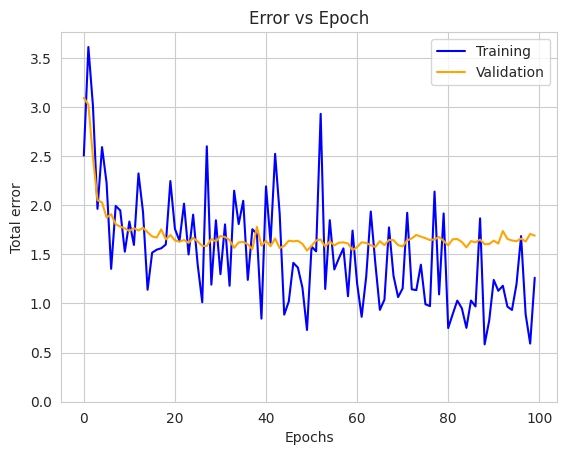

In [5]:
x, y_events, y_tdelta = load_data(4)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0        100.0
1       ED_intime  2190.0         73.0
2      ED_outtime  2190.0         73.0
3         CT_time  3000.0        100.0
4         SW_time     0.0          0.0
5        TPA_time     0.0          0.0
6  admission_time  3000.0        100.0
7  discharge_time  3000.0        100.0
8           icuin  3000.0        100.0
9          icuout  3000.0        100.0


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


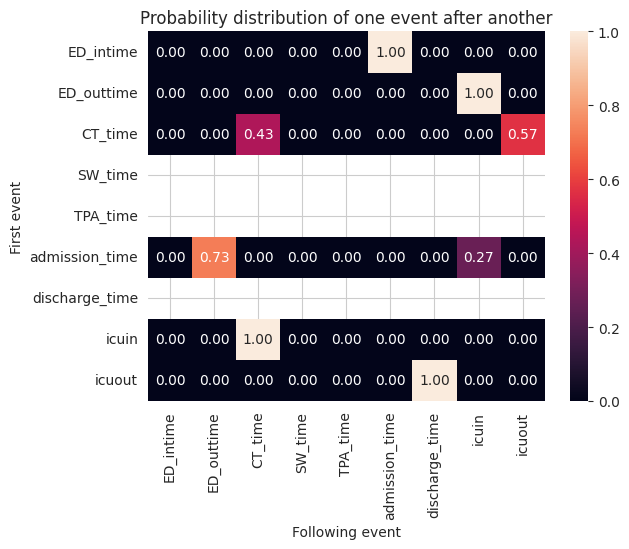

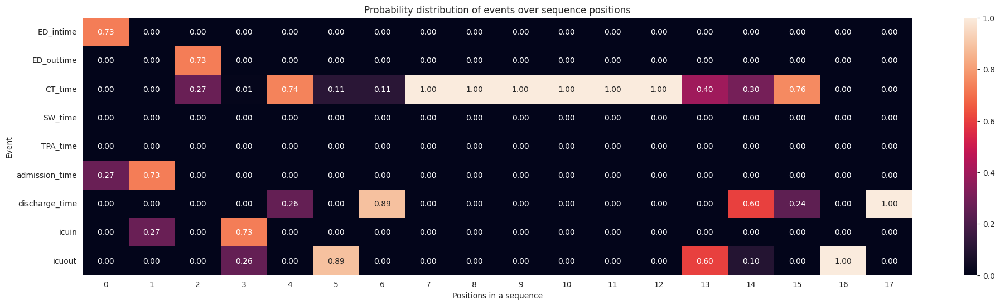

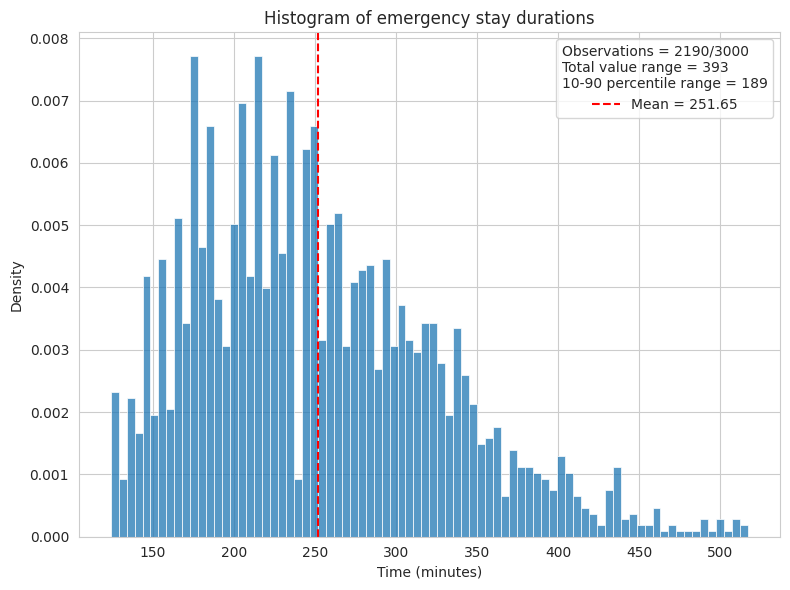

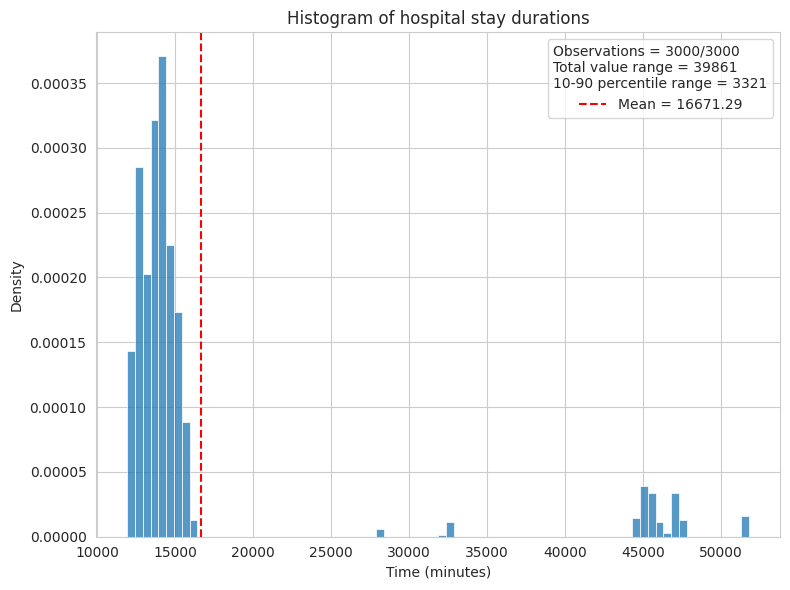

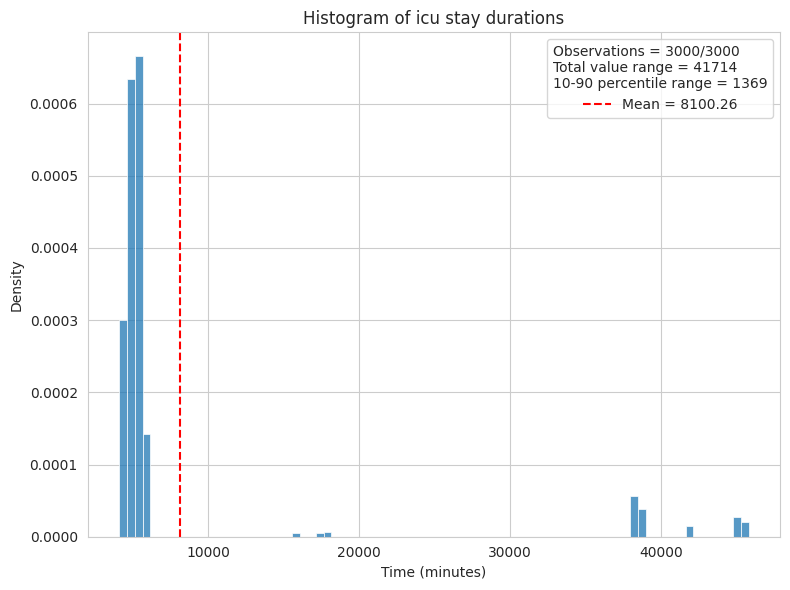

In [6]:
post_process(model)

## 1 - 6+

Epoch 1  --> Training: total loss=2.6531 -- Validation: total loss=3.0313 (Event loss=1.9887 + Tdelta loss=1.0425) -- Run time: 0.93 seconds.
Epoch 2  --> Training: total loss=2.8344 -- Validation: total loss=2.7709 (Event loss=1.8240 + Tdelta loss=0.9470) -- Run time: 0.58 seconds.
Epoch 3  --> Training: total loss=2.1579 -- Validation: total loss=2.2961 (Event loss=1.3626 + Tdelta loss=0.9335) -- Run time: 0.60 seconds.
Epoch 4  --> Training: total loss=2.7674 -- Validation: total loss=2.0453 (Event loss=1.0320 + Tdelta loss=1.0133) -- Run time: 0.58 seconds.
Epoch 5  --> Training: total loss=1.7540 -- Validation: total loss=1.8628 (Event loss=0.9281 + Tdelta loss=0.9347) -- Run time: 0.57 seconds.
Epoch 6  --> Training: total loss=1.6728 -- Validation: total loss=1.8852 (Event loss=0.9172 + Tdelta loss=0.9680) -- Run time: 0.55 seconds.
Epoch 7  --> Training: total loss=1.7117 -- Validation: total loss=1.8209 (Event loss=0.8893 + Tdelta loss=0.9315) -- Run time: 0.56 seconds.
Epoch 

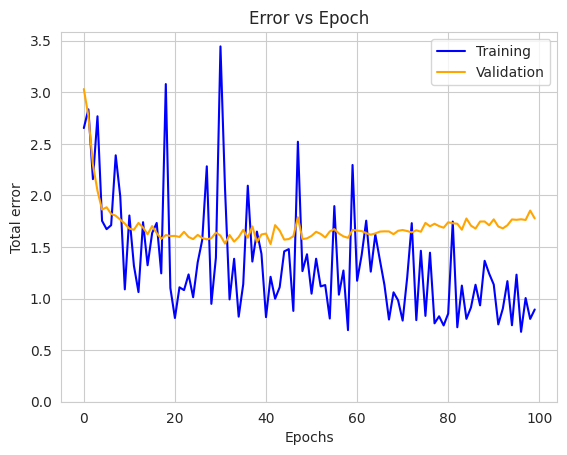

In [7]:
x, y_events, y_tdelta = load_data(6)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2161.0    72.033333
2      ED_outtime  2161.0    72.033333
3         CT_time  2201.0    73.366667
4         SW_time   799.0    26.633333
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2628.0    87.600000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


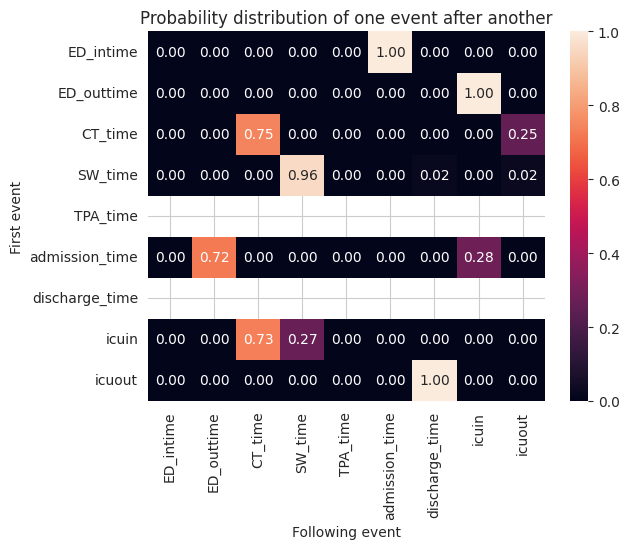

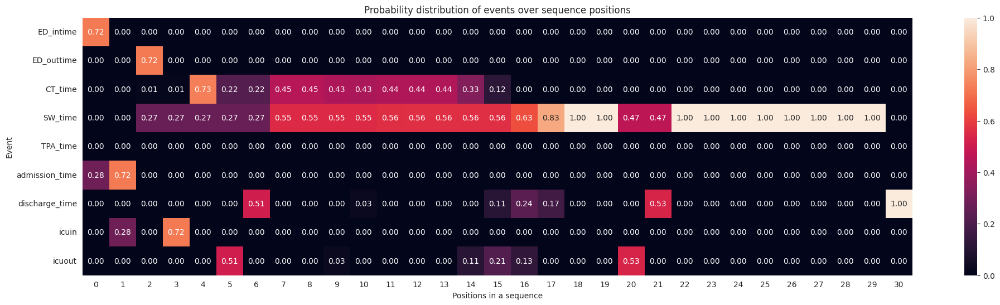

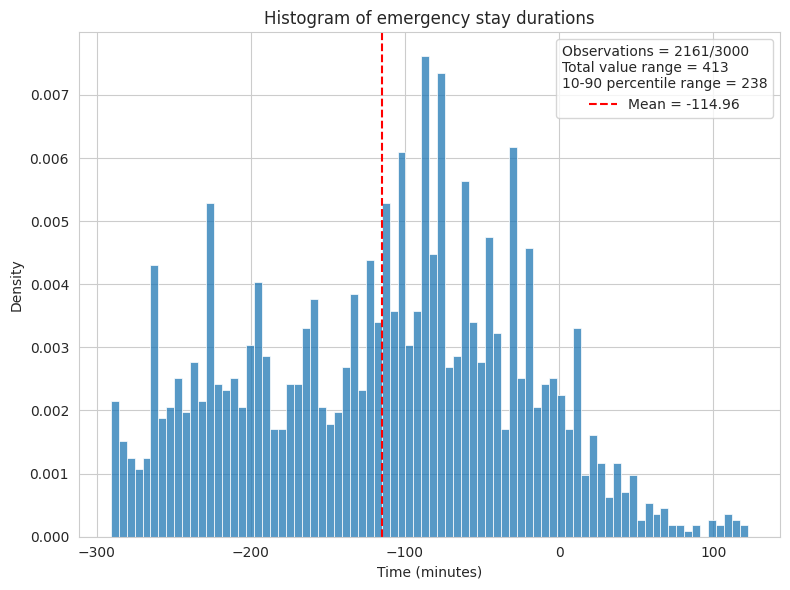

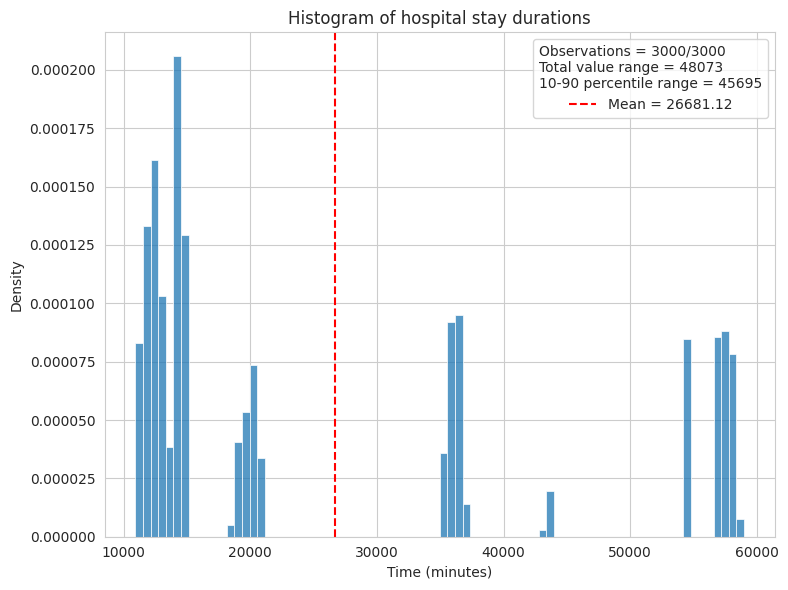

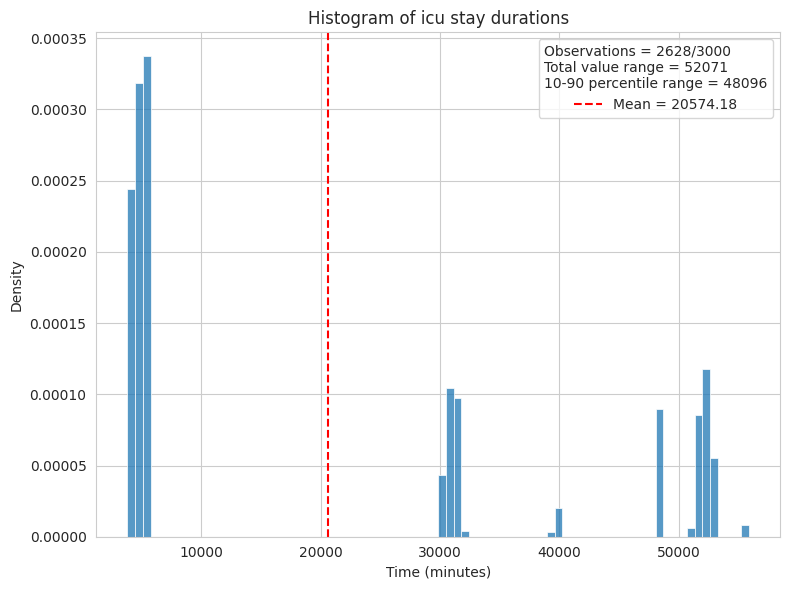

In [8]:
post_process(model)

## 1 - 8+

Epoch 1  --> Training: total loss=3.0462 -- Validation: total loss=3.1118 (Event loss=1.9832 + Tdelta loss=1.1286) -- Run time: 0.37 seconds.
Epoch 2  --> Training: total loss=2.3986 -- Validation: total loss=3.0069 (Event loss=1.9858 + Tdelta loss=1.0211) -- Run time: 0.36 seconds.
Epoch 3  --> Training: total loss=2.5986 -- Validation: total loss=2.8326 (Event loss=1.8715 + Tdelta loss=0.9611) -- Run time: 0.36 seconds.
Epoch 4  --> Training: total loss=2.6100 -- Validation: total loss=2.6519 (Event loss=1.6908 + Tdelta loss=0.9611) -- Run time: 0.36 seconds.
Epoch 5  --> Training: total loss=1.9812 -- Validation: total loss=2.4230 (Event loss=1.4702 + Tdelta loss=0.9528) -- Run time: 0.38 seconds.
Epoch 6  --> Training: total loss=2.5425 -- Validation: total loss=2.1892 (Event loss=1.2367 + Tdelta loss=0.9525) -- Run time: 0.38 seconds.
Epoch 7  --> Training: total loss=1.4785 -- Validation: total loss=2.0522 (Event loss=1.1105 + Tdelta loss=0.9417) -- Run time: 0.36 seconds.
Epoch 

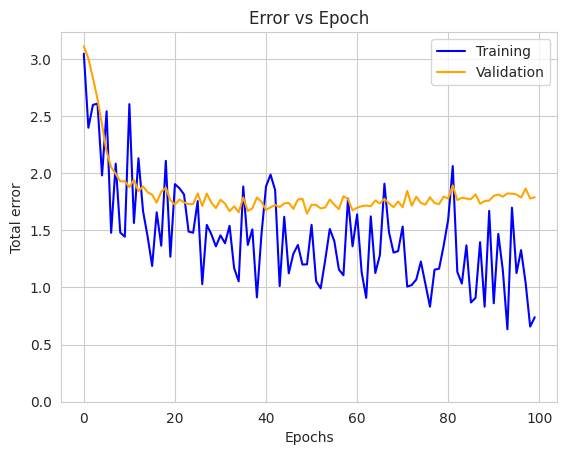

In [9]:
x, y_events, y_tdelta = load_data(8)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2194.0    73.133333
2      ED_outtime  2194.0    73.133333
3         CT_time  2245.0    74.833333
4         SW_time  2411.0    80.366667
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2728.0    90.933333


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


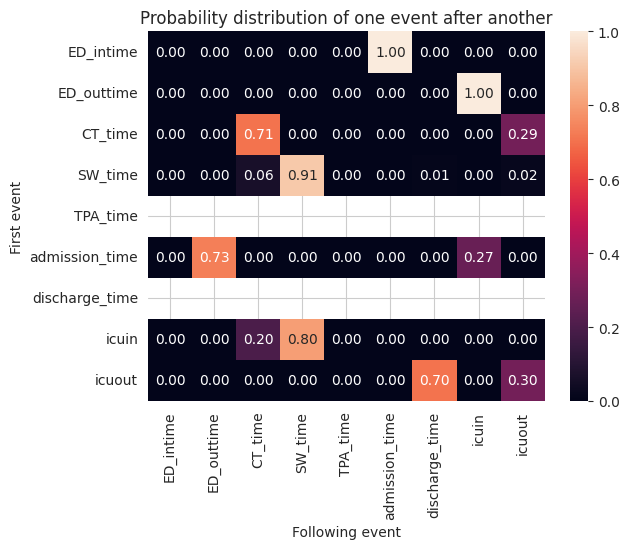

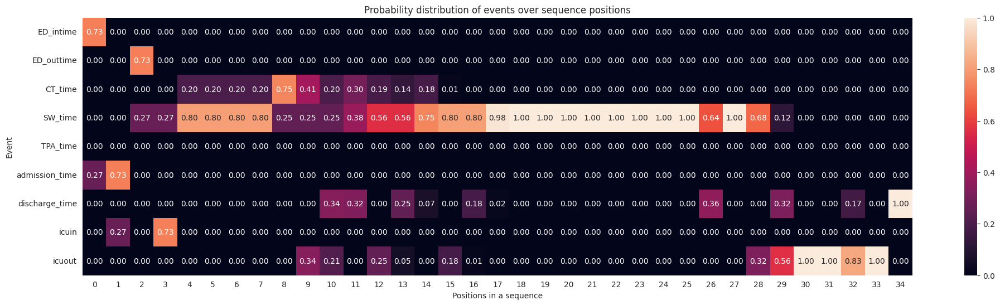

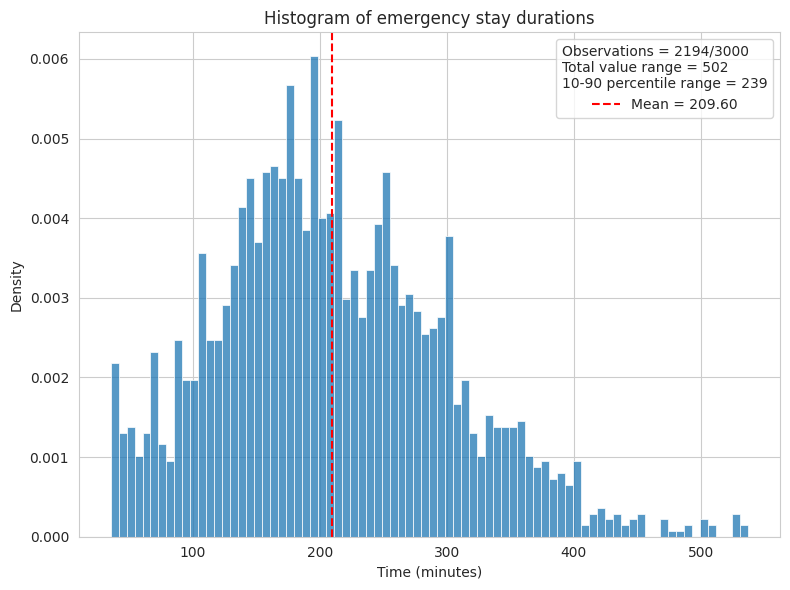

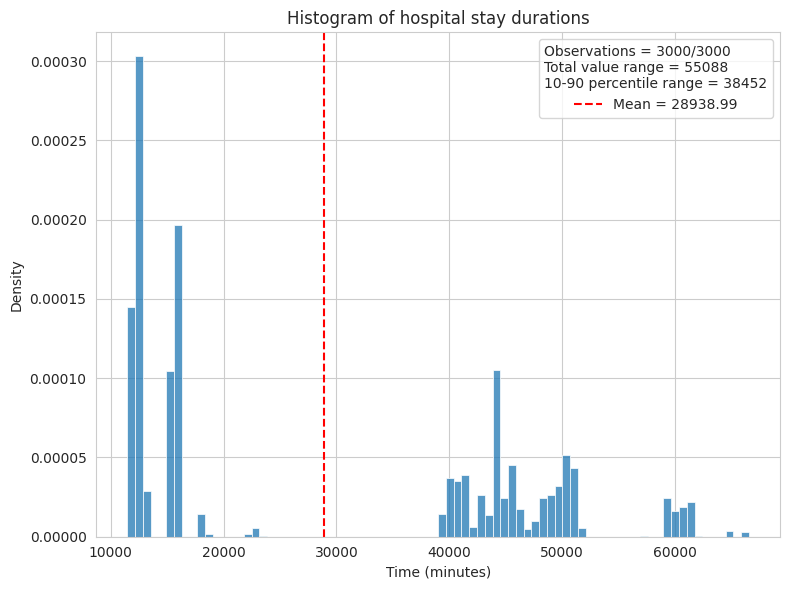

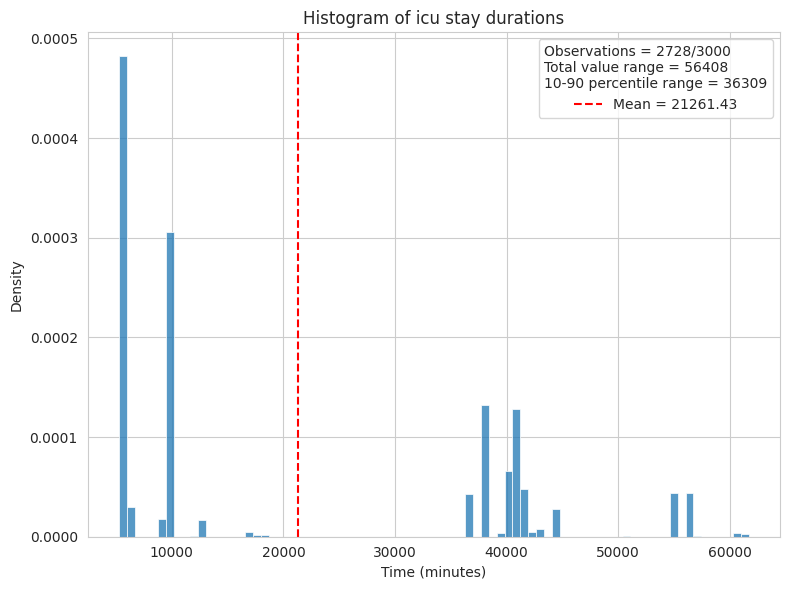

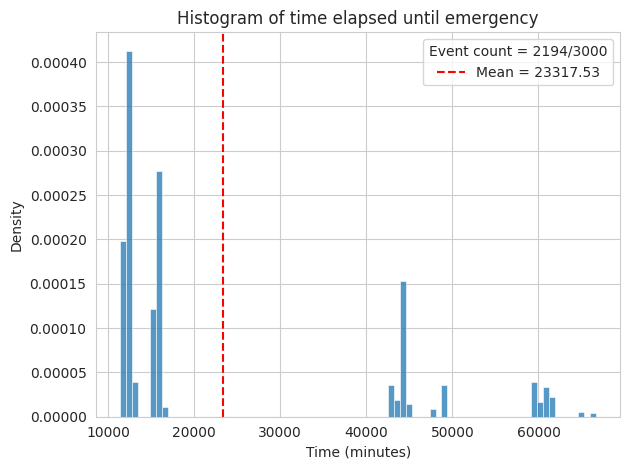

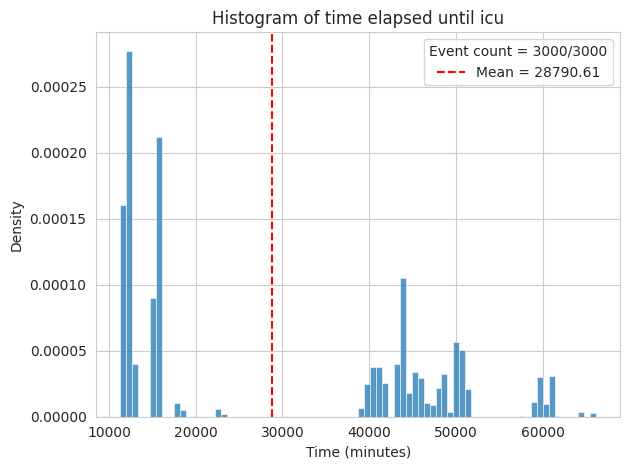

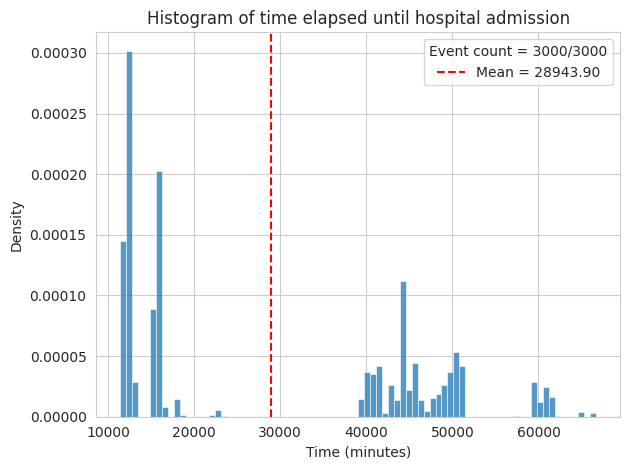

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


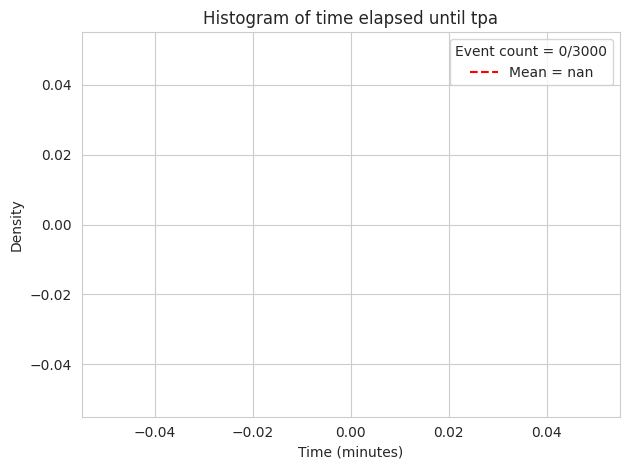

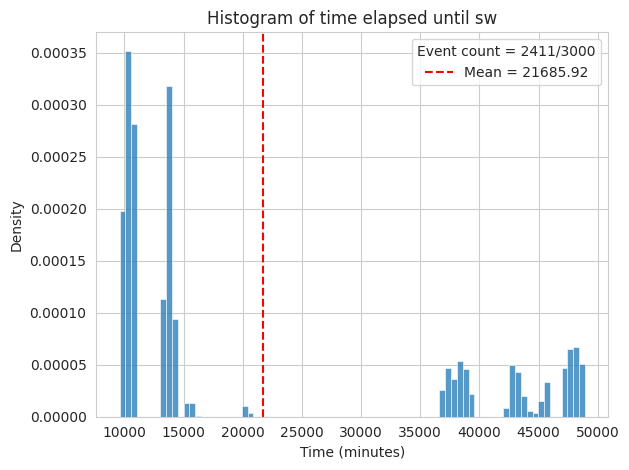

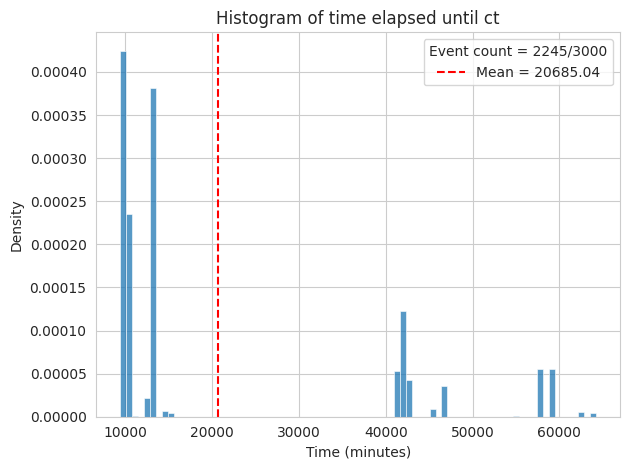

In [14]:
post_process(model)

# 2

In [15]:
model = base.Net(device=device, input_length=373, d_model=32, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())
sum(p.numel() for p in model.parameters() if p.requires_grad)
# not nearly as much data as 10*the number of parameters of the model = 900,000+ for this model

9664019

## 2 - full

Epoch 1  --> Training: total loss=2.5985 -- Validation: total loss=2.8266 (Event loss=1.6395 + Tdelta loss=1.1871) -- Run time: 3.05 seconds.
Epoch 2  --> Training: total loss=1.7626 -- Validation: total loss=1.7232 (Event loss=0.5195 + Tdelta loss=1.2038) -- Run time: 2.87 seconds.
Epoch 3  --> Training: total loss=1.6768 -- Validation: total loss=1.4896 (Event loss=0.4985 + Tdelta loss=0.9911) -- Run time: 2.75 seconds.
Epoch 4  --> Training: total loss=1.1953 -- Validation: total loss=1.3791 (Event loss=0.4722 + Tdelta loss=0.9069) -- Run time: 3.63 seconds.
Epoch 5  --> Training: total loss=0.7546 -- Validation: total loss=1.5310 (Event loss=0.4860 + Tdelta loss=1.0449) -- Run time: 2.76 seconds.
Epoch 6  --> Training: total loss=1.3009 -- Validation: total loss=1.3879 (Event loss=0.4837 + Tdelta loss=0.9041) -- Run time: 2.89 seconds.
Epoch 7  --> Training: total loss=1.2383 -- Validation: total loss=1.2858 (Event loss=0.4267 + Tdelta loss=0.8591) -- Run time: 2.77 seconds.
Epoch 

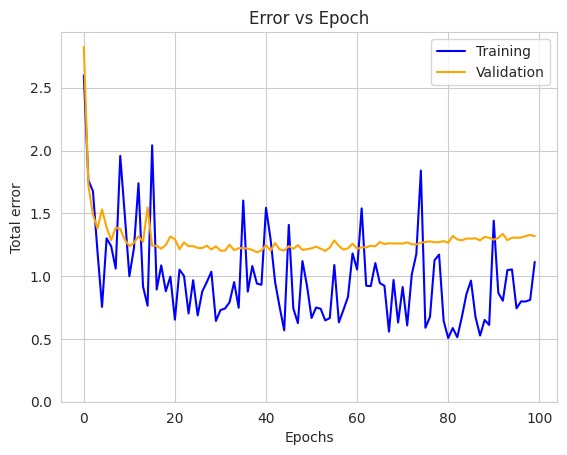

In [16]:
x, y_events, y_tdelta = load_data()

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=32, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.1, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2122.0    70.733333
2      ED_outtime  2122.0    70.733333
3         CT_time     0.0     0.000000
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin     0.0     0.000000
9          icuout     0.0     0.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


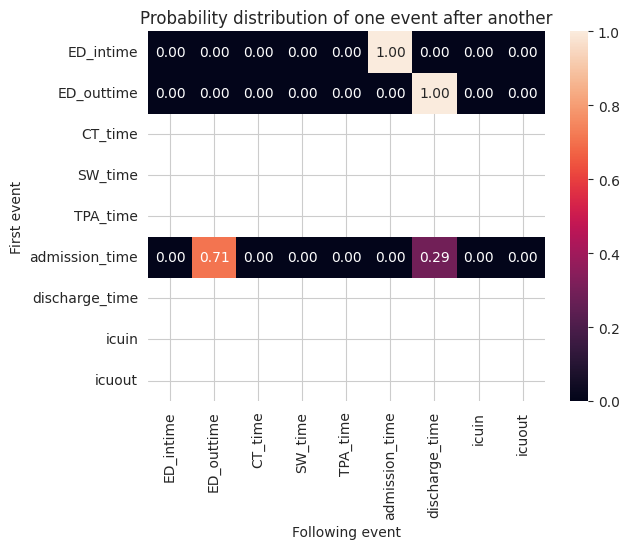

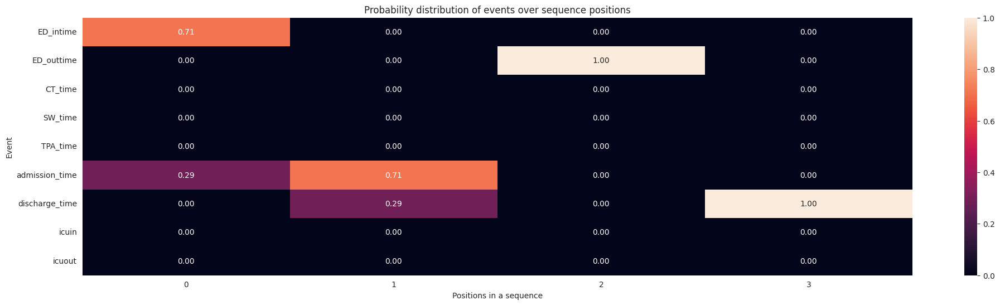

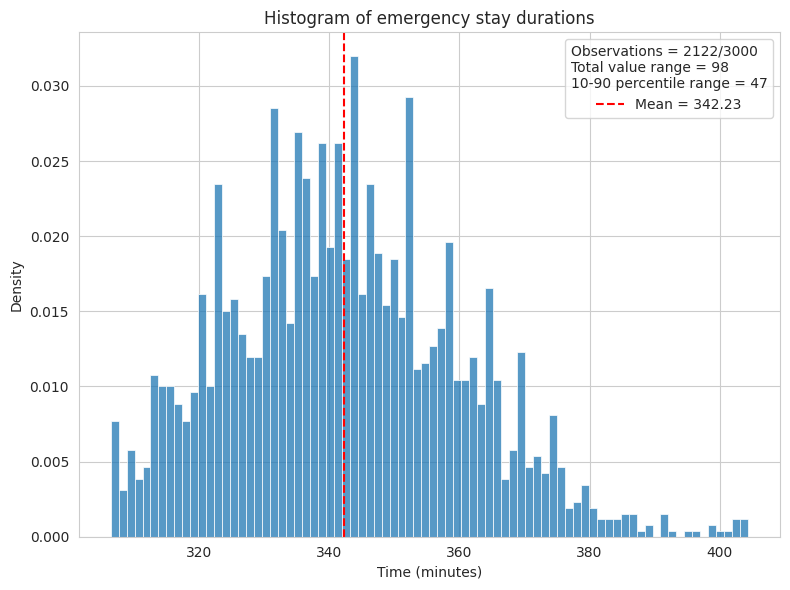

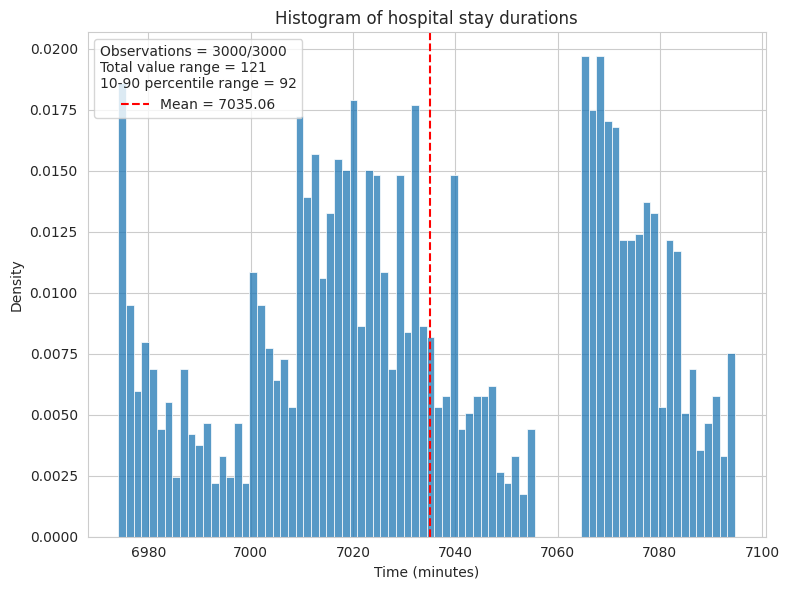

No intervals for event = icu found.


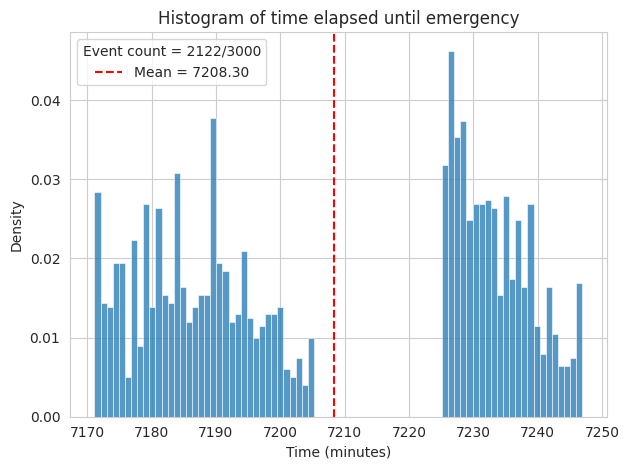

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


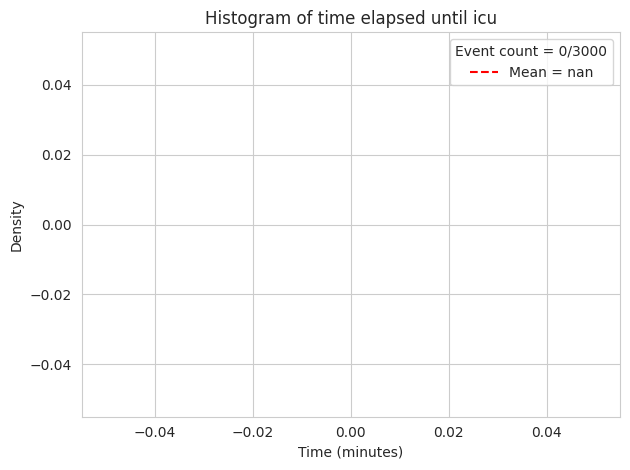

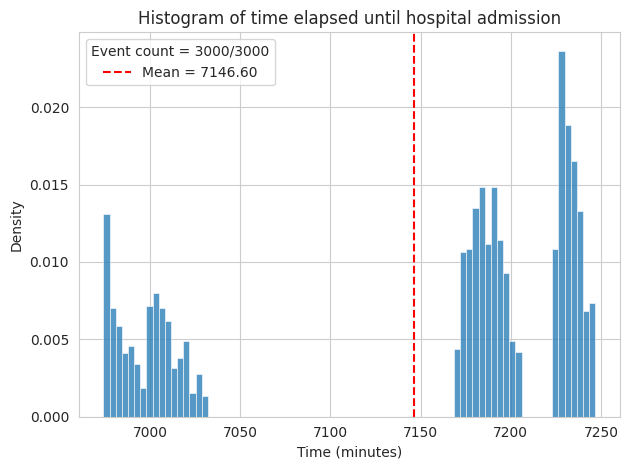

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


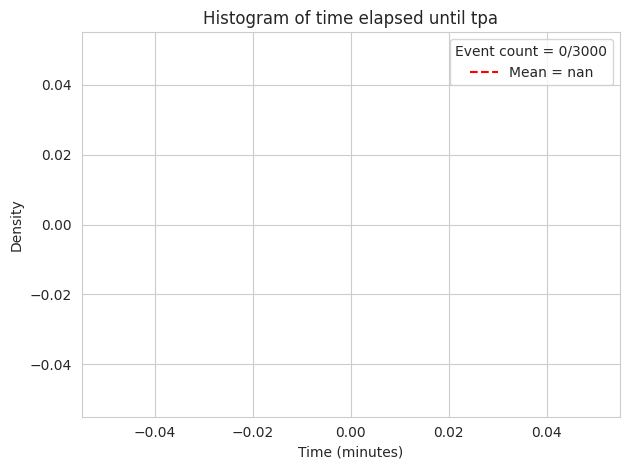

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


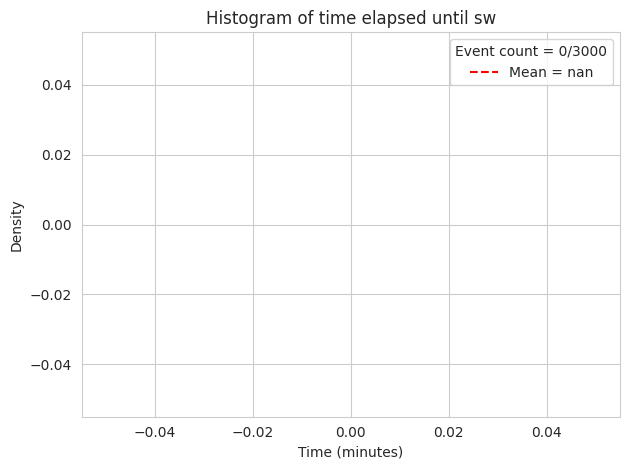

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


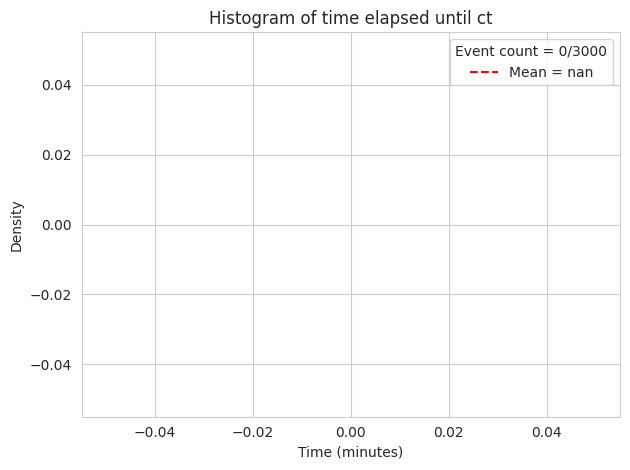

In [17]:
post_process(model)

## 2 - 4+

Epoch 1  --> Training: total loss=3.5906 -- Validation: total loss=3.1475 (Event loss=2.0627 + Tdelta loss=1.0848) -- Run time: 0.92 seconds.
Epoch 2  --> Training: total loss=2.8405 -- Validation: total loss=3.1239 (Event loss=2.0333 + Tdelta loss=1.0907) -- Run time: 0.94 seconds.
Epoch 3  --> Training: total loss=2.7182 -- Validation: total loss=2.8302 (Event loss=1.7734 + Tdelta loss=1.0568) -- Run time: 0.96 seconds.
Epoch 4  --> Training: total loss=3.3966 -- Validation: total loss=2.5877 (Event loss=1.5088 + Tdelta loss=1.0788) -- Run time: 0.98 seconds.
Epoch 5  --> Training: total loss=2.4638 -- Validation: total loss=2.3313 (Event loss=1.2811 + Tdelta loss=1.0502) -- Run time: 0.94 seconds.
Epoch 6  --> Training: total loss=1.8871 -- Validation: total loss=2.0368 (Event loss=1.0239 + Tdelta loss=1.0129) -- Run time: 0.93 seconds.
Epoch 7  --> Training: total loss=2.9165 -- Validation: total loss=1.9795 (Event loss=0.9683 + Tdelta loss=1.0112) -- Run time: 0.95 seconds.
Epoch 

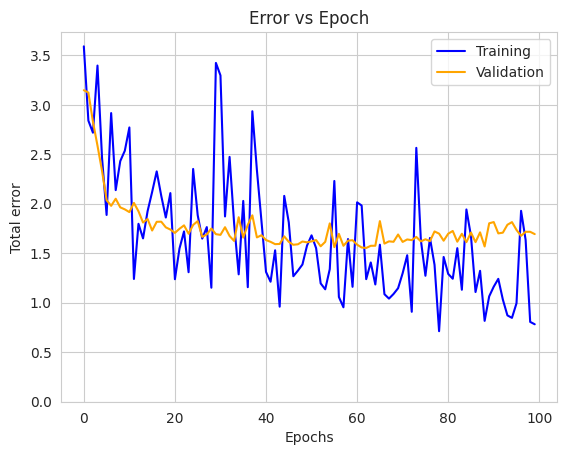

In [18]:
x, y_events, y_tdelta = load_data(4)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=32, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2200.0    73.333333
2      ED_outtime  2200.0    73.333333
3         CT_time  3000.0   100.000000
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  3000.0   100.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


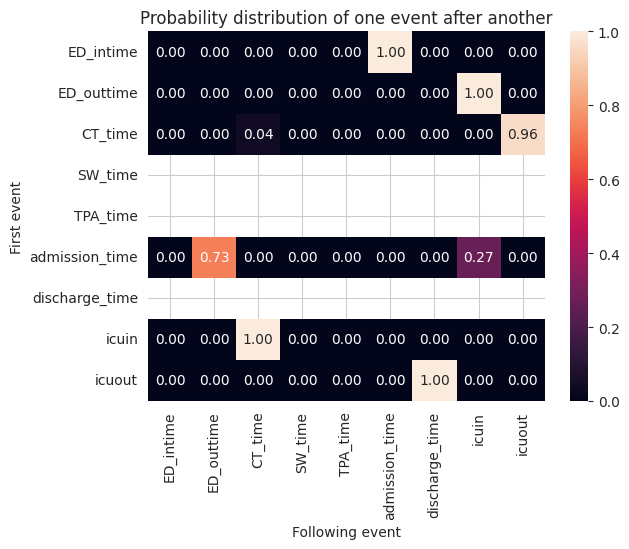

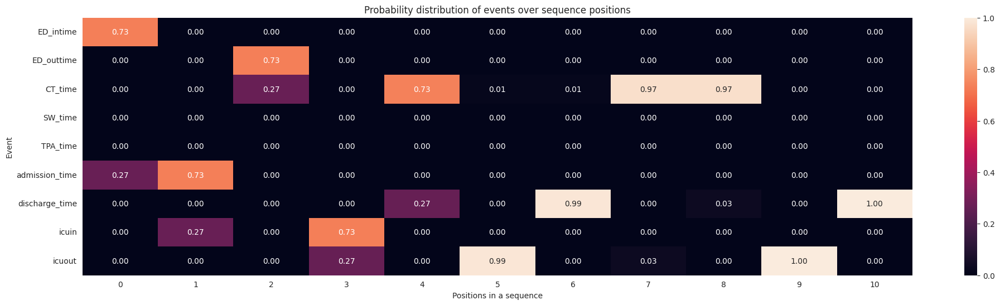

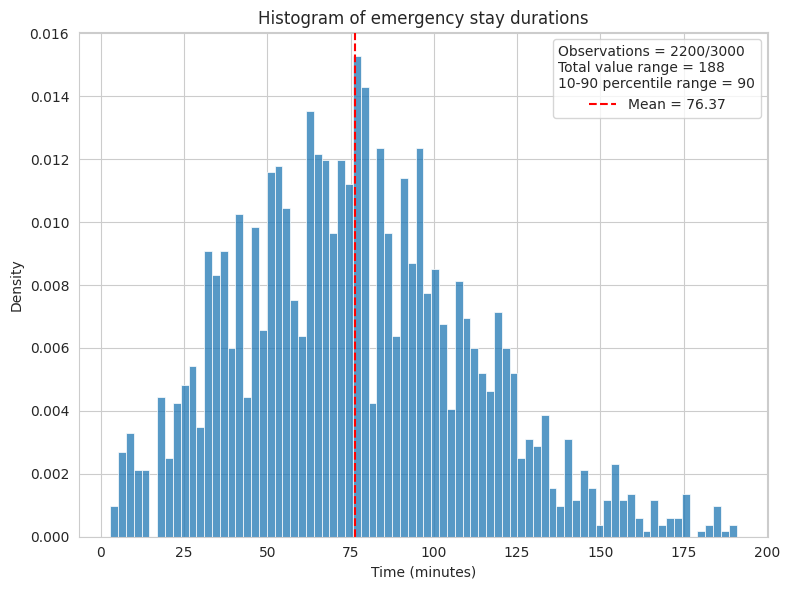

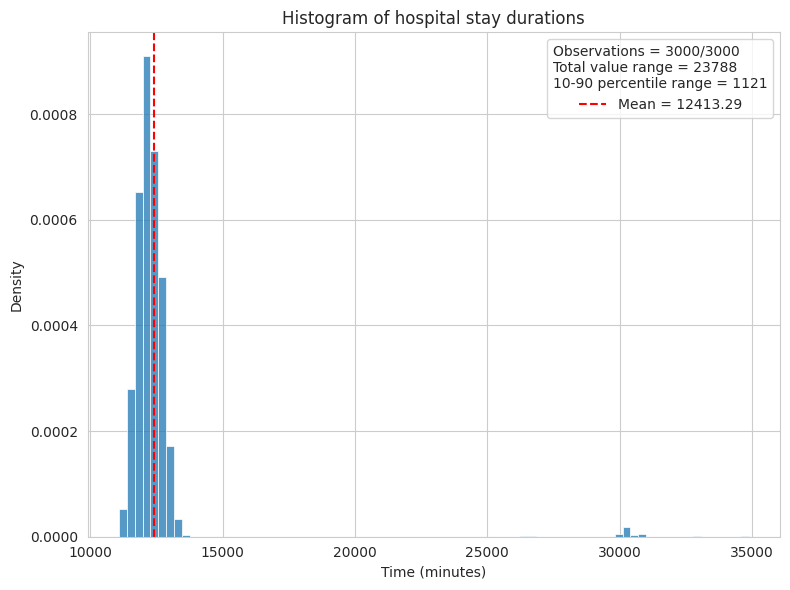

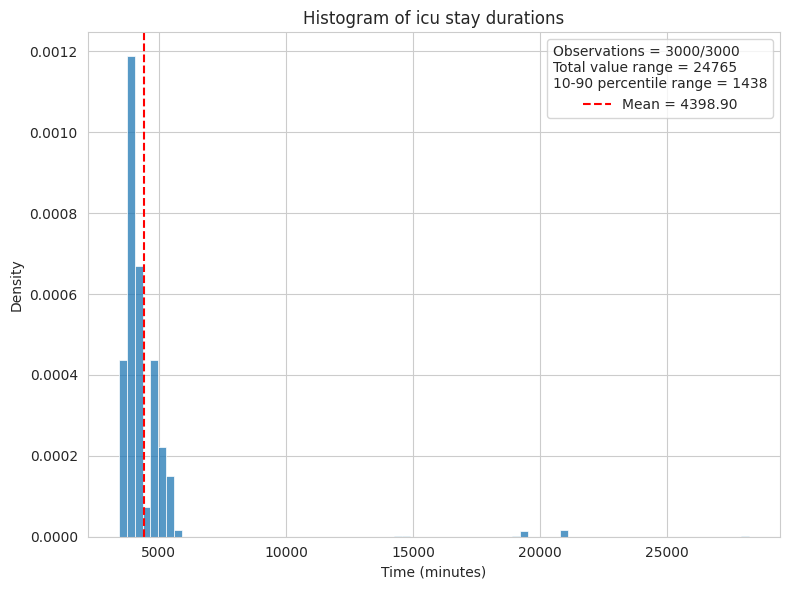

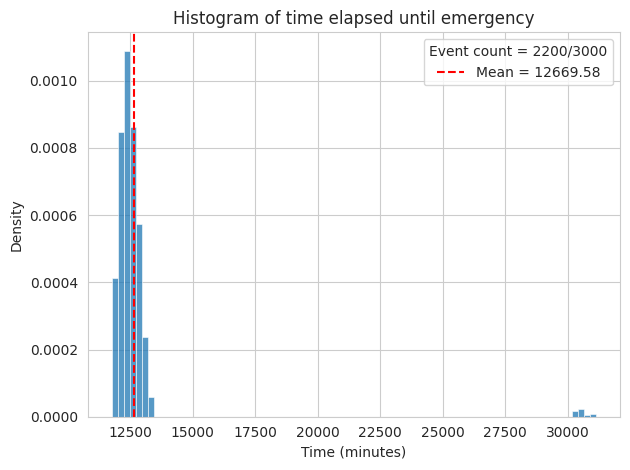

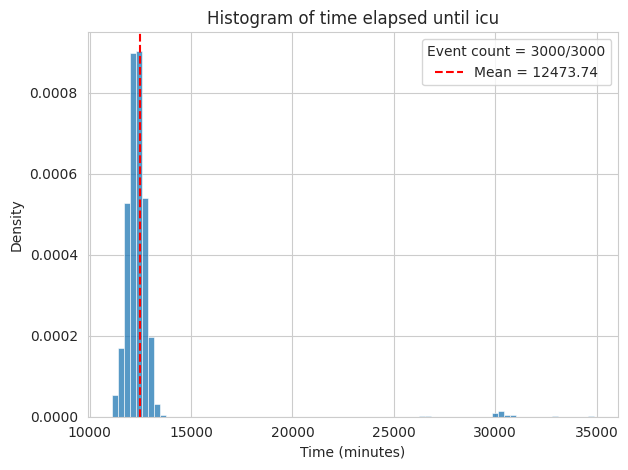

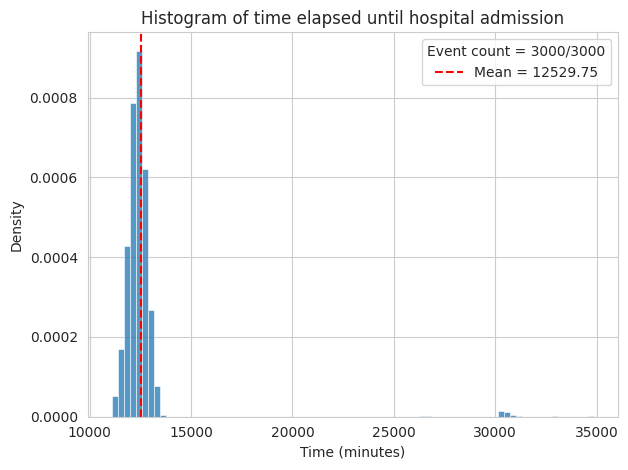

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


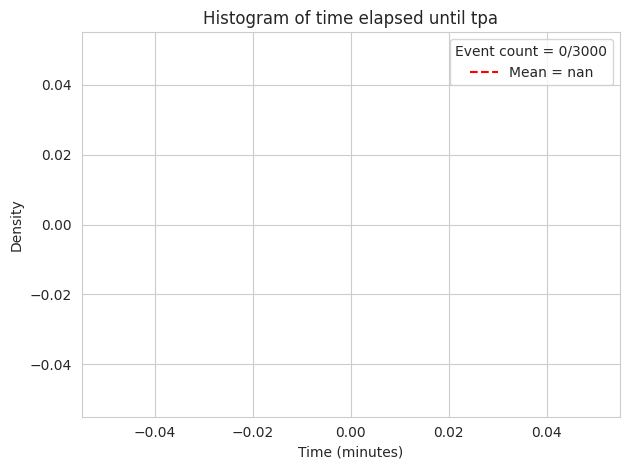

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


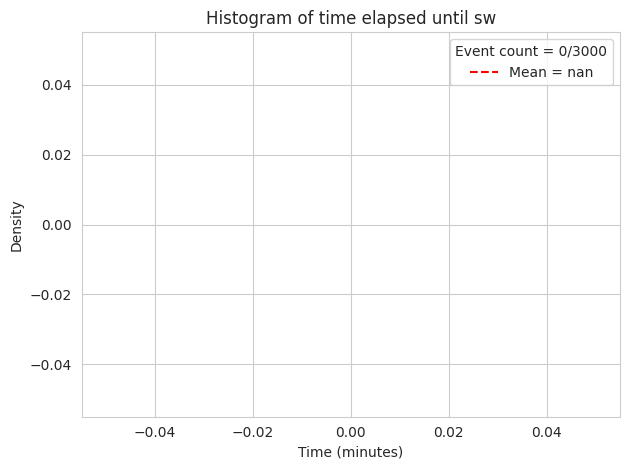

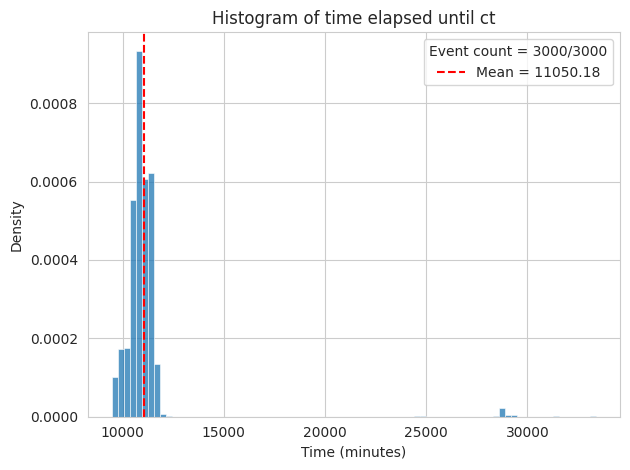

In [19]:
post_process(model)

## 2 - 6+

Epoch 1  --> Training: total loss=5.5018 -- Validation: total loss=3.0719 (Event loss=1.9979 + Tdelta loss=1.0739) -- Run time: 0.83 seconds.
Epoch 2  --> Training: total loss=3.0570 -- Validation: total loss=2.9390 (Event loss=1.9274 + Tdelta loss=1.0116) -- Run time: 0.83 seconds.
Epoch 3  --> Training: total loss=2.3113 -- Validation: total loss=2.6645 (Event loss=1.6485 + Tdelta loss=1.0160) -- Run time: 0.82 seconds.
Epoch 4  --> Training: total loss=2.3713 -- Validation: total loss=2.4416 (Event loss=1.4676 + Tdelta loss=0.9739) -- Run time: 0.82 seconds.
Epoch 5  --> Training: total loss=2.3237 -- Validation: total loss=2.1387 (Event loss=1.1786 + Tdelta loss=0.9602) -- Run time: 0.82 seconds.
Epoch 6  --> Training: total loss=2.1347 -- Validation: total loss=1.9390 (Event loss=0.9713 + Tdelta loss=0.9677) -- Run time: 0.84 seconds.
Epoch 7  --> Training: total loss=3.0746 -- Validation: total loss=1.9798 (Event loss=0.9700 + Tdelta loss=1.0098) -- Run time: 0.71 seconds.
Epoch 

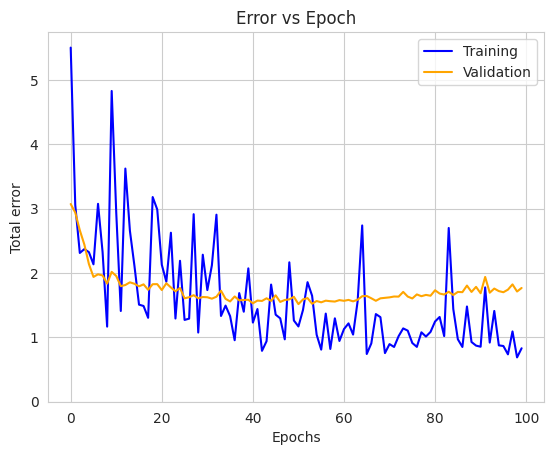

In [20]:
x, y_events, y_tdelta = load_data(6)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=32, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2218.0    73.933333
2      ED_outtime  2218.0    73.933333
3         CT_time  3000.0   100.000000
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  3000.0   100.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


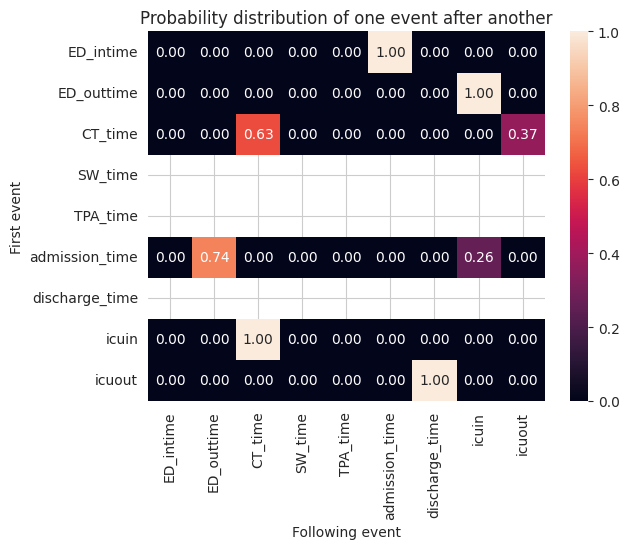

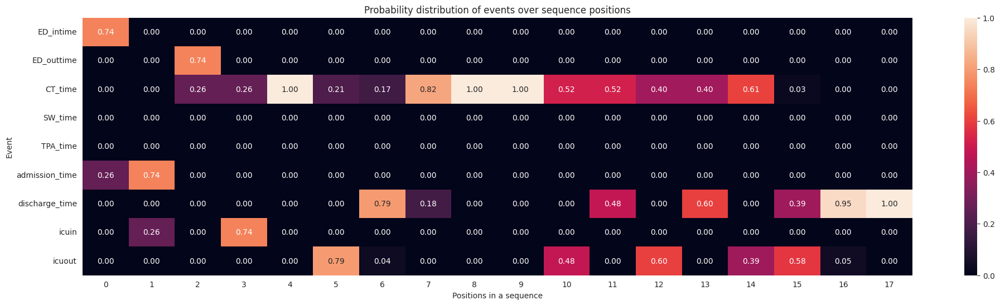

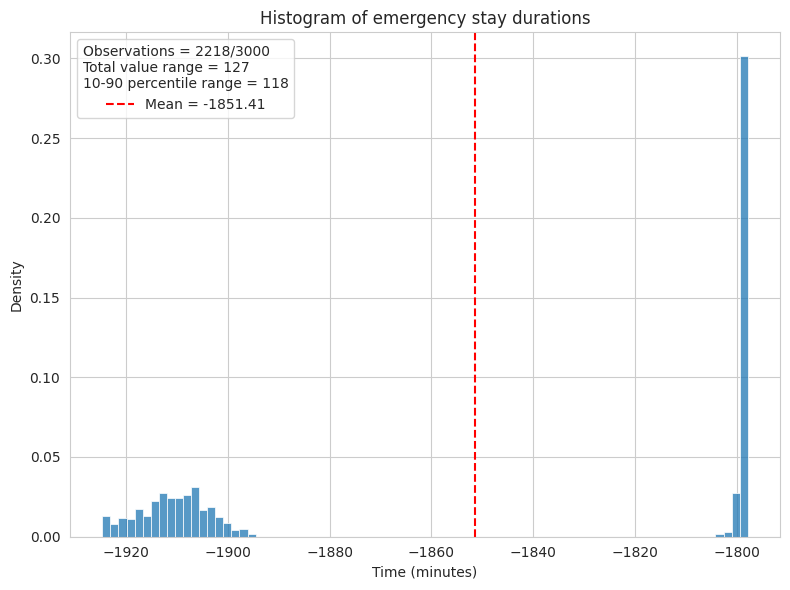

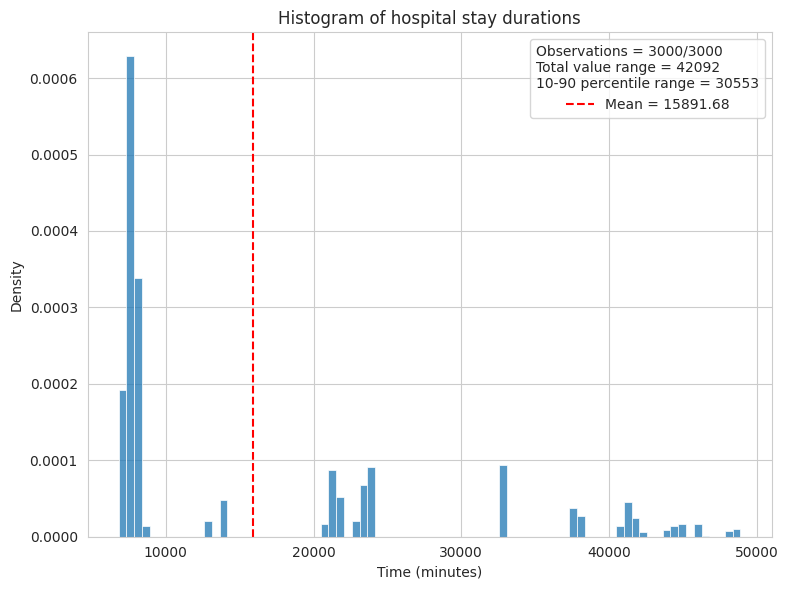

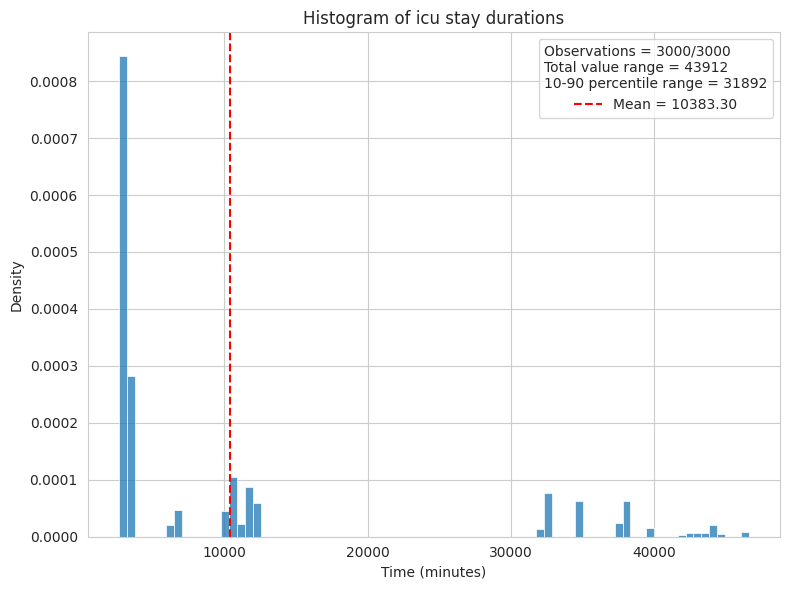

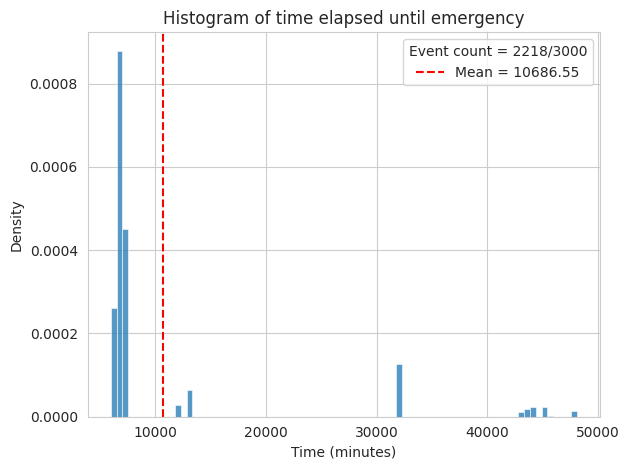

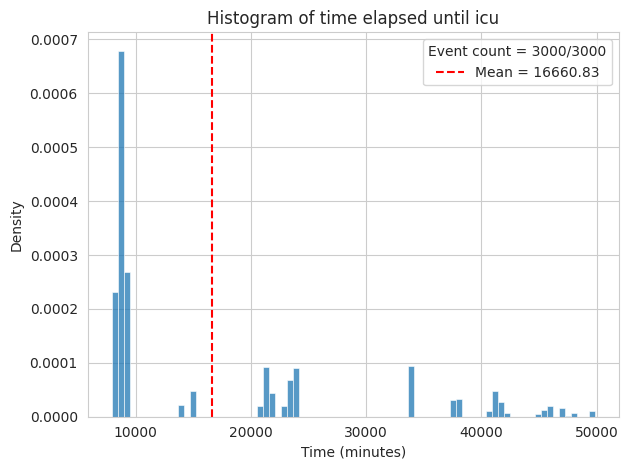

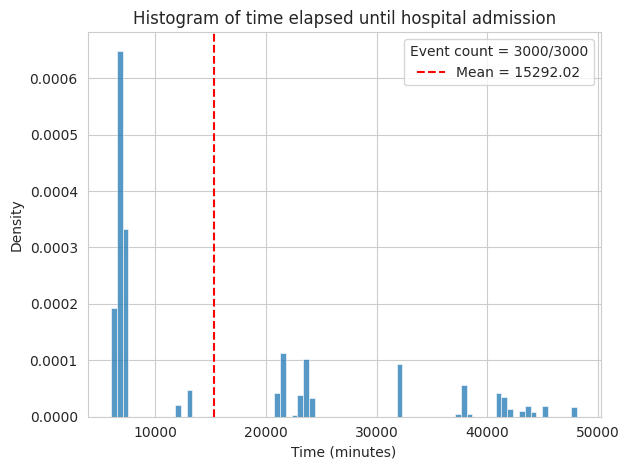

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


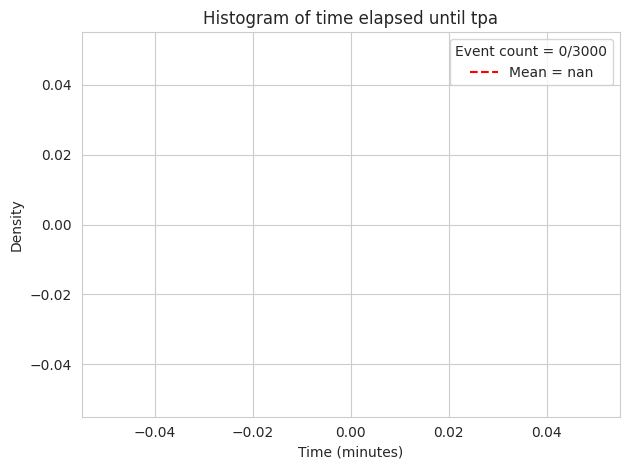

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


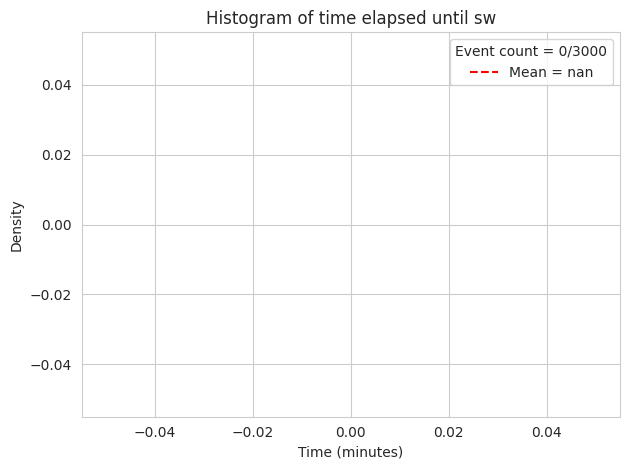

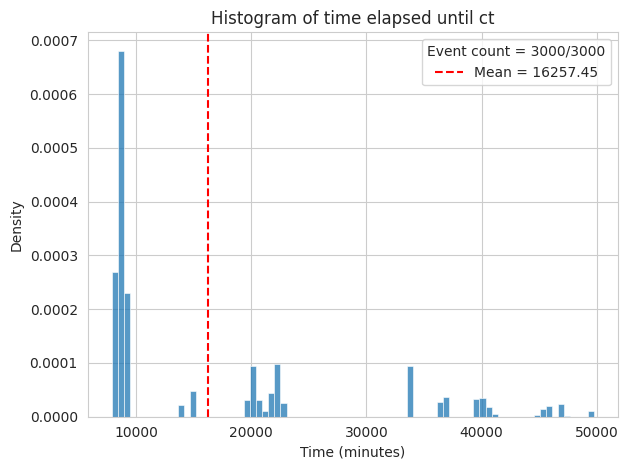

In [21]:
post_process(model)

## 2 - 8+

Epoch 1  --> Training: total loss=3.1871 -- Validation: total loss=3.3798 (Event loss=1.9977 + Tdelta loss=1.3821) -- Run time: 0.54 seconds.
Epoch 2  --> Training: total loss=3.3280 -- Validation: total loss=3.0877 (Event loss=2.0135 + Tdelta loss=1.0742) -- Run time: 0.54 seconds.
Epoch 3  --> Training: total loss=2.5909 -- Validation: total loss=2.8818 (Event loss=1.9061 + Tdelta loss=0.9757) -- Run time: 0.54 seconds.
Epoch 4  --> Training: total loss=2.5853 -- Validation: total loss=2.7447 (Event loss=1.7873 + Tdelta loss=0.9574) -- Run time: 0.54 seconds.
Epoch 5  --> Training: total loss=1.9574 -- Validation: total loss=2.6564 (Event loss=1.6741 + Tdelta loss=0.9822) -- Run time: 0.54 seconds.
Epoch 6  --> Training: total loss=2.1816 -- Validation: total loss=2.5418 (Event loss=1.5412 + Tdelta loss=1.0006) -- Run time: 0.56 seconds.
Epoch 7  --> Training: total loss=2.2488 -- Validation: total loss=2.3584 (Event loss=1.3665 + Tdelta loss=0.9918) -- Run time: 0.56 seconds.
Epoch 

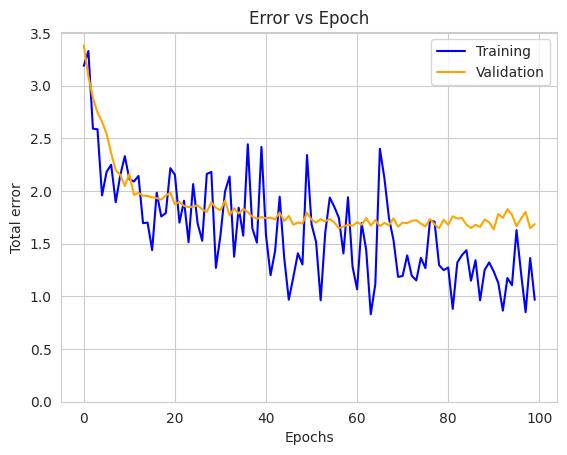

In [22]:
x, y_events, y_tdelta = load_data(8)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=32, sequence_length=64, decoders_in_stack=2, num_heads=4, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2165.0    72.166667
2      ED_outtime  2165.0    72.166667
3         CT_time  2619.0    87.300000
4         SW_time  2208.0    73.600000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2645.0    88.166667


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


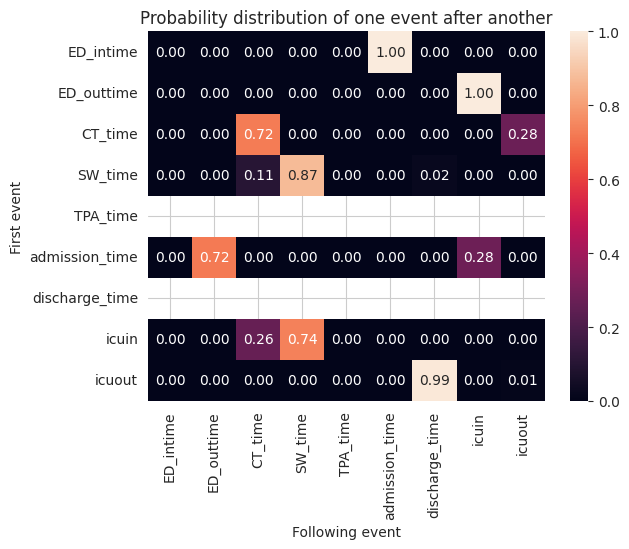

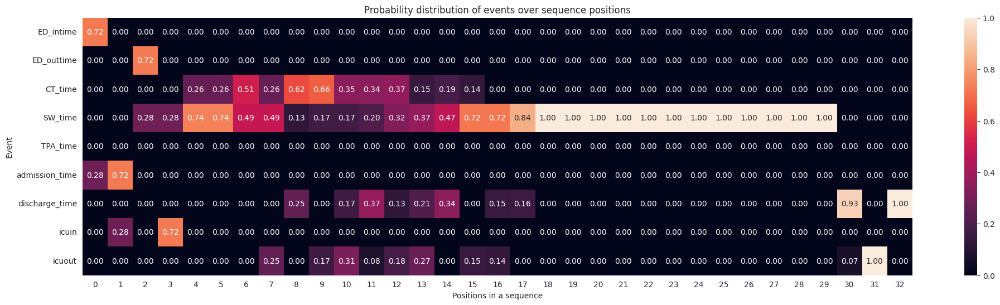

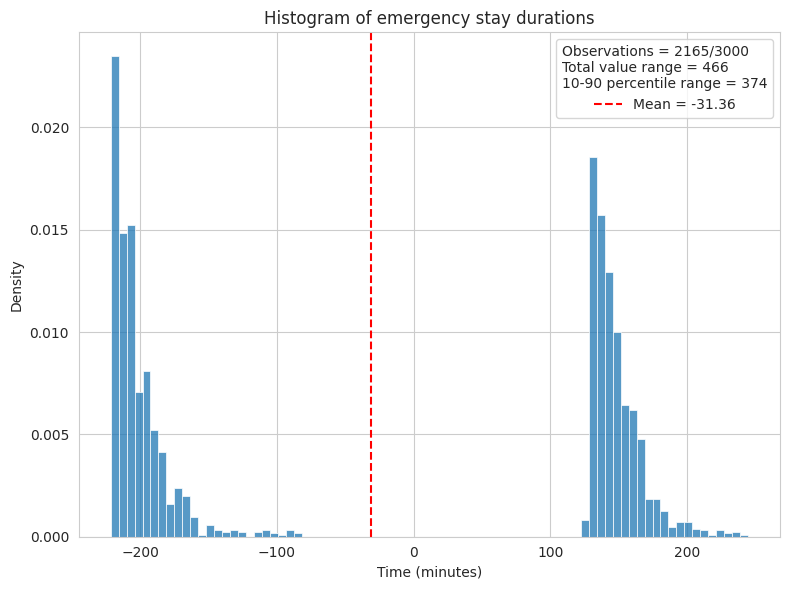

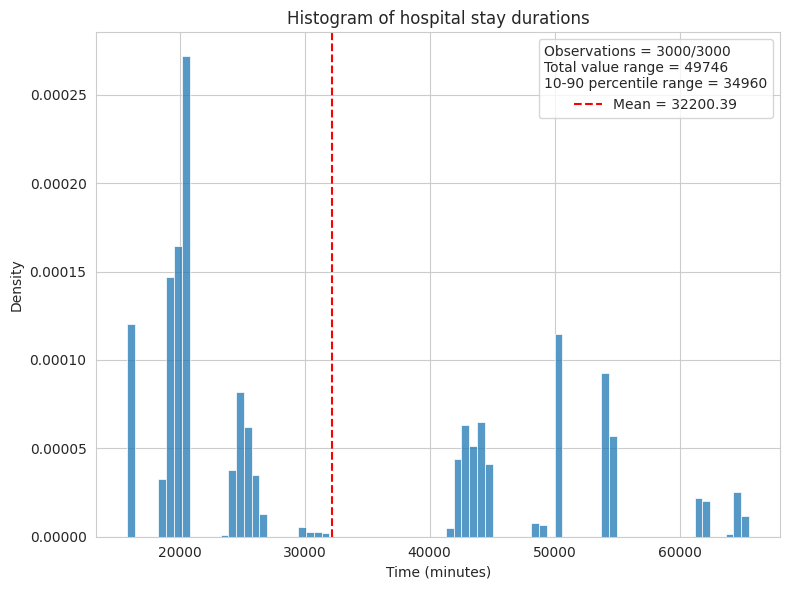

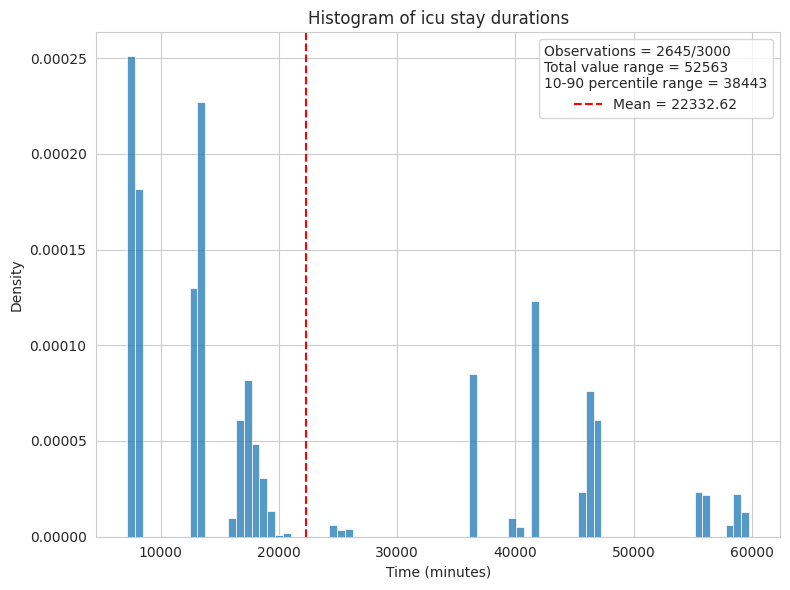

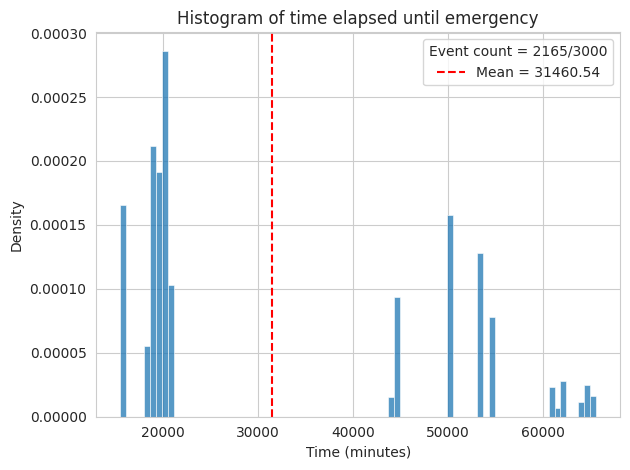

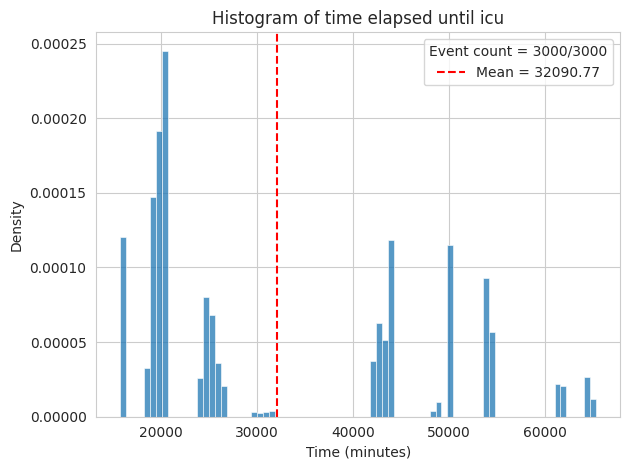

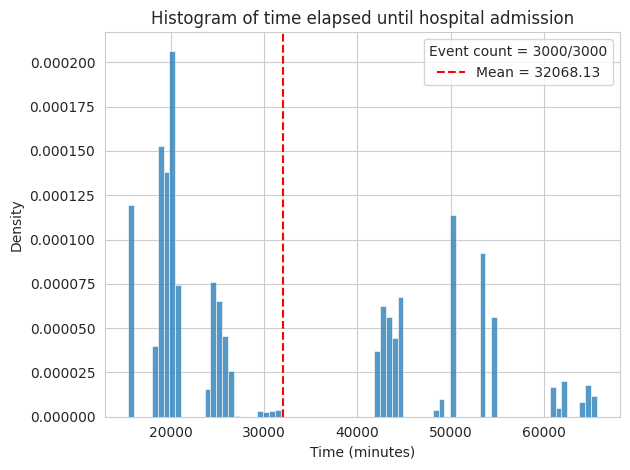

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


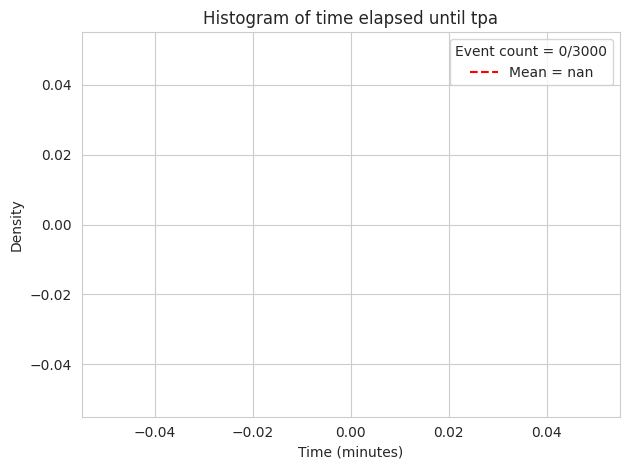

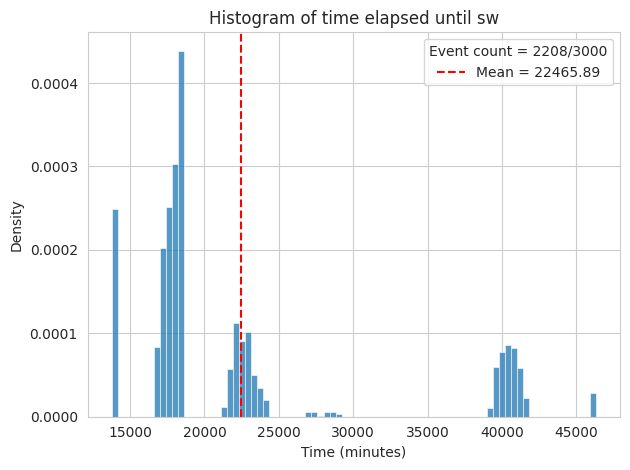

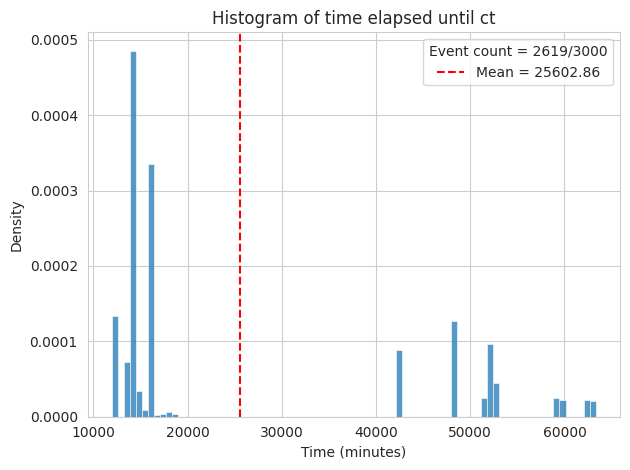

In [23]:
post_process(model)

# 3

In [24]:
model = base.Net(device=device, input_length=373, d_model=64, sequence_length=128, decoders_in_stack=2, num_heads=8, dropout=0.1, activation=nn.GELU())
sum(p.numel() for p in model.parameters() if p.requires_grad)
# not nearly as much data as 10*the number of parameters of the model = 138 million+ for this model

138743827

## 3 - full

Epoch 1  --> Training: total loss=3.0683 -- Validation: total loss=2.9377 (Event loss=1.7212 + Tdelta loss=1.2164) -- Run time: 22.06 seconds.
Epoch 2  --> Training: total loss=3.4231 -- Validation: total loss=2.2125 (Event loss=0.9973 + Tdelta loss=1.2152) -- Run time: 22.21 seconds.
Epoch 3  --> Training: total loss=1.7330 -- Validation: total loss=1.6315 (Event loss=0.6162 + Tdelta loss=1.0153) -- Run time: 22.16 seconds.
Epoch 4  --> Training: total loss=1.6171 -- Validation: total loss=1.4948 (Event loss=0.5093 + Tdelta loss=0.9855) -- Run time: 22.23 seconds.
Epoch 5  --> Training: total loss=1.0325 -- Validation: total loss=1.4258 (Event loss=0.4933 + Tdelta loss=0.9325) -- Run time: 22.22 seconds.
Epoch 6  --> Training: total loss=1.1821 -- Validation: total loss=1.3670 (Event loss=0.4544 + Tdelta loss=0.9126) -- Run time: 22.19 seconds.
Epoch 7  --> Training: total loss=1.5064 -- Validation: total loss=1.5054 (Event loss=0.6116 + Tdelta loss=0.8938) -- Run time: 20.44 seconds.

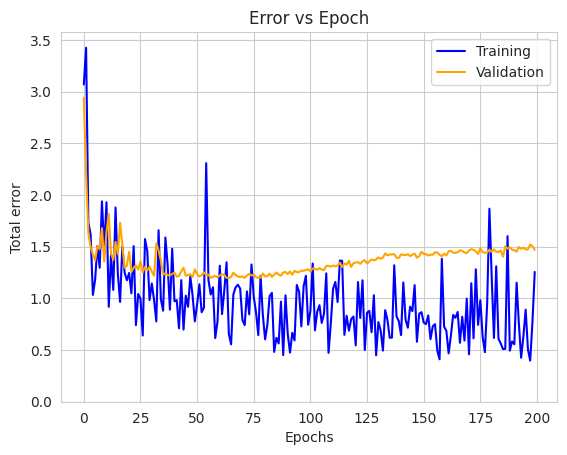

In [25]:
x, y_events, y_tdelta = load_data()

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=64, sequence_length=128, decoders_in_stack=2, num_heads=8, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.1, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2205.0    73.500000
2      ED_outtime  2205.0    73.500000
3         CT_time     8.0     0.266667
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin     8.0     0.266667
9          icuout     8.0     0.266667


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


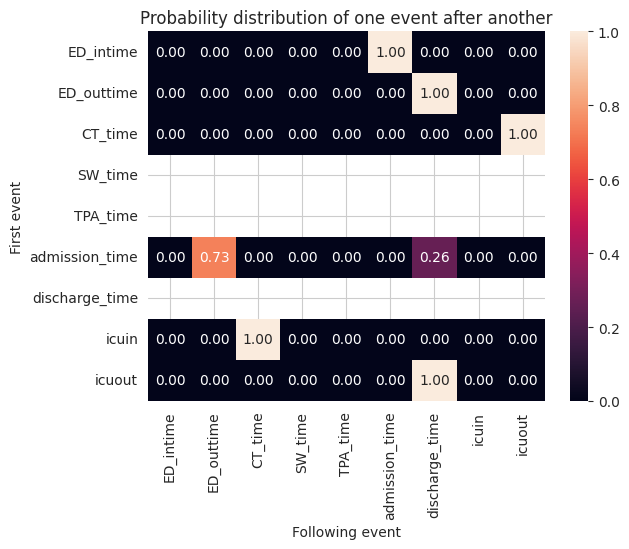

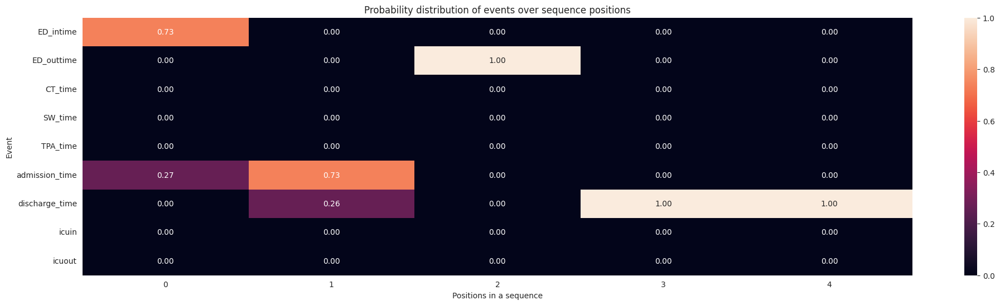

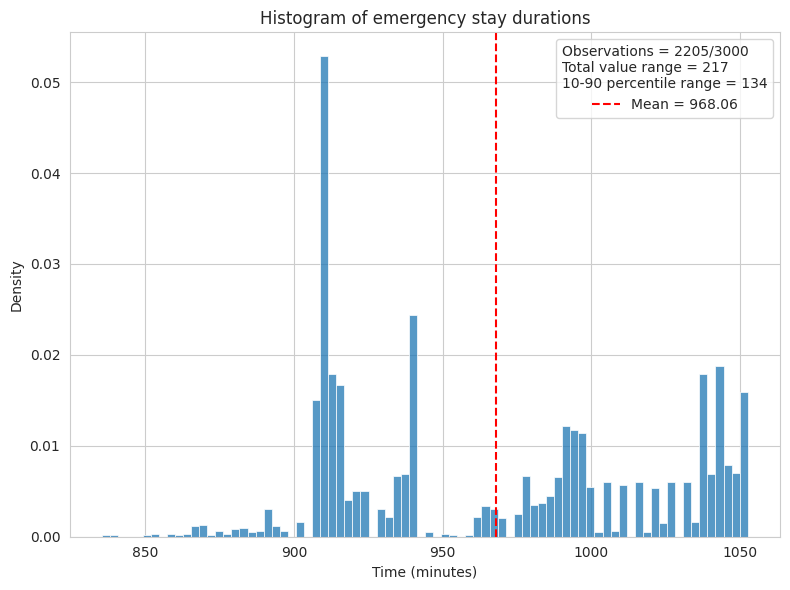

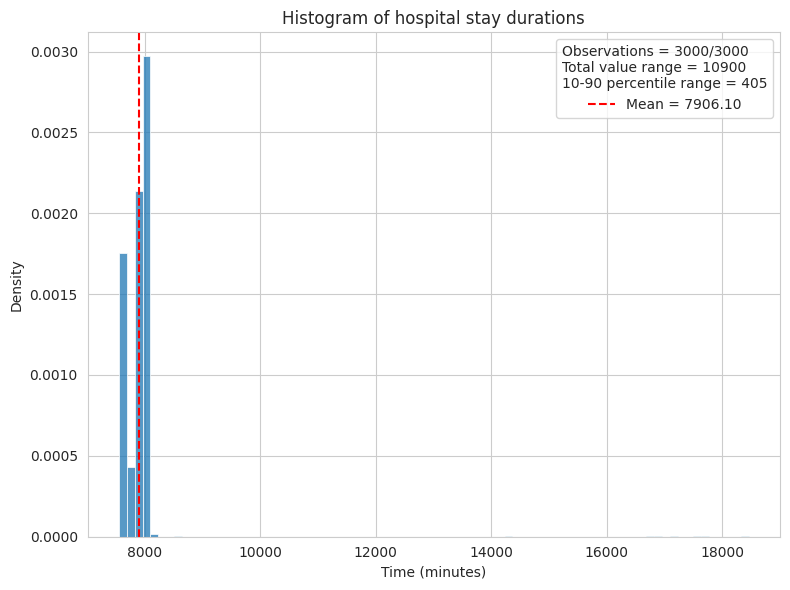

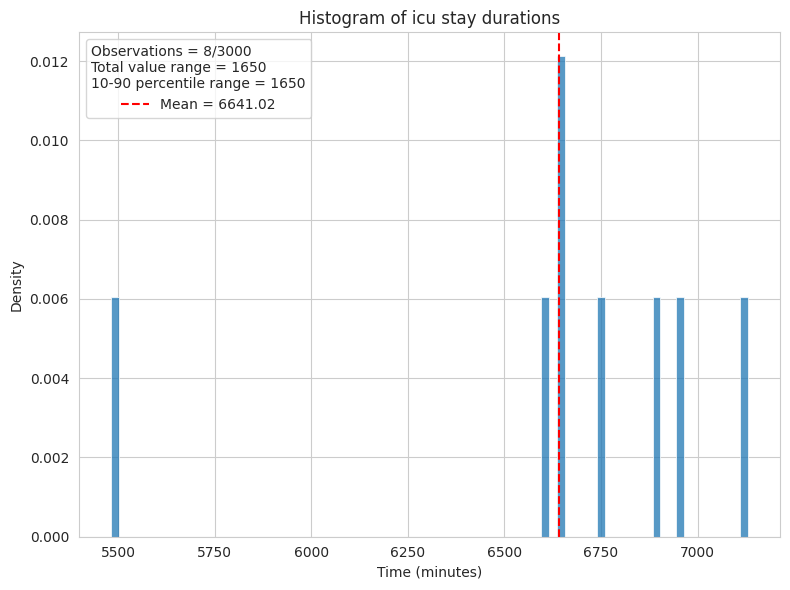

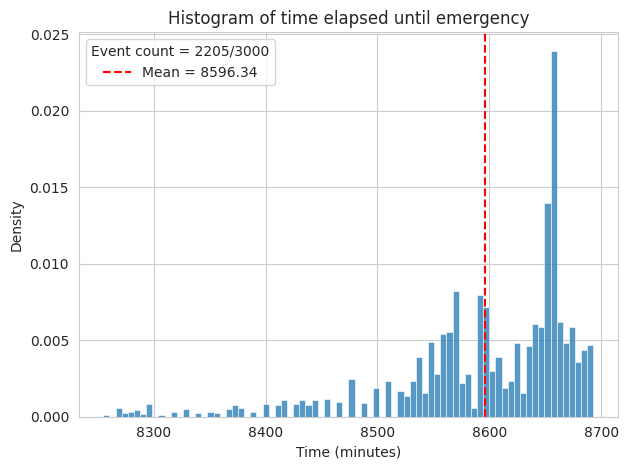

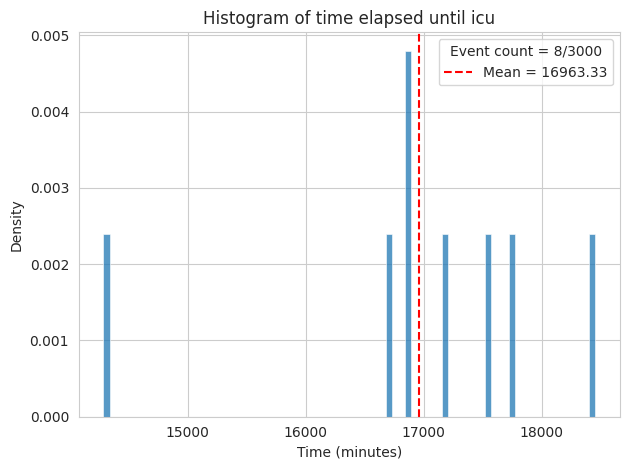

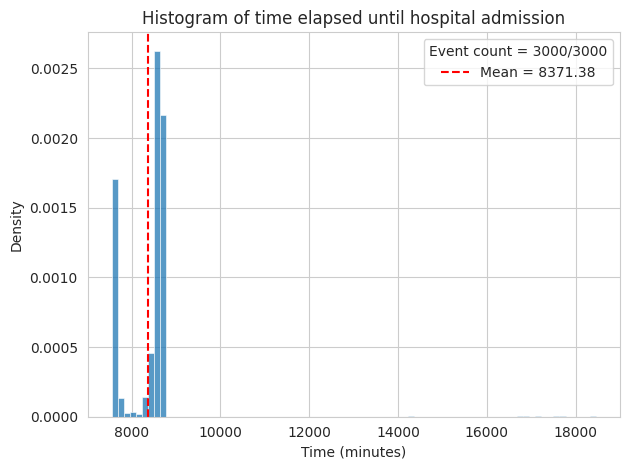

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


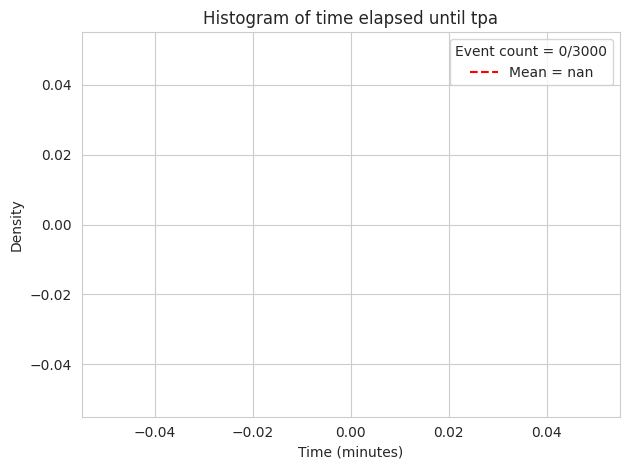

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


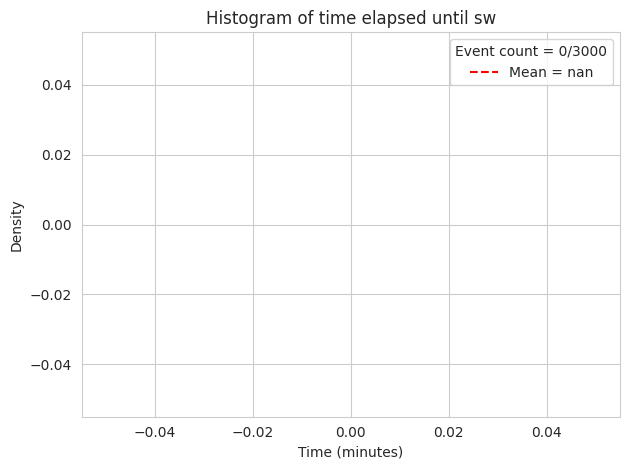

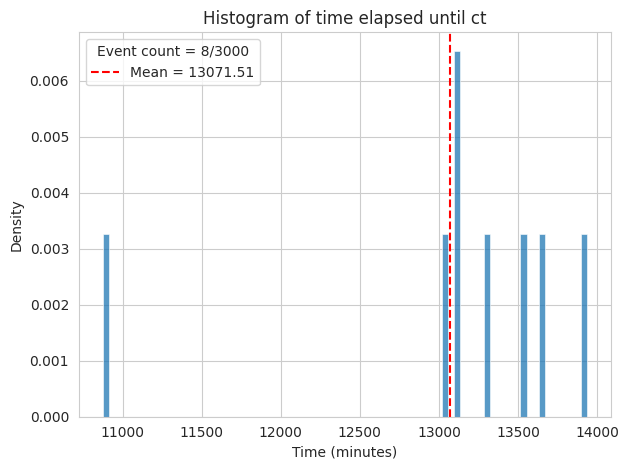

In [26]:
post_process(model)

## 3 - 4+

Epoch 1  --> Training: total loss=2.6317 -- Validation: total loss=3.3011 (Event loss=2.2299 + Tdelta loss=1.0712) -- Run time: 8.68 seconds.
Epoch 2  --> Training: total loss=2.7985 -- Validation: total loss=3.3535 (Event loss=2.2862 + Tdelta loss=1.0673) -- Run time: 6.20 seconds.
Epoch 3  --> Training: total loss=3.0231 -- Validation: total loss=3.1783 (Event loss=2.1072 + Tdelta loss=1.0710) -- Run time: 8.11 seconds.
Epoch 4  --> Training: total loss=2.2524 -- Validation: total loss=3.1297 (Event loss=2.0982 + Tdelta loss=1.0316) -- Run time: 8.23 seconds.
Epoch 5  --> Training: total loss=4.5115 -- Validation: total loss=2.7379 (Event loss=1.6817 + Tdelta loss=1.0562) -- Run time: 7.97 seconds.
Epoch 6  --> Training: total loss=1.6884 -- Validation: total loss=2.3306 (Event loss=1.2787 + Tdelta loss=1.0519) -- Run time: 7.99 seconds.
Epoch 7  --> Training: total loss=1.9396 -- Validation: total loss=2.2529 (Event loss=1.2354 + Tdelta loss=1.0175) -- Run time: 7.99 seconds.
Epoch 

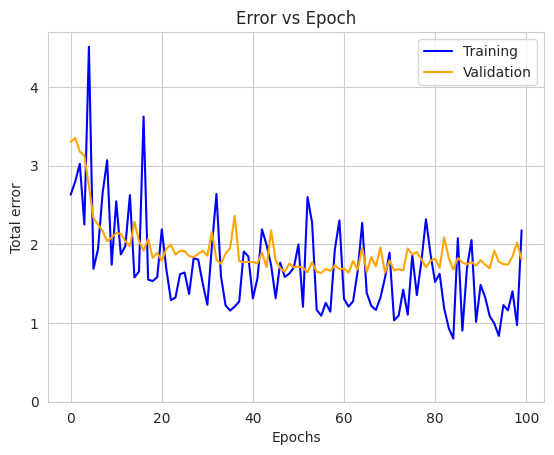

In [28]:
x, y_events, y_tdelta = load_data(4)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=64, sequence_length=128, decoders_in_stack=2, num_heads=8, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2189.0    72.966667
2      ED_outtime  2189.0    72.966667
3         CT_time  3000.0   100.000000
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2578.0    85.933333


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


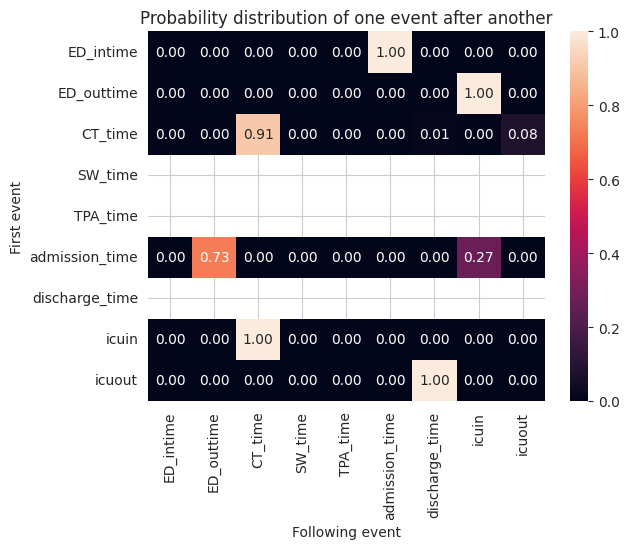

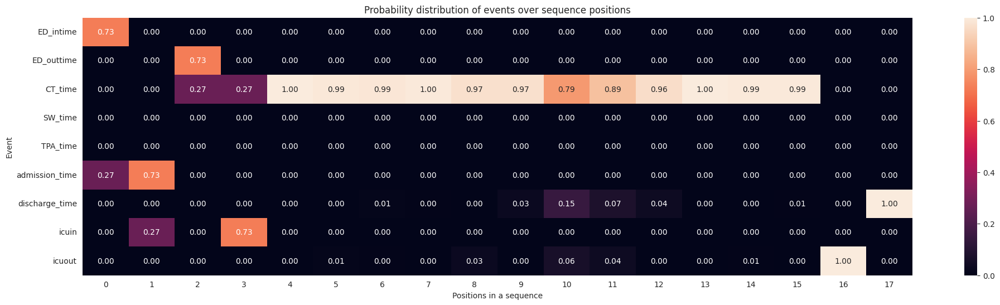

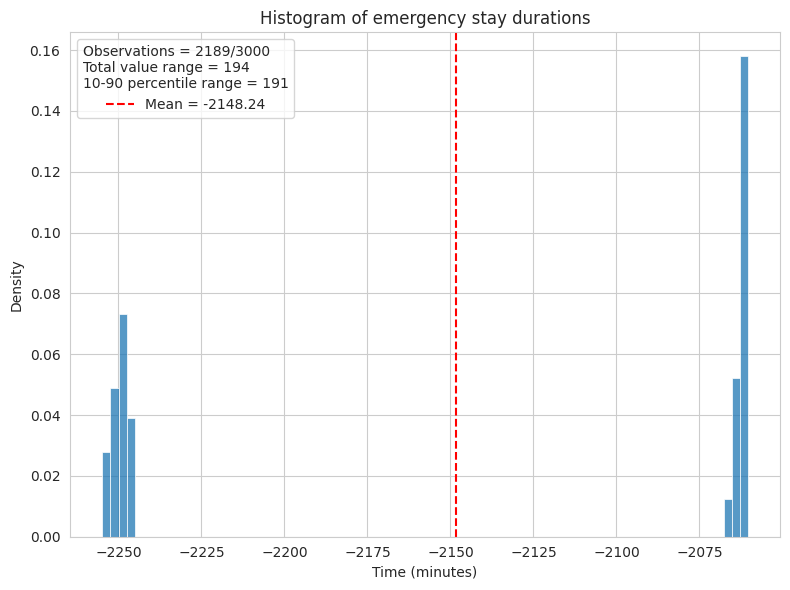

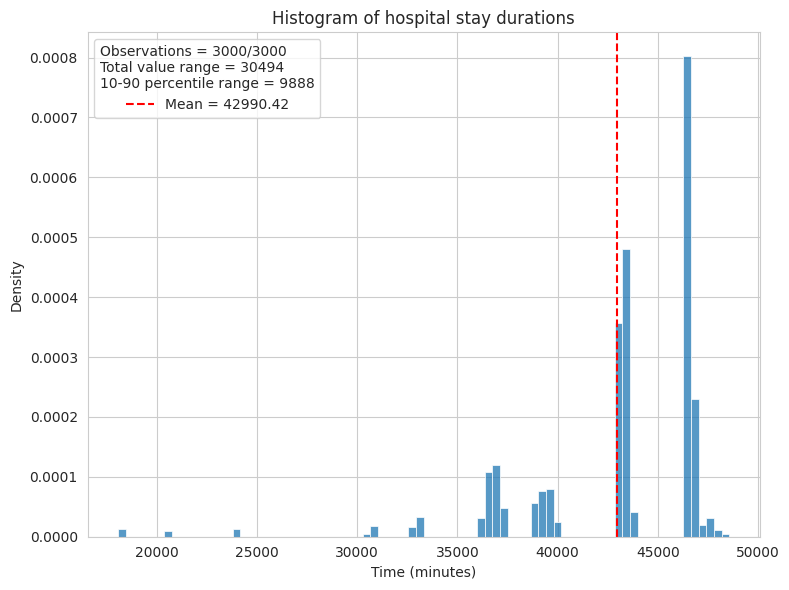

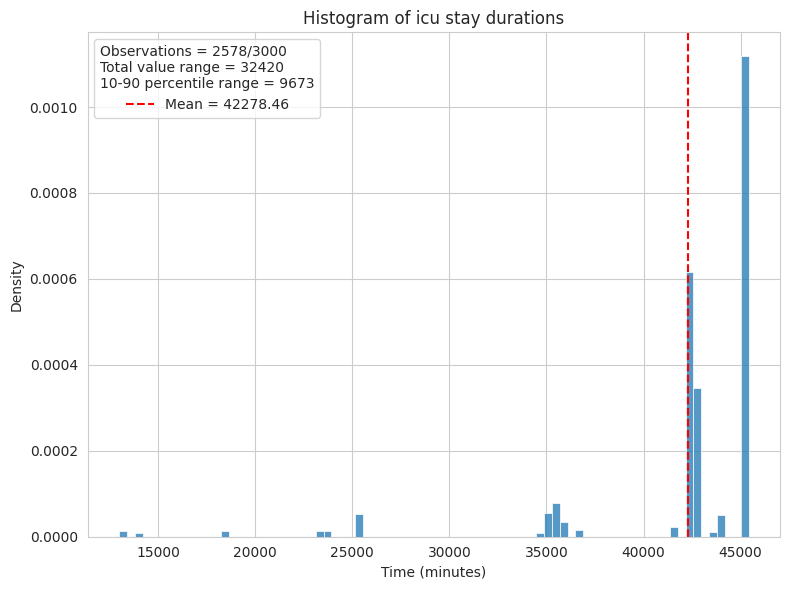

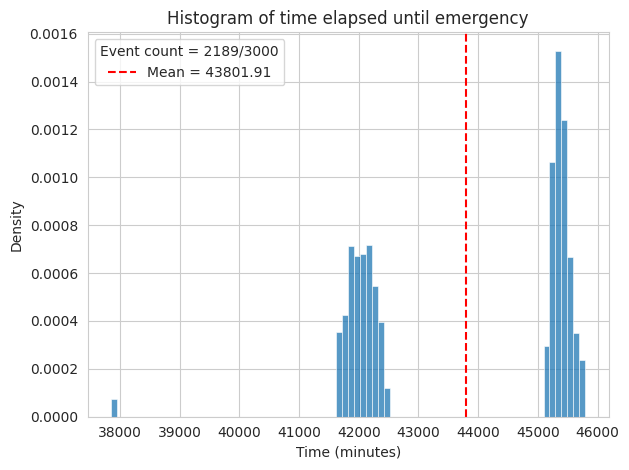

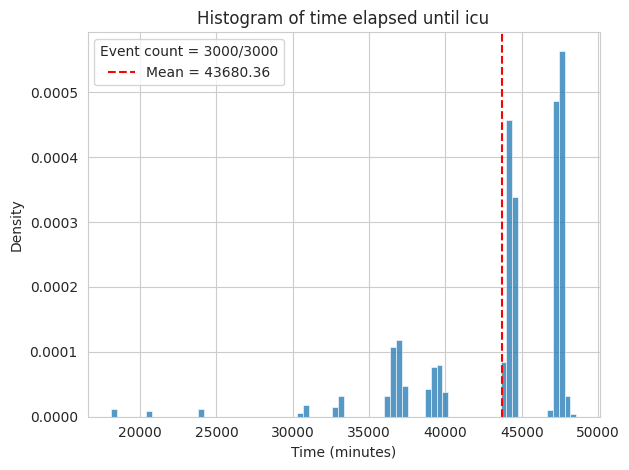

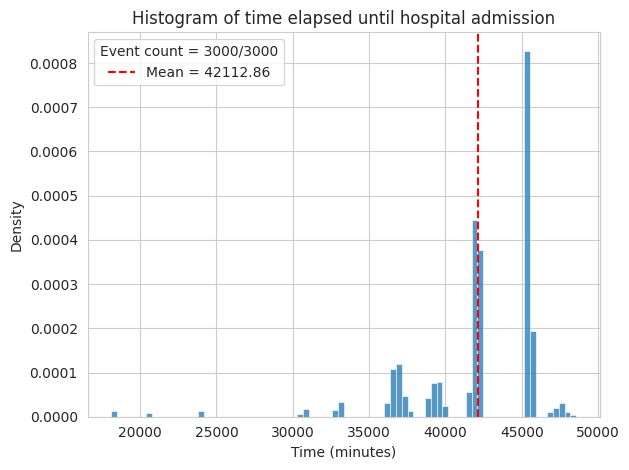

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


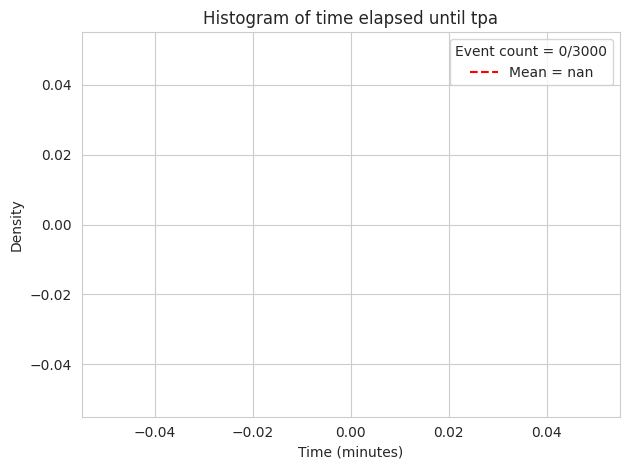

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


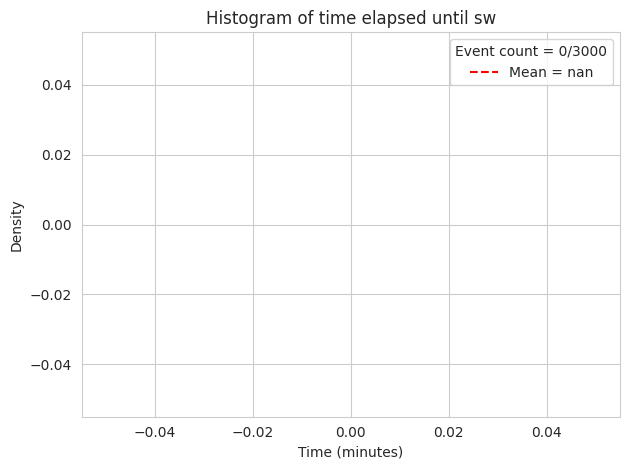

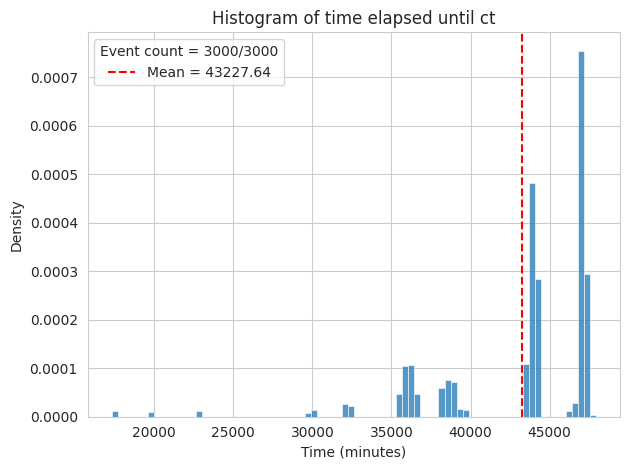

In [29]:
post_process(model)

## 3 - 6+

Epoch 1  --> Training: total loss=4.6753 -- Validation: total loss=3.2539 (Event loss=2.1369 + Tdelta loss=1.1170) -- Run time: 7.27 seconds.
Epoch 2  --> Training: total loss=3.0045 -- Validation: total loss=3.3145 (Event loss=2.2465 + Tdelta loss=1.0680) -- Run time: 5.51 seconds.
Epoch 3  --> Training: total loss=3.0668 -- Validation: total loss=3.2231 (Event loss=2.1819 + Tdelta loss=1.0413) -- Run time: 7.28 seconds.
Epoch 4  --> Training: total loss=3.7534 -- Validation: total loss=3.1925 (Event loss=2.1754 + Tdelta loss=1.0170) -- Run time: 7.25 seconds.
Epoch 5  --> Training: total loss=2.1358 -- Validation: total loss=2.8339 (Event loss=1.8571 + Tdelta loss=0.9768) -- Run time: 7.26 seconds.
Epoch 6  --> Training: total loss=2.4403 -- Validation: total loss=2.2842 (Event loss=1.3319 + Tdelta loss=0.9523) -- Run time: 7.26 seconds.
Epoch 7  --> Training: total loss=2.6315 -- Validation: total loss=2.2856 (Event loss=1.3018 + Tdelta loss=0.9838) -- Run time: 5.50 seconds.
Epoch 

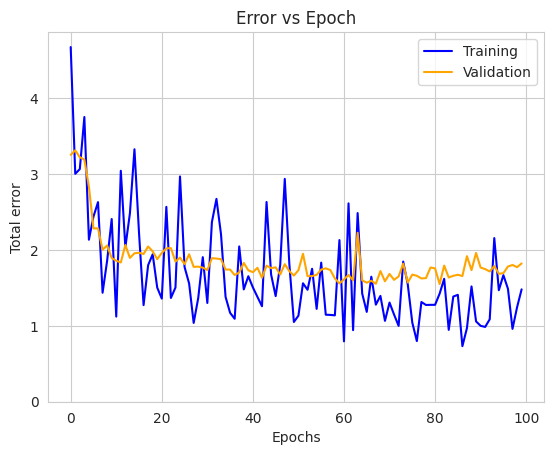

In [30]:
x, y_events, y_tdelta = load_data(6)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=64, sequence_length=128, decoders_in_stack=2, num_heads=8, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2164.0    72.133333
2      ED_outtime  2164.0    72.133333
3         CT_time  3000.0   100.000000
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  3000.0   100.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


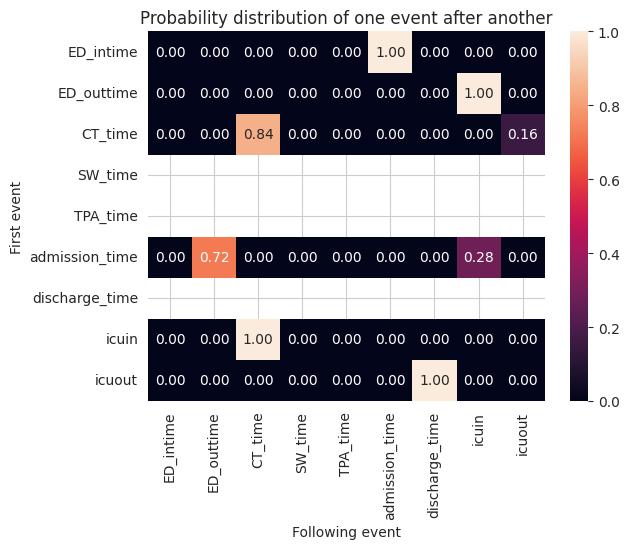

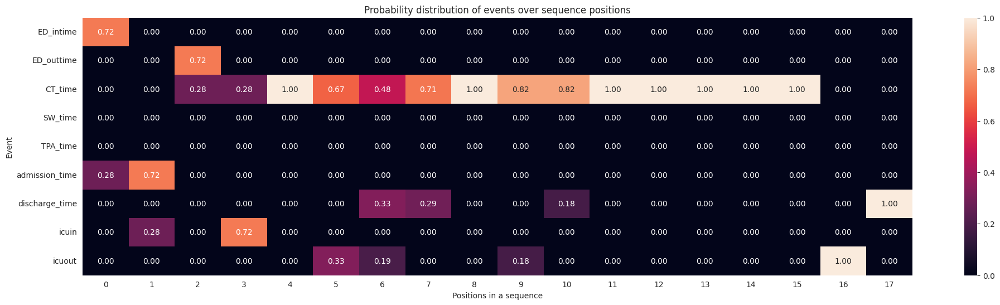

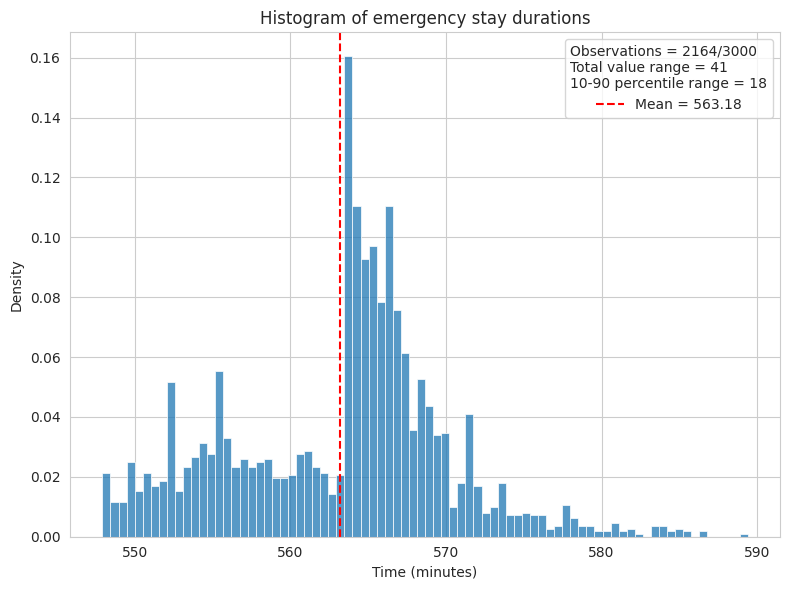

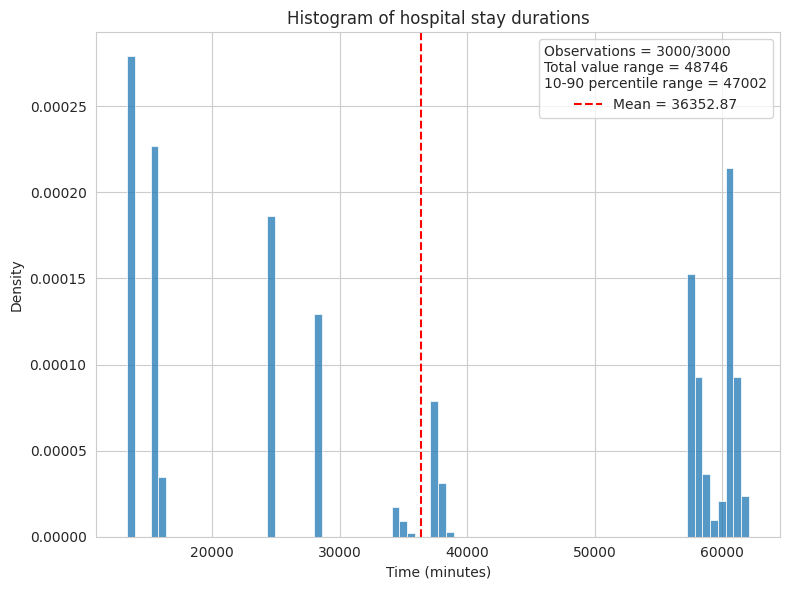

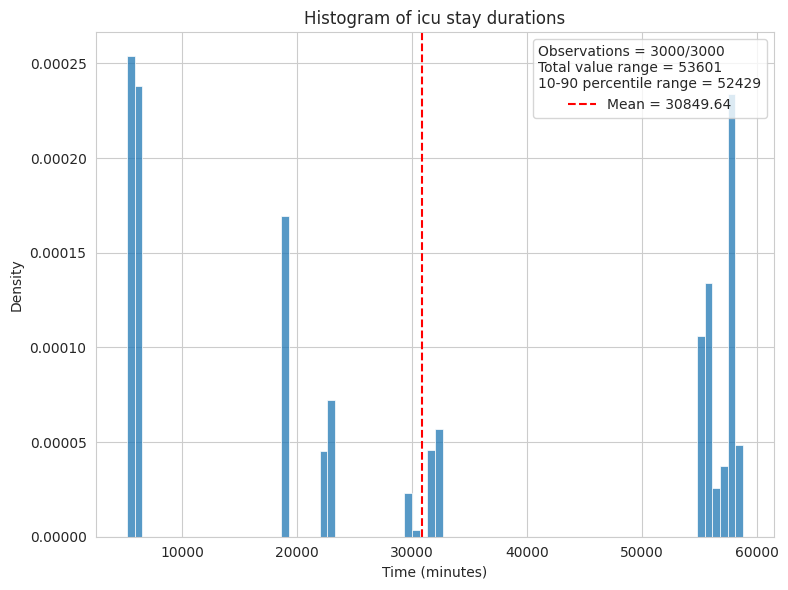

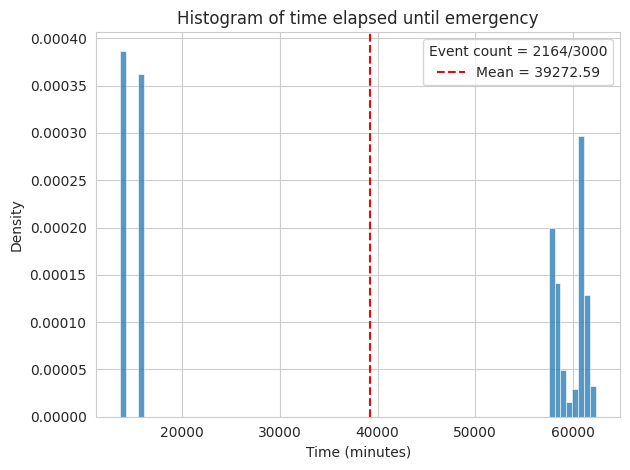

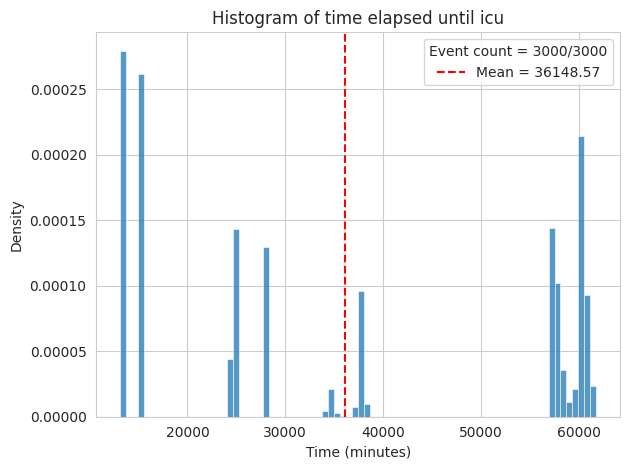

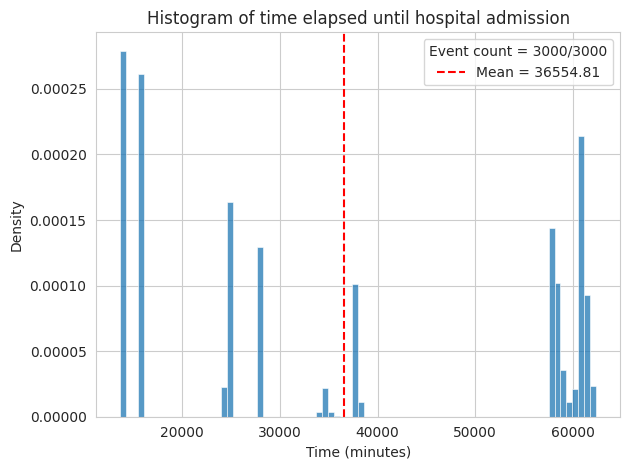

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


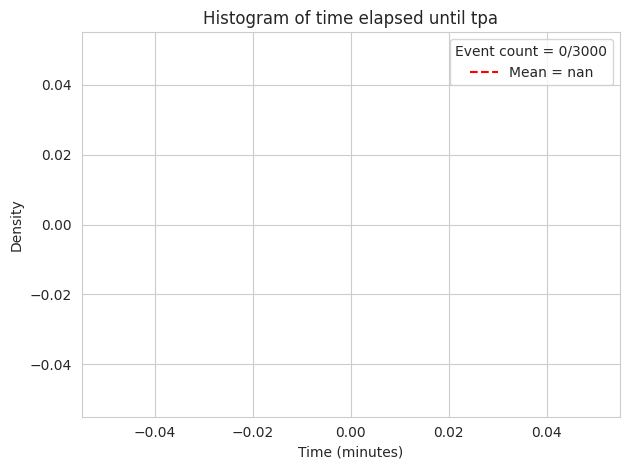

/home/logan/Documents/GitHub/Healthsformer/analysis.py:198: RuntimeWarning: Mean of empty slice.
  plt.axvline(x=np.array(periods).mean(), color='red', linestyle='--', label=f'Mean = {np.array(periods).mean():.2f}')
/home/logan/Documents/venvs/my3.11.9/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


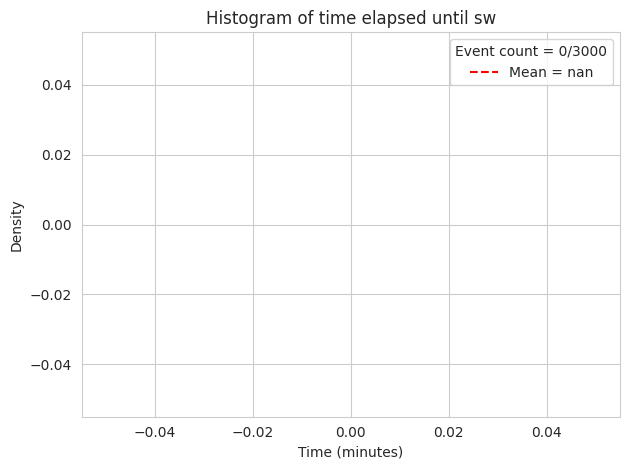

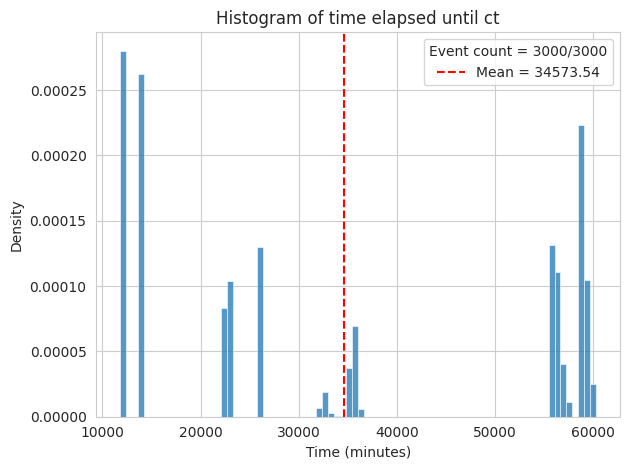

In [31]:
post_process(model)

## 3 - 8+

In [ ]:
x, y_events, y_tdelta = load_data(8)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=64, sequence_length=128, decoders_in_stack=2, num_heads=8, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train()
model.test()
model.plot_error_vs_epoch()

In [ ]:
post_process(model)

# 5

In [2]:
model = base.Net(device=device, input_length=373, d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=16, dropout=0.1, activation=nn.GELU())
sum(p.numel() for p in model.parameters() if p.requires_grad)
# not nearly as much data as 10*the number of parameters of the model = 900,000+ for this model

459283

## 5 - full

Epoch 1  --> Training: total loss=0.6887 -- Validation: total loss=1.3770 (Event loss=0.4328 + Tdelta loss=0.9442) -- Run time: 1.74 seconds.
Epoch 2  --> Training: total loss=1.3608 -- Validation: total loss=1.1618 (Event loss=0.3884 + Tdelta loss=0.7734) -- Run time: 1.53 seconds.
Epoch 3  --> Training: total loss=1.1374 -- Validation: total loss=1.1019 (Event loss=0.3752 + Tdelta loss=0.7266) -- Run time: 1.39 seconds.
Epoch 4  --> Training: total loss=1.0034 -- Validation: total loss=1.1181 (Event loss=0.3804 + Tdelta loss=0.7377) -- Run time: 1.44 seconds.
Epoch 5  --> Training: total loss=1.0070 -- Validation: total loss=1.1424 (Event loss=0.3737 + Tdelta loss=0.7687) -- Run time: 1.69 seconds.
Epoch 6  --> Training: total loss=1.3171 -- Validation: total loss=1.1297 (Event loss=0.3744 + Tdelta loss=0.7554) -- Run time: 1.75 seconds.
Epoch 7  --> Training: total loss=1.4688 -- Validation: total loss=1.0890 (Event loss=0.3683 + Tdelta loss=0.7207) -- Run time: 2.07 seconds.
Epoch 

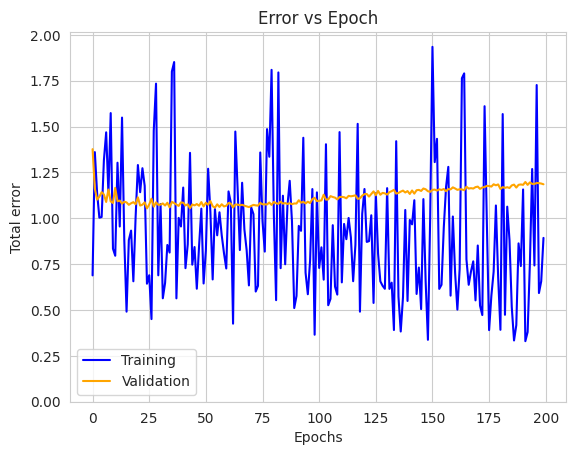

In [3]:
x, y_events, y_tdelta = load_data()

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=16, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2141.0    71.366667
2      ED_outtime  2141.0    71.366667
3         CT_time     0.0     0.000000
4         SW_time     0.0     0.000000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin     0.0     0.000000
9          icuout     0.0     0.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


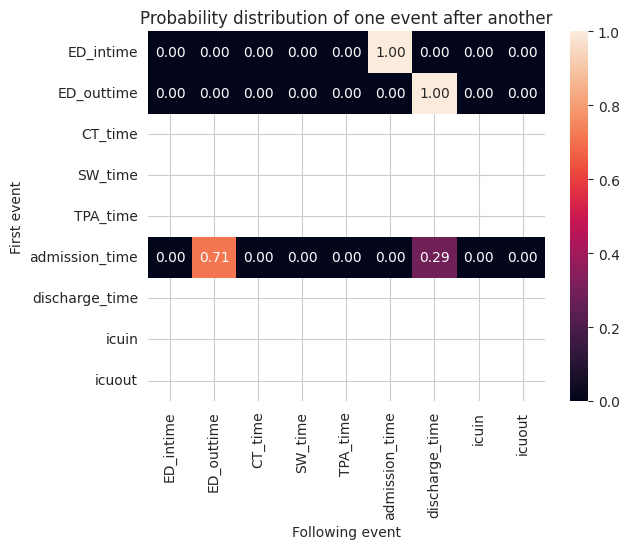

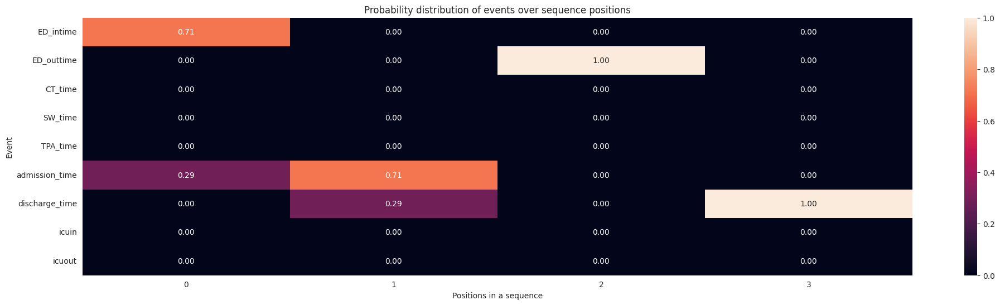

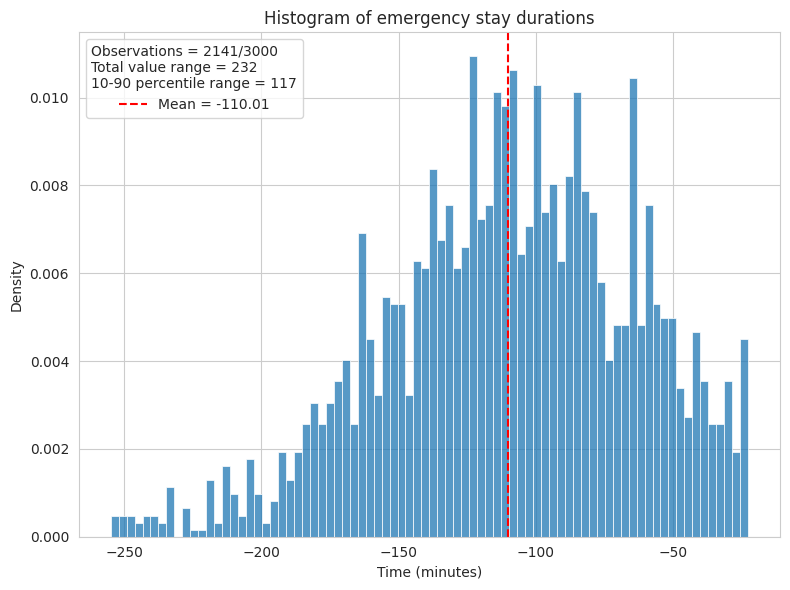

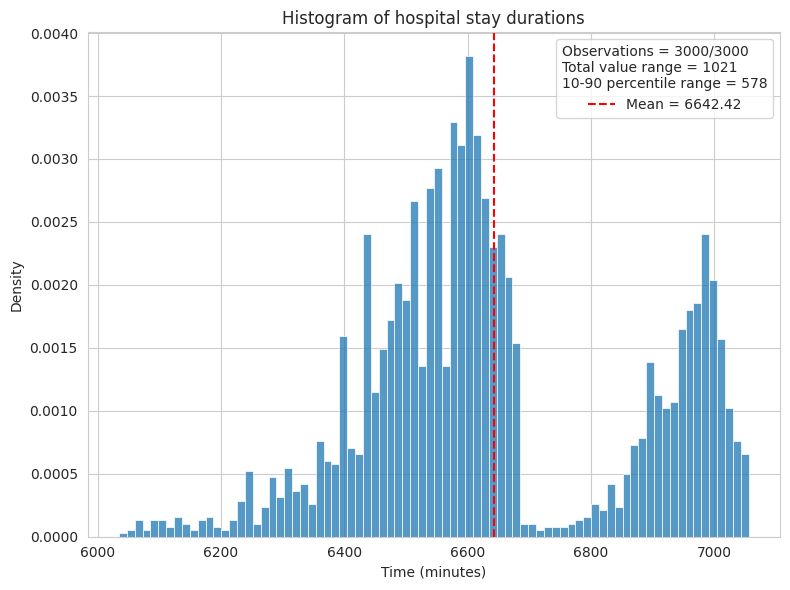

No intervals for event = icu found.


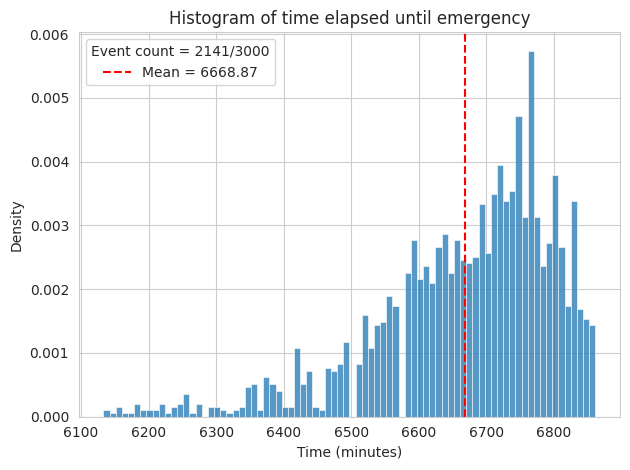

No intervals for event = icu found.


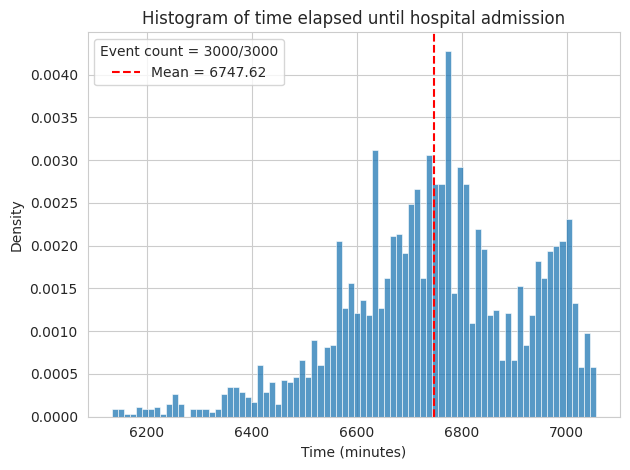

No intervals for event = tpa found.
No intervals for event = sw found.
No intervals for event = ct found.


In [4]:
post_process(model)

## 5 - 4+

Epoch 1  --> Training: total loss=3.2394 -- Validation: total loss=2.7652 (Event loss=1.6749 + Tdelta loss=1.0904) -- Run time: 0.54 seconds.
Epoch 2  --> Training: total loss=1.8419 -- Validation: total loss=2.0099 (Event loss=1.0142 + Tdelta loss=0.9957) -- Run time: 0.56 seconds.
Epoch 3  --> Training: total loss=1.6921 -- Validation: total loss=1.7902 (Event loss=0.7902 + Tdelta loss=1.0000) -- Run time: 0.51 seconds.
Epoch 4  --> Training: total loss=1.4870 -- Validation: total loss=1.7054 (Event loss=0.7414 + Tdelta loss=0.9640) -- Run time: 0.53 seconds.
Epoch 5  --> Training: total loss=1.5440 -- Validation: total loss=1.6964 (Event loss=0.7398 + Tdelta loss=0.9566) -- Run time: 0.56 seconds.
Epoch 6  --> Training: total loss=2.2931 -- Validation: total loss=1.7235 (Event loss=0.7054 + Tdelta loss=1.0182) -- Run time: 0.52 seconds.
Epoch 7  --> Training: total loss=1.6897 -- Validation: total loss=1.6589 (Event loss=0.7097 + Tdelta loss=0.9492) -- Run time: 0.55 seconds.
Epoch 

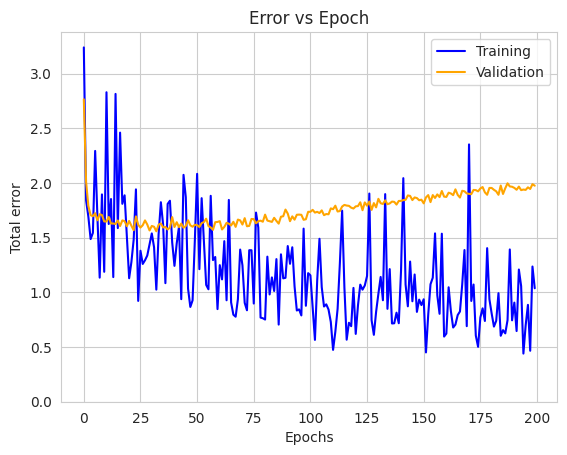

In [11]:
x, y_events, y_tdelta = load_data(4)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=16, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2152.0    71.733333
2      ED_outtime  2152.0    71.733333
3         CT_time  3000.0   100.000000
4         SW_time     0.0     0.000000
5        TPA_time   278.0     9.266667
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2380.0    79.333333


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


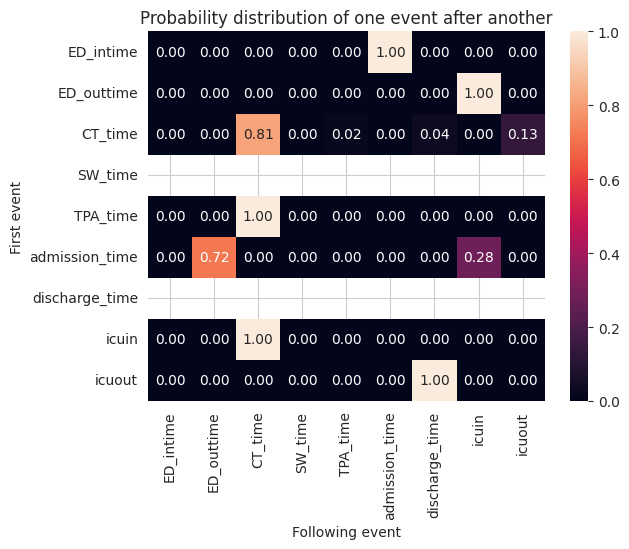

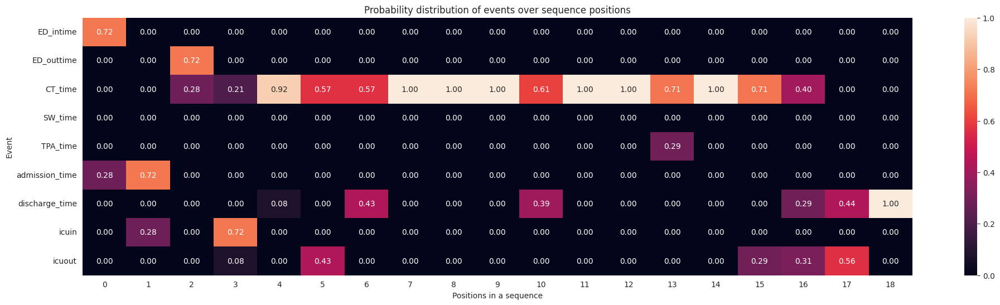

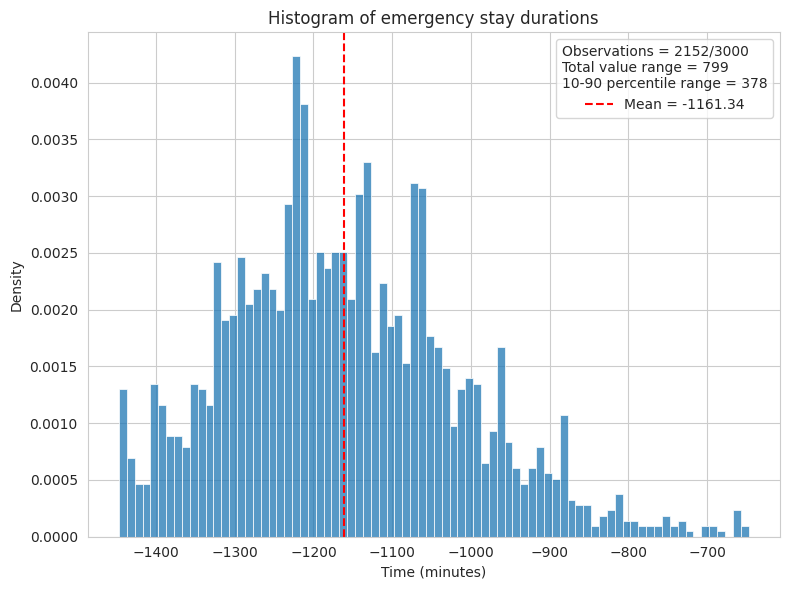

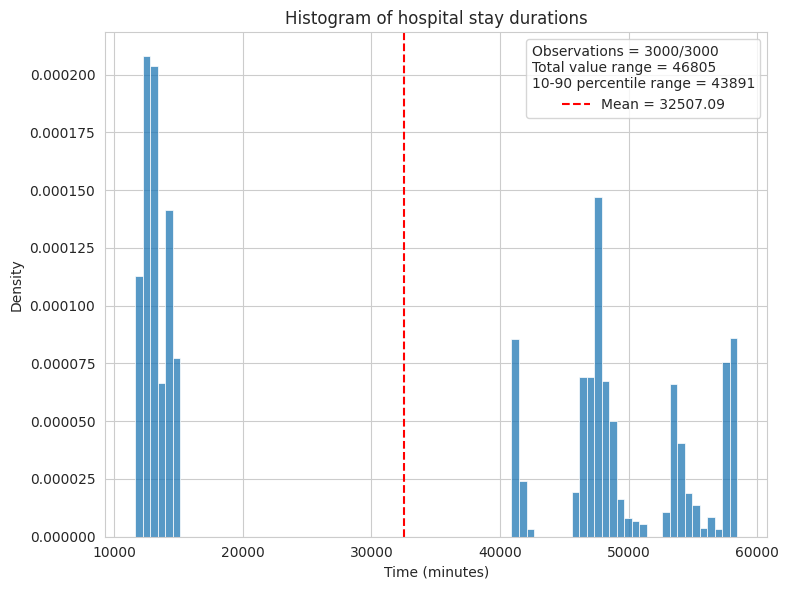

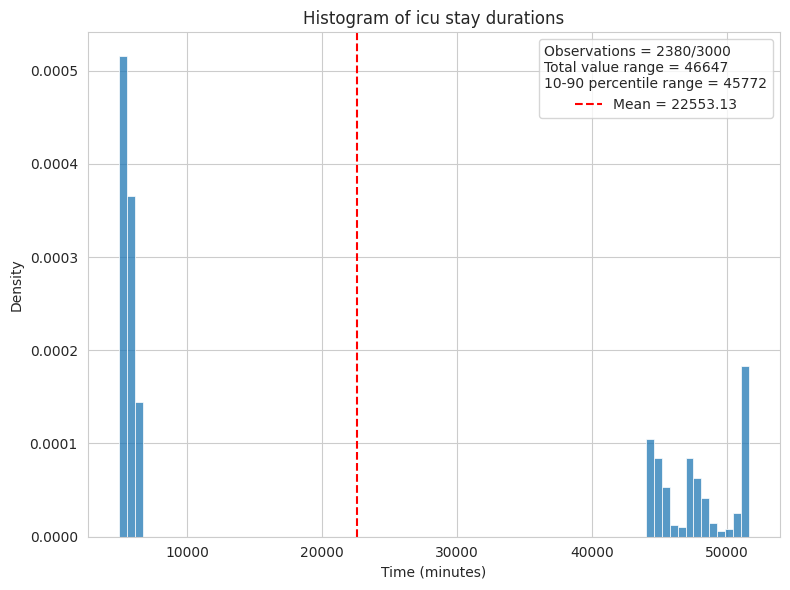

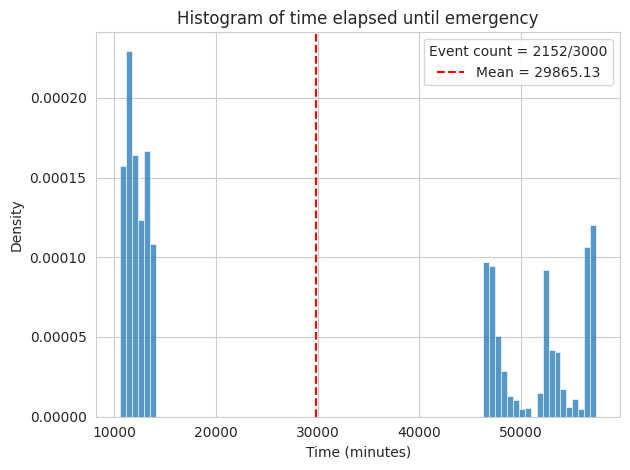

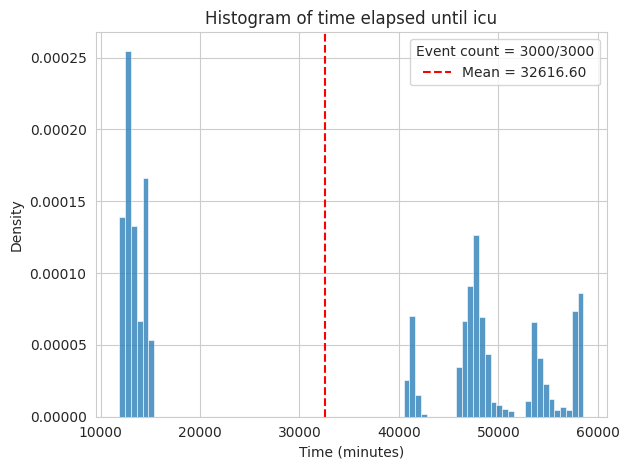

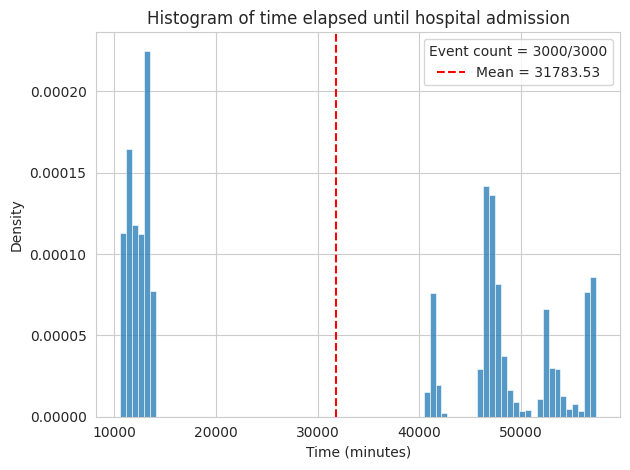

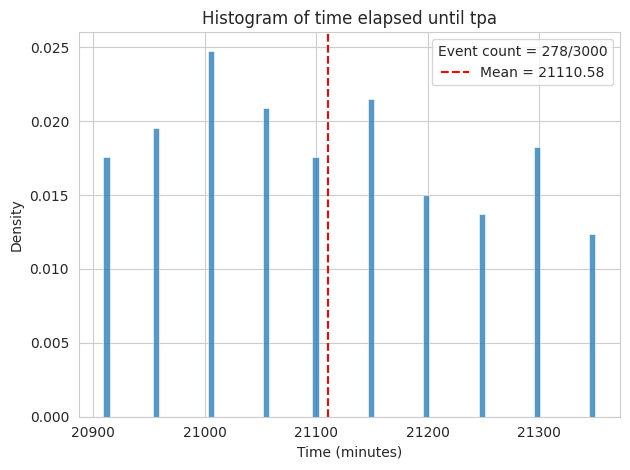

No intervals for event = sw found.


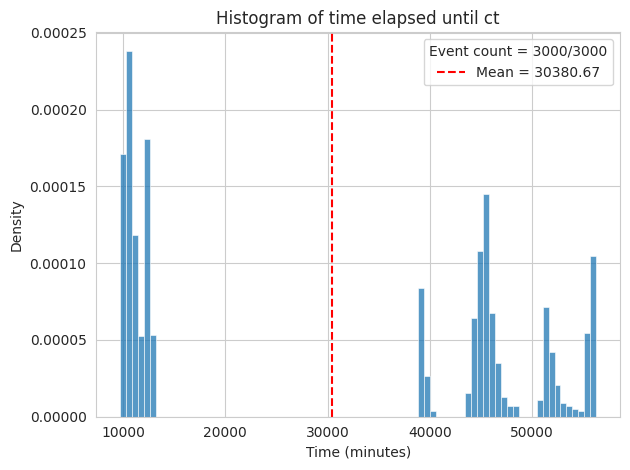

In [12]:
post_process(model)

## 5 - 6+

Epoch 1  --> Training: total loss=3.7259 -- Validation: total loss=2.7463 (Event loss=1.7778 + Tdelta loss=0.9685) -- Run time: 0.44 seconds.
Epoch 2  --> Training: total loss=2.5264 -- Validation: total loss=2.1017 (Event loss=1.0201 + Tdelta loss=1.0816) -- Run time: 0.50 seconds.
Epoch 3  --> Training: total loss=1.8446 -- Validation: total loss=1.7619 (Event loss=0.8241 + Tdelta loss=0.9378) -- Run time: 0.70 seconds.
Epoch 4  --> Training: total loss=1.2549 -- Validation: total loss=1.6908 (Event loss=0.7749 + Tdelta loss=0.9159) -- Run time: 0.59 seconds.
Epoch 5  --> Training: total loss=2.1219 -- Validation: total loss=1.6530 (Event loss=0.7528 + Tdelta loss=0.9002) -- Run time: 0.44 seconds.
Epoch 6  --> Training: total loss=2.1098 -- Validation: total loss=1.6464 (Event loss=0.7184 + Tdelta loss=0.9280) -- Run time: 0.49 seconds.
Epoch 7  --> Training: total loss=2.2055 -- Validation: total loss=1.6636 (Event loss=0.7332 + Tdelta loss=0.9304) -- Run time: 0.74 seconds.
Epoch 

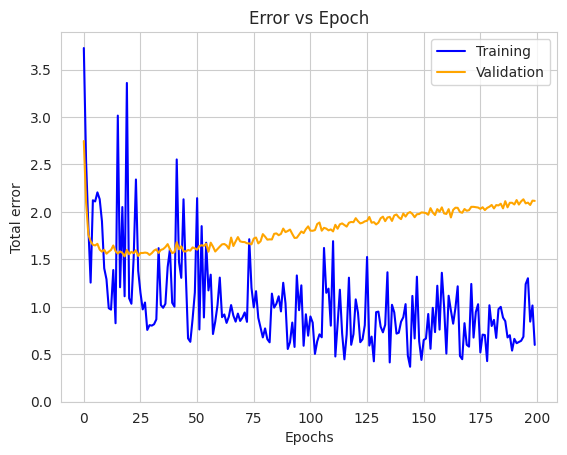

In [7]:
x, y_events, y_tdelta = load_data(6)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=16, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2193.0    73.100000
2      ED_outtime  2193.0    73.100000
3         CT_time  2193.0    73.100000
4         SW_time   807.0    26.900000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2749.0    91.633333


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


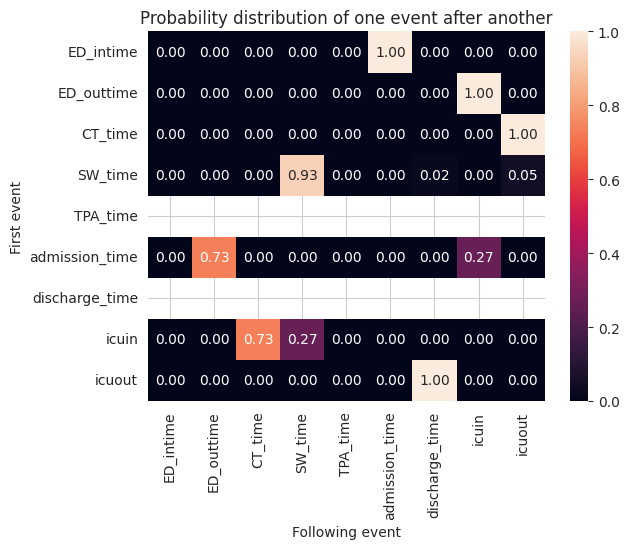

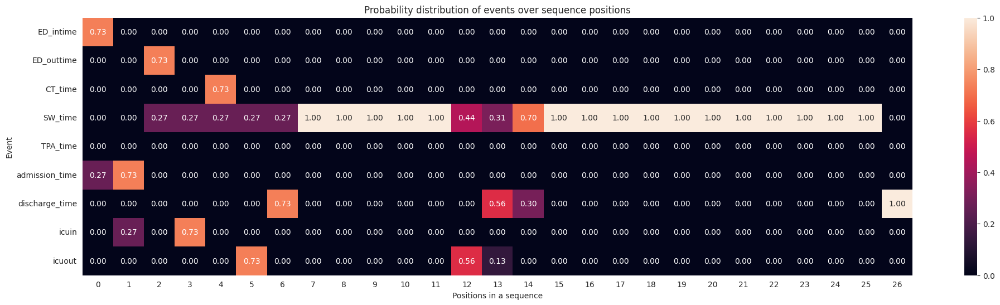

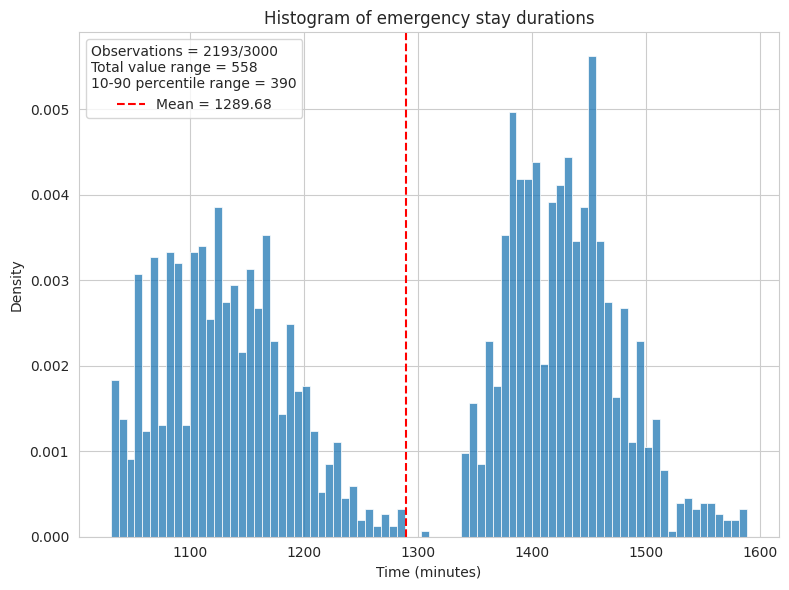

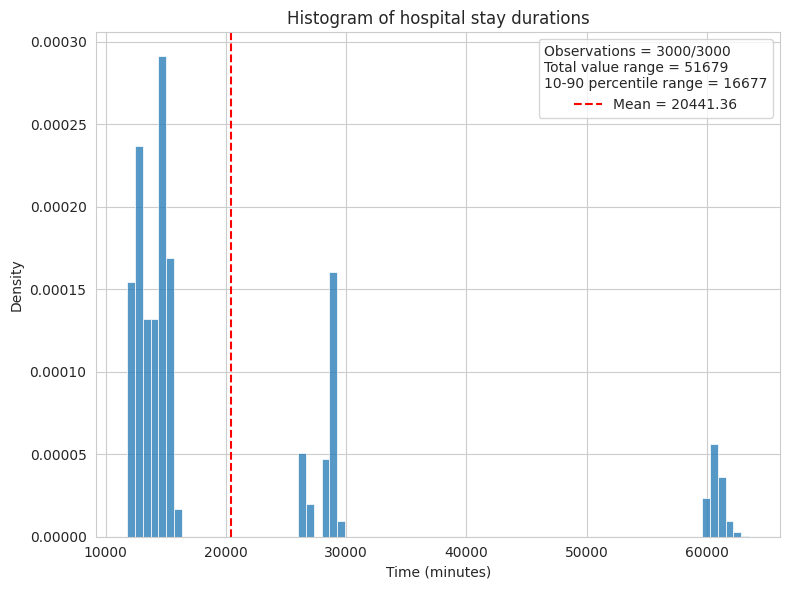

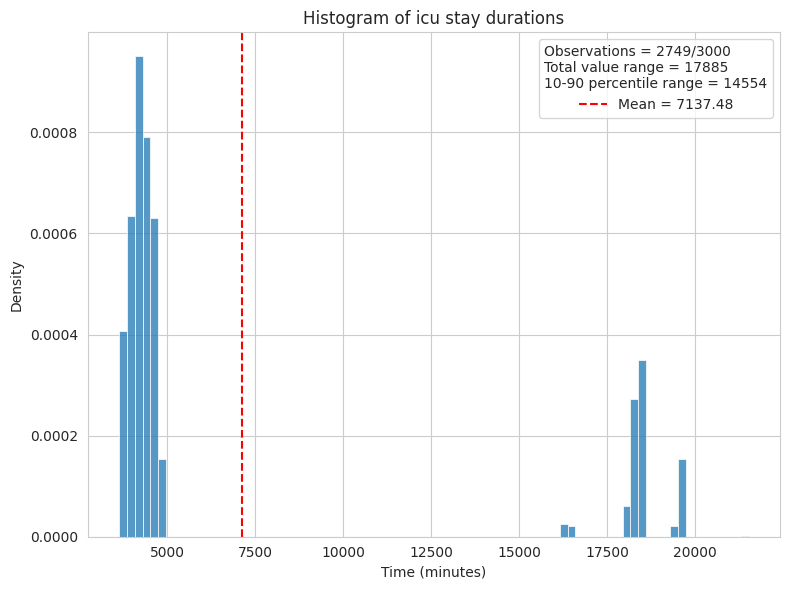

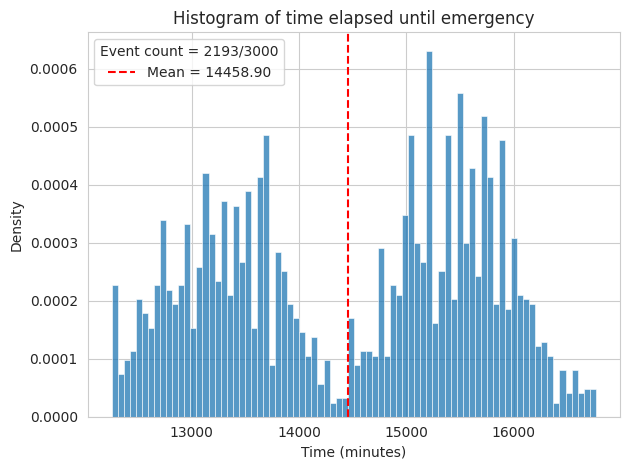

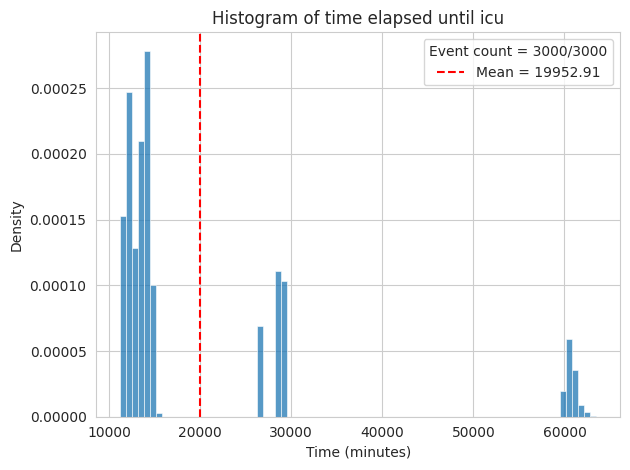

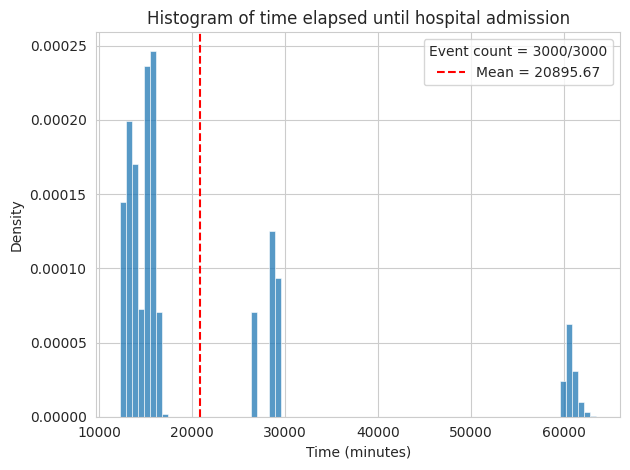

No intervals for event = tpa found.


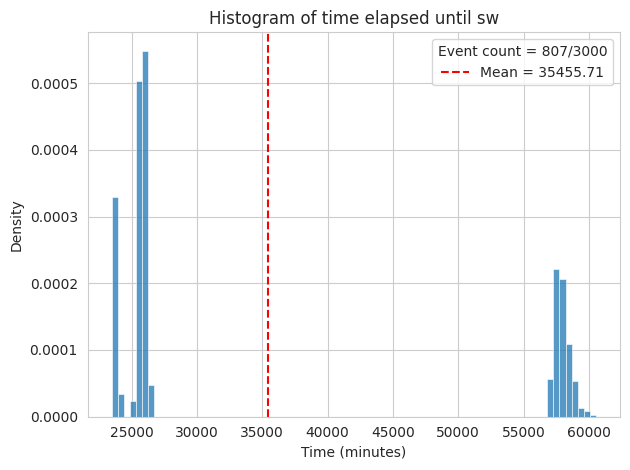

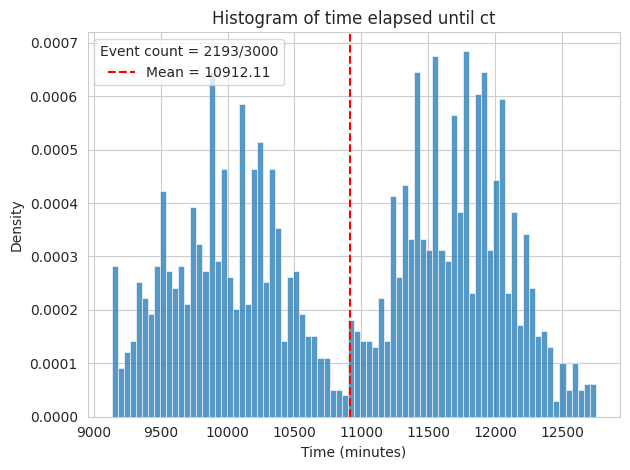

In [8]:
post_process(model)

## 5 - 8+

Epoch 1  --> Training: total loss=2.9948 -- Validation: total loss=2.9707 (Event loss=1.9367 + Tdelta loss=1.0340) -- Run time: 0.29 seconds.
Epoch 2  --> Training: total loss=2.1887 -- Validation: total loss=2.4916 (Event loss=1.5067 + Tdelta loss=0.9849) -- Run time: 0.29 seconds.
Epoch 3  --> Training: total loss=1.9495 -- Validation: total loss=2.1347 (Event loss=1.1785 + Tdelta loss=0.9563) -- Run time: 0.30 seconds.
Epoch 4  --> Training: total loss=1.7307 -- Validation: total loss=1.9646 (Event loss=0.9688 + Tdelta loss=0.9958) -- Run time: 0.29 seconds.
Epoch 5  --> Training: total loss=1.3768 -- Validation: total loss=1.8577 (Event loss=0.8857 + Tdelta loss=0.9721) -- Run time: 0.31 seconds.
Epoch 6  --> Training: total loss=2.2160 -- Validation: total loss=1.7693 (Event loss=0.8408 + Tdelta loss=0.9284) -- Run time: 0.29 seconds.
Epoch 7  --> Training: total loss=2.1111 -- Validation: total loss=1.7678 (Event loss=0.8194 + Tdelta loss=0.9485) -- Run time: 0.30 seconds.
Epoch 

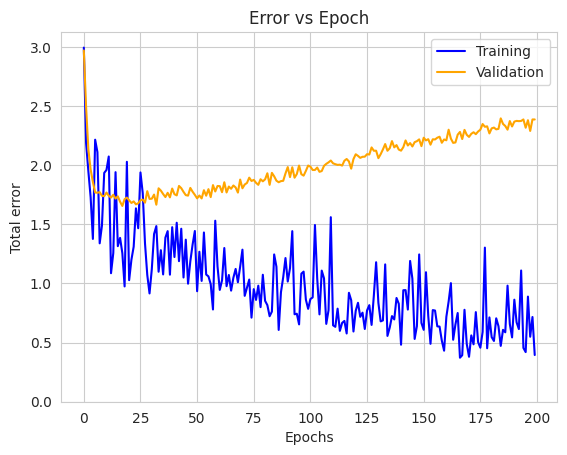

In [9]:
x, y_events, y_tdelta = load_data(8)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=16, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2168.0    72.266667
2      ED_outtime  2168.0    72.266667
3         CT_time  2168.0    72.266667
4         SW_time  2927.0    97.566667
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  3000.0   100.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


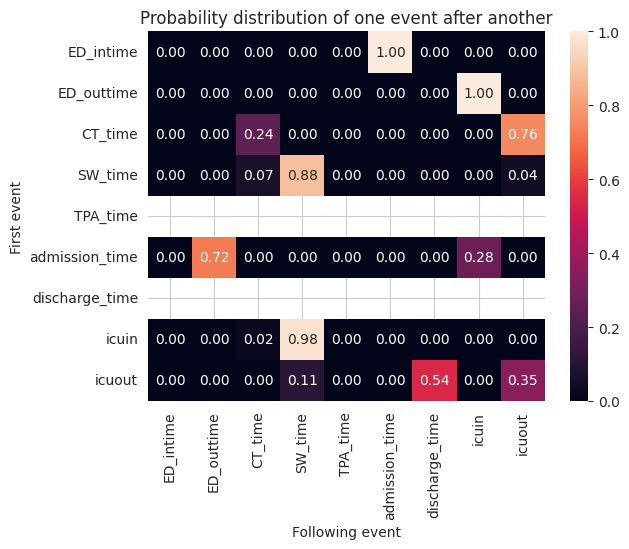

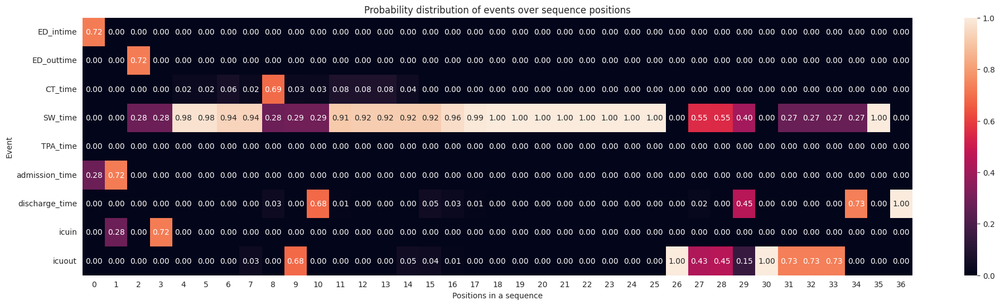

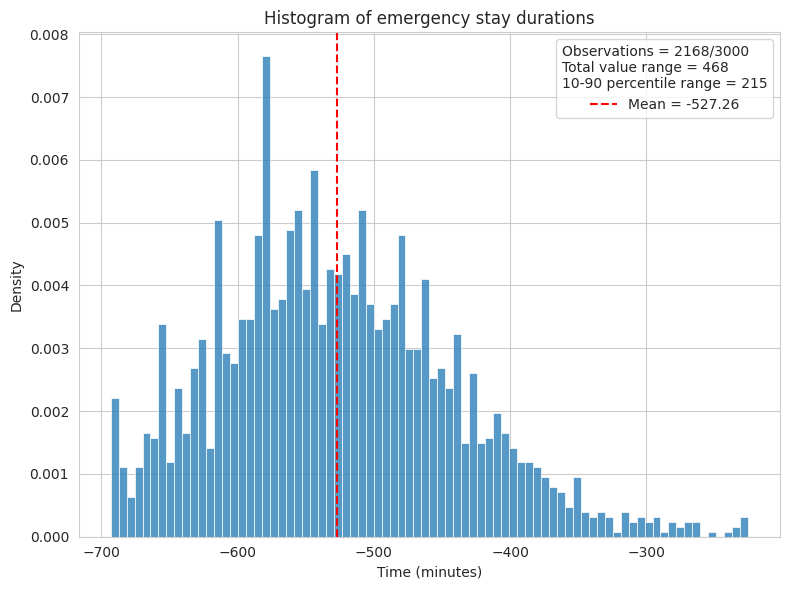

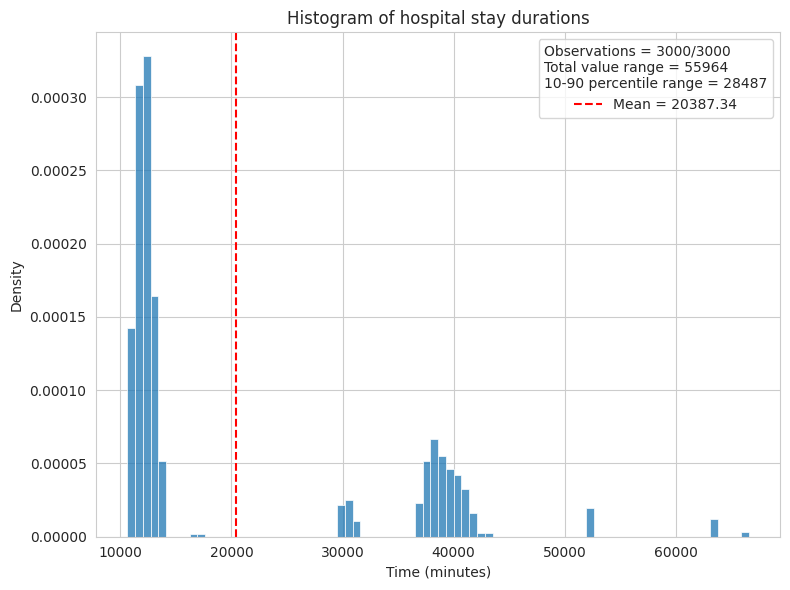

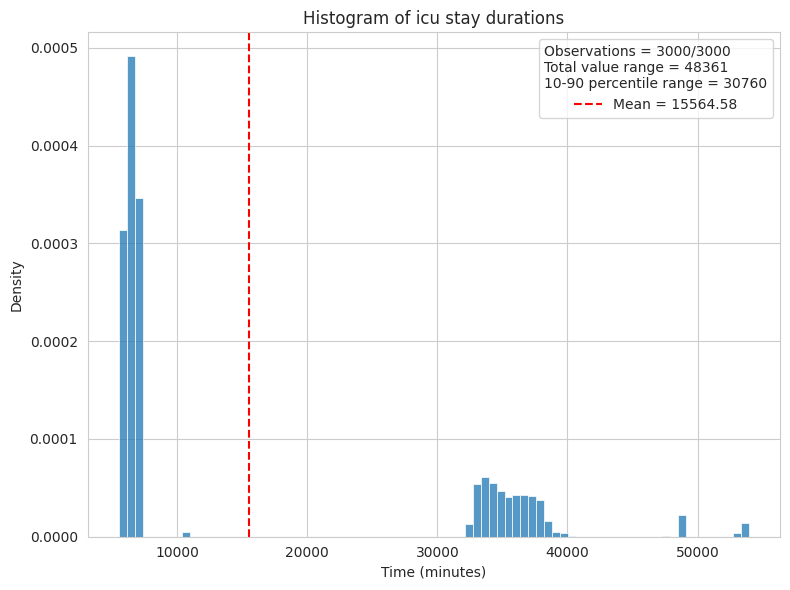

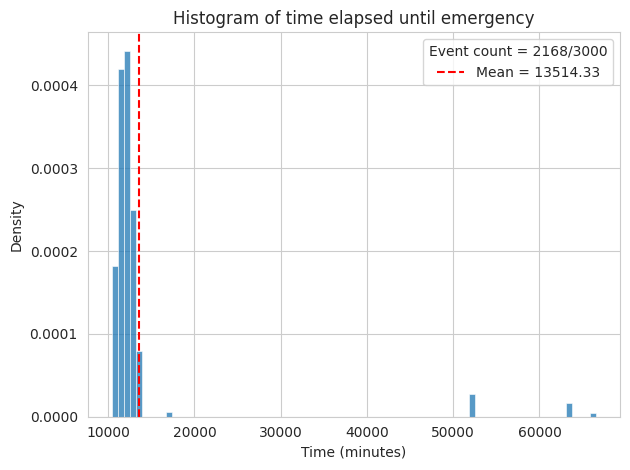

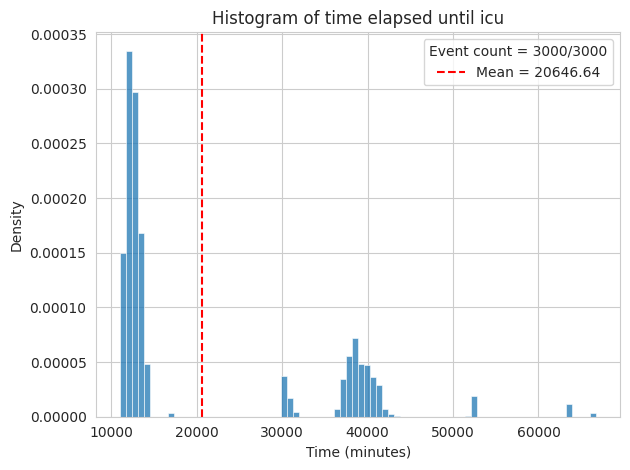

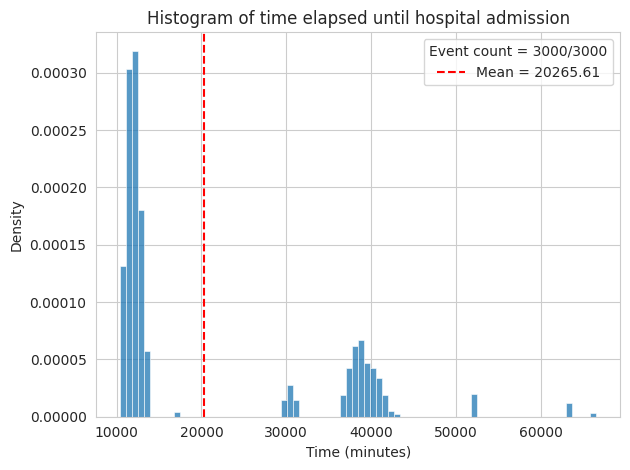

No intervals for event = tpa found.


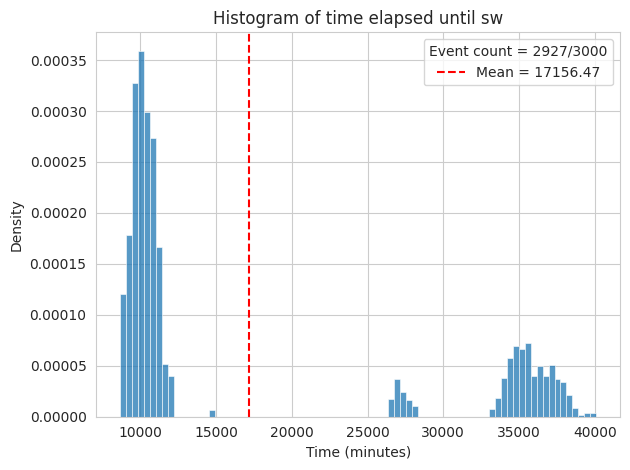

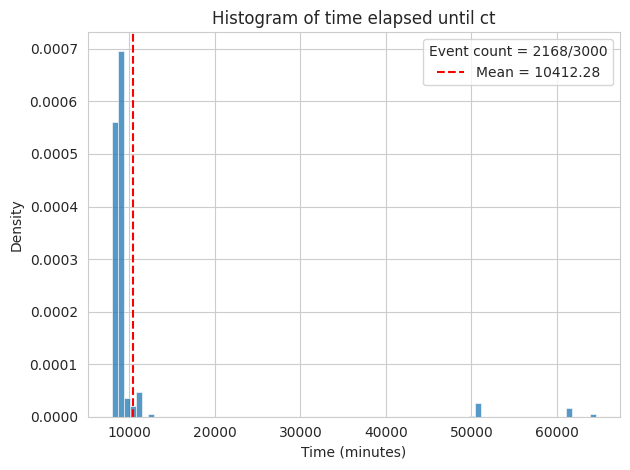

In [10]:
post_process(model)

# 6

In [4]:
model = base.Net(device=device, input_length=373, d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=2, dropout=0.1, activation=nn.GELU())
sum(p.numel() for p in model.parameters() if p.requires_grad)

459283

## 6 - full

Epoch 1  --> Training: total loss=1.6693 -- Validation: total loss=1.2467 (Event loss=0.4195 + Tdelta loss=0.8273) -- Run time: 1.43 seconds.
Epoch 2  --> Training: total loss=1.7168 -- Validation: total loss=1.1375 (Event loss=0.3925 + Tdelta loss=0.7450) -- Run time: 2.85 seconds.
Epoch 3  --> Training: total loss=1.0848 -- Validation: total loss=1.1713 (Event loss=0.4031 + Tdelta loss=0.7682) -- Run time: 2.01 seconds.
Epoch 4  --> Training: total loss=1.1456 -- Validation: total loss=1.1178 (Event loss=0.3889 + Tdelta loss=0.7289) -- Run time: 1.77 seconds.
Epoch 5  --> Training: total loss=1.3996 -- Validation: total loss=1.1223 (Event loss=0.3819 + Tdelta loss=0.7404) -- Run time: 1.94 seconds.
Epoch 6  --> Training: total loss=1.4506 -- Validation: total loss=1.0958 (Event loss=0.3733 + Tdelta loss=0.7225) -- Run time: 1.72 seconds.
Epoch 7  --> Training: total loss=0.8359 -- Validation: total loss=1.0938 (Event loss=0.3661 + Tdelta loss=0.7277) -- Run time: 2.07 seconds.
Epoch 

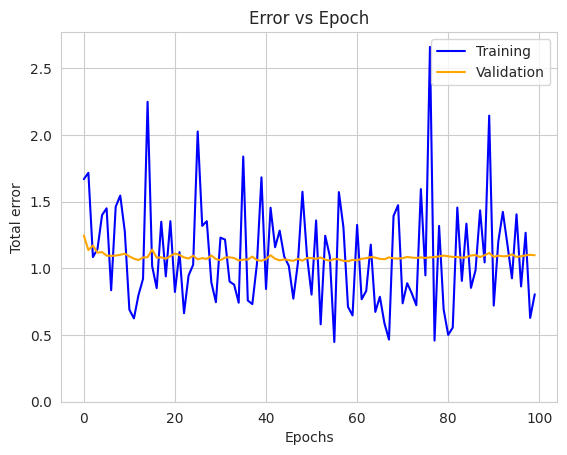

In [5]:
x, y_events, y_tdelta = load_data()

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=2, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=100, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0        100.0
1       ED_intime  2208.0         73.6
2      ED_outtime  2208.0         73.6
3         CT_time     0.0          0.0
4         SW_time     0.0          0.0
5        TPA_time     0.0          0.0
6  admission_time  3000.0        100.0
7  discharge_time  3000.0        100.0
8           icuin     0.0          0.0
9          icuout     0.0          0.0


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


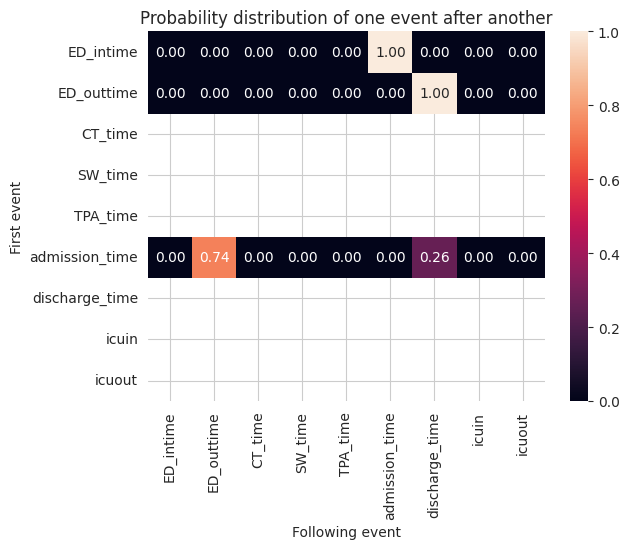

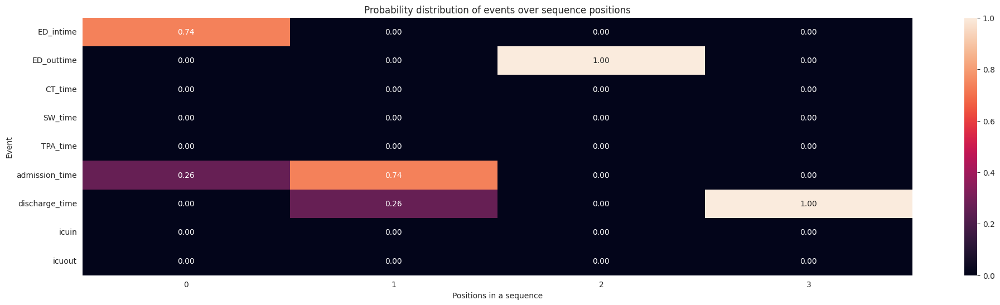

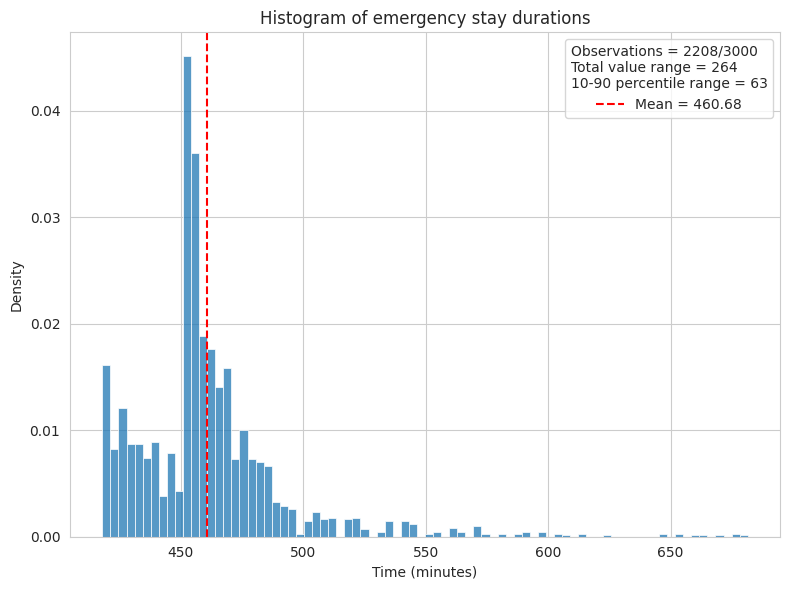

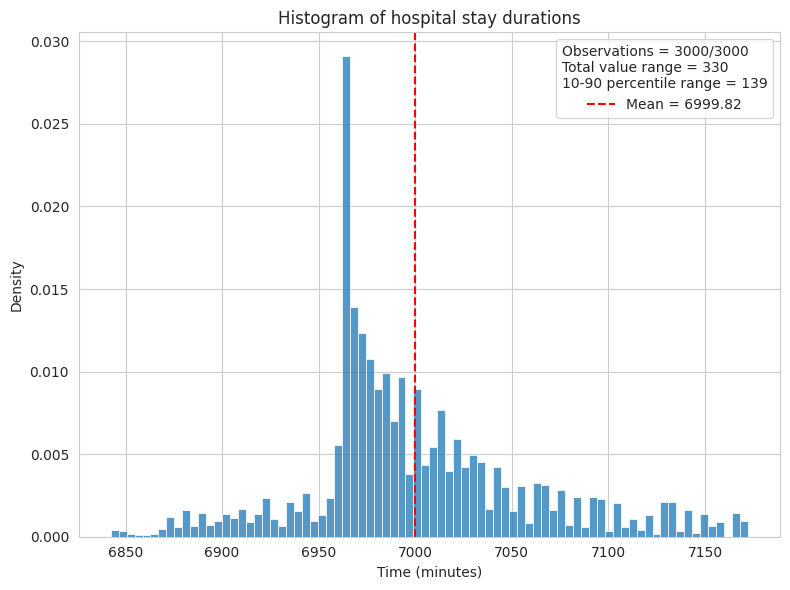

No intervals for event = icu found.


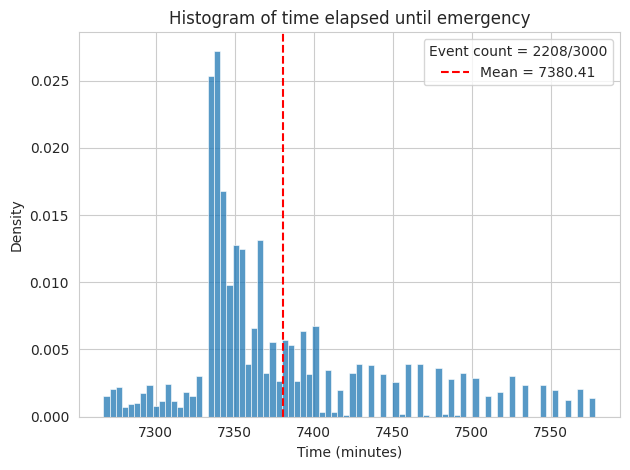

No intervals for event = icu found.


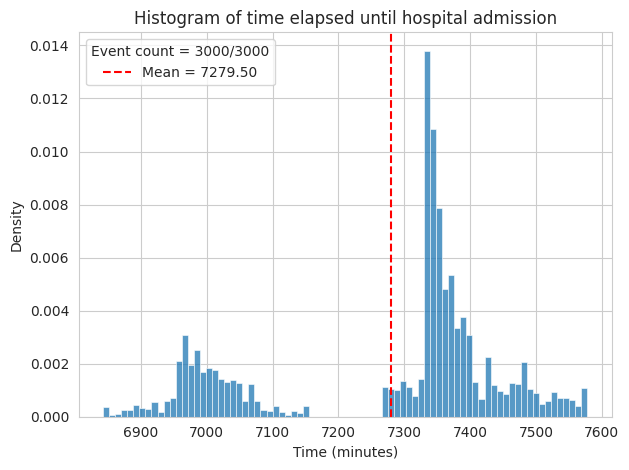

No intervals for event = tpa found.
No intervals for event = sw found.
No intervals for event = ct found.


In [6]:
post_process(model)

## 6 - 4+

Epoch 1  --> Training: total loss=2.7244 -- Validation: total loss=2.7416 (Event loss=1.6970 + Tdelta loss=1.0447) -- Run time: 0.52 seconds.
Epoch 2  --> Training: total loss=2.6951 -- Validation: total loss=2.0078 (Event loss=1.0051 + Tdelta loss=1.0027) -- Run time: 0.53 seconds.
Epoch 3  --> Training: total loss=1.7693 -- Validation: total loss=1.8095 (Event loss=0.8018 + Tdelta loss=1.0077) -- Run time: 0.52 seconds.
Epoch 4  --> Training: total loss=2.5840 -- Validation: total loss=1.7466 (Event loss=0.7593 + Tdelta loss=0.9874) -- Run time: 0.52 seconds.
Epoch 5  --> Training: total loss=1.7932 -- Validation: total loss=1.6856 (Event loss=0.7328 + Tdelta loss=0.9528) -- Run time: 0.53 seconds.
Epoch 6  --> Training: total loss=1.7552 -- Validation: total loss=1.6927 (Event loss=0.7236 + Tdelta loss=0.9691) -- Run time: 0.52 seconds.
Epoch 7  --> Training: total loss=2.5764 -- Validation: total loss=1.6782 (Event loss=0.7382 + Tdelta loss=0.9399) -- Run time: 0.53 seconds.
Epoch 

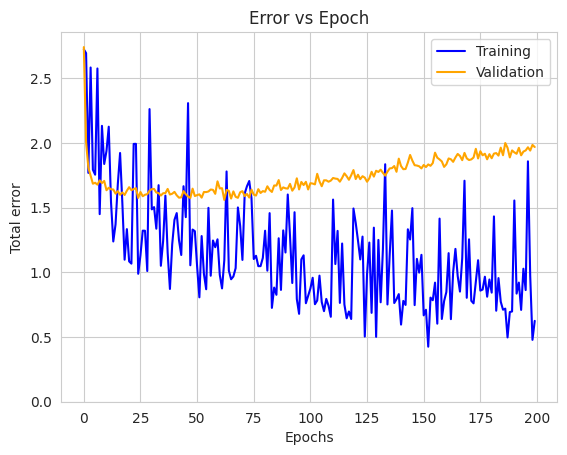

In [7]:
x, y_events, y_tdelta = load_data(4)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=2, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2206.0    73.533333
2      ED_outtime  2206.0    73.533333
3         CT_time  3000.0   100.000000
4         SW_time     0.0     0.000000
5        TPA_time    19.0     0.633333
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  3000.0   100.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


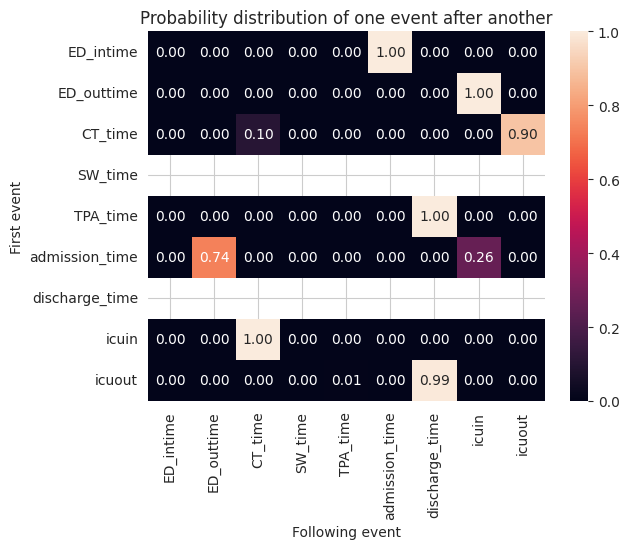

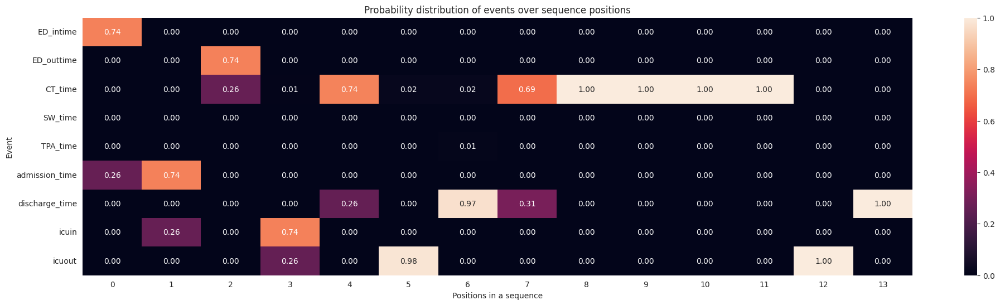

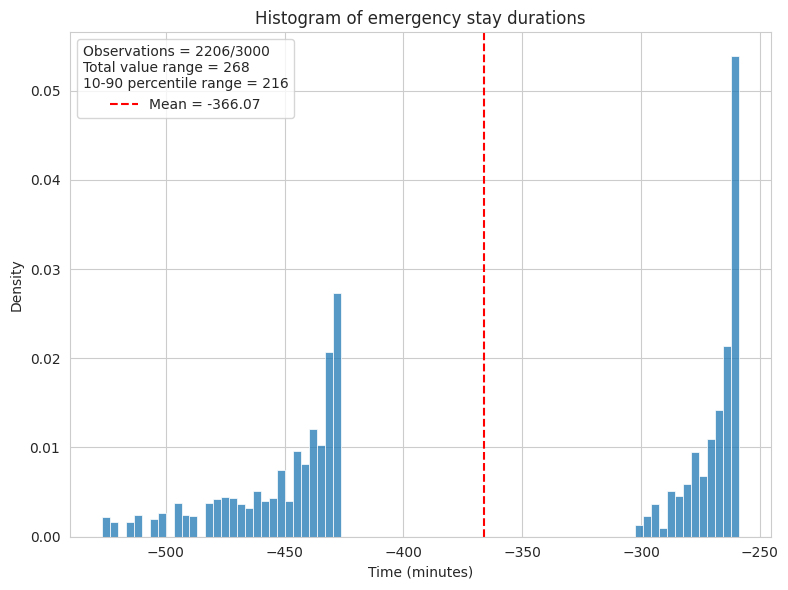

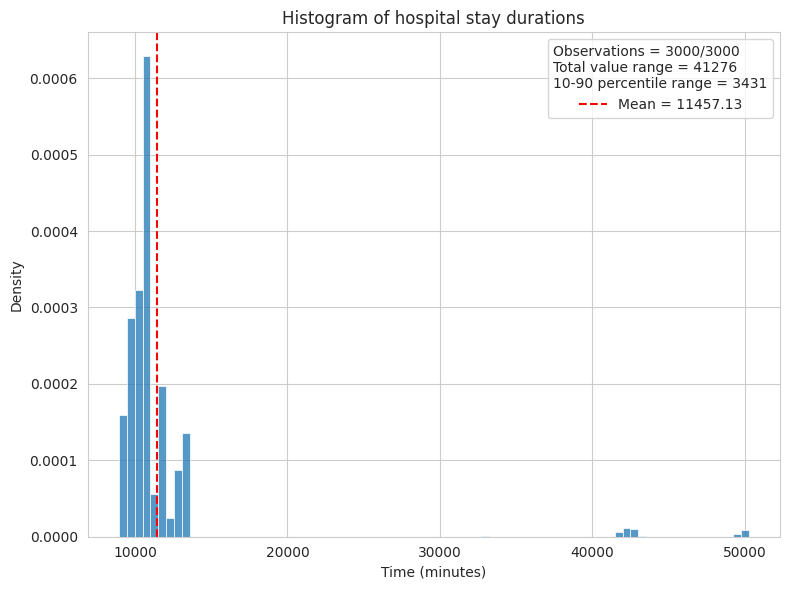

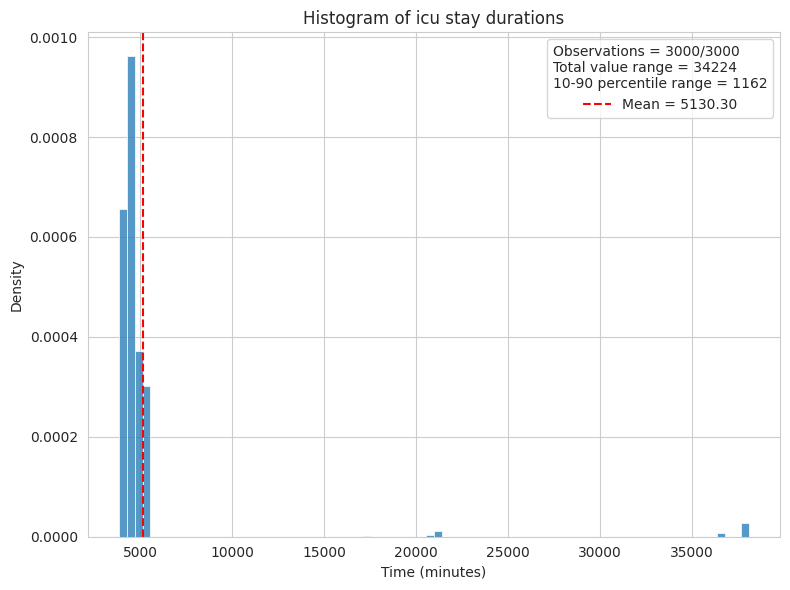

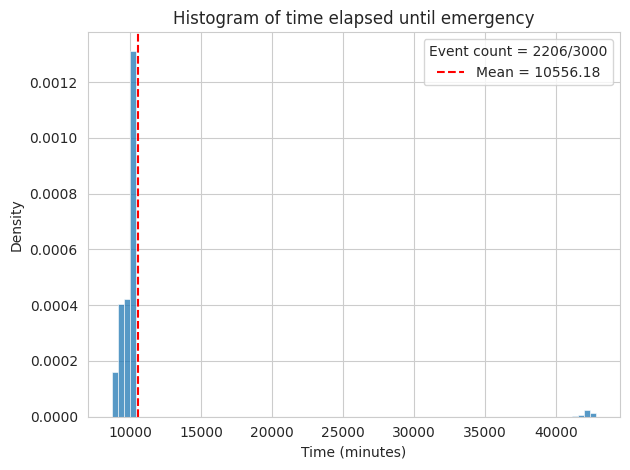

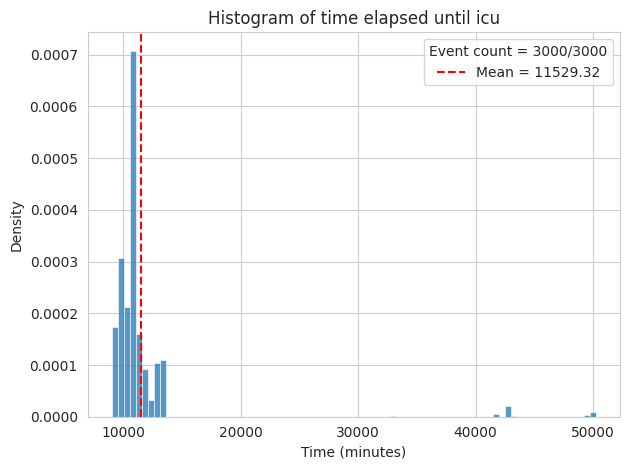

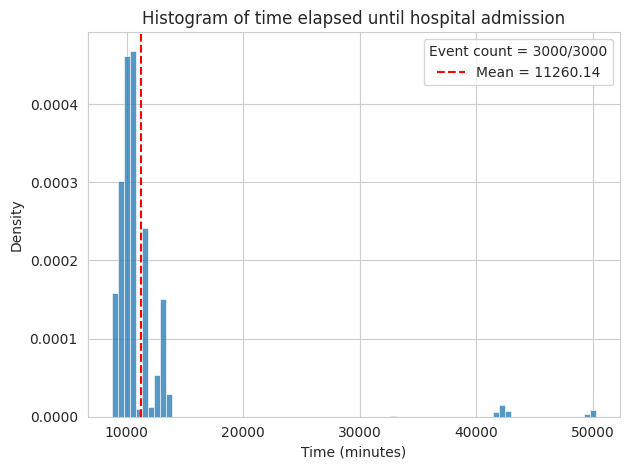

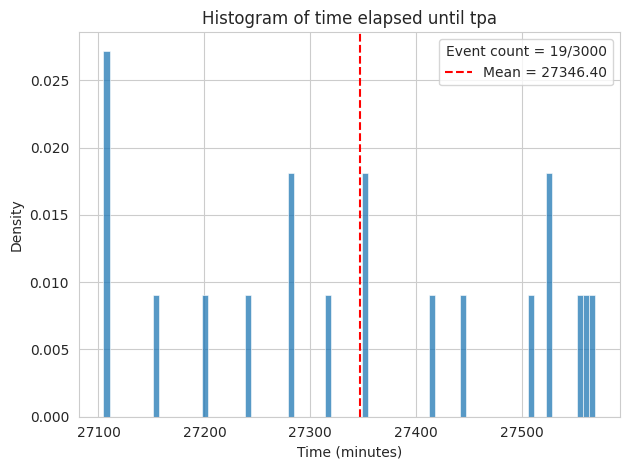

No intervals for event = sw found.


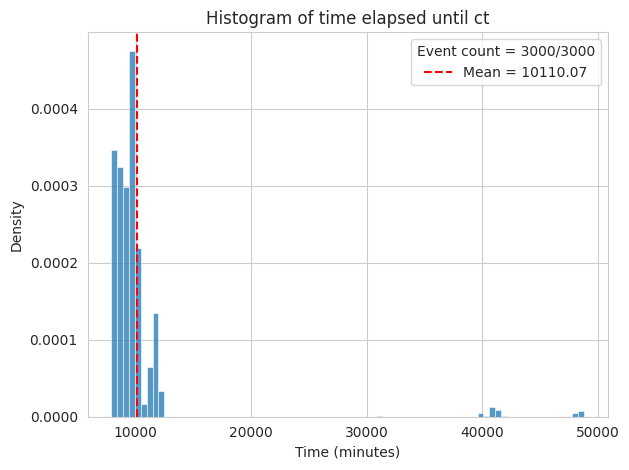

In [8]:
post_process(model)

## 6 - 6+

Epoch 1  --> Training: total loss=2.4681 -- Validation: total loss=2.6675 (Event loss=1.6764 + Tdelta loss=0.9911) -- Run time: 0.42 seconds.
Epoch 2  --> Training: total loss=3.1171 -- Validation: total loss=1.8771 (Event loss=0.9221 + Tdelta loss=0.9550) -- Run time: 0.37 seconds.
Epoch 3  --> Training: total loss=1.1160 -- Validation: total loss=1.7334 (Event loss=0.7914 + Tdelta loss=0.9420) -- Run time: 0.37 seconds.
Epoch 4  --> Training: total loss=1.0402 -- Validation: total loss=1.7097 (Event loss=0.7538 + Tdelta loss=0.9559) -- Run time: 0.37 seconds.
Epoch 5  --> Training: total loss=1.7319 -- Validation: total loss=1.6386 (Event loss=0.7376 + Tdelta loss=0.9011) -- Run time: 0.37 seconds.
Epoch 6  --> Training: total loss=1.1855 -- Validation: total loss=1.7274 (Event loss=0.7143 + Tdelta loss=1.0131) -- Run time: 0.36 seconds.
Epoch 7  --> Training: total loss=1.2544 -- Validation: total loss=1.6303 (Event loss=0.7262 + Tdelta loss=0.9041) -- Run time: 0.37 seconds.
Epoch 

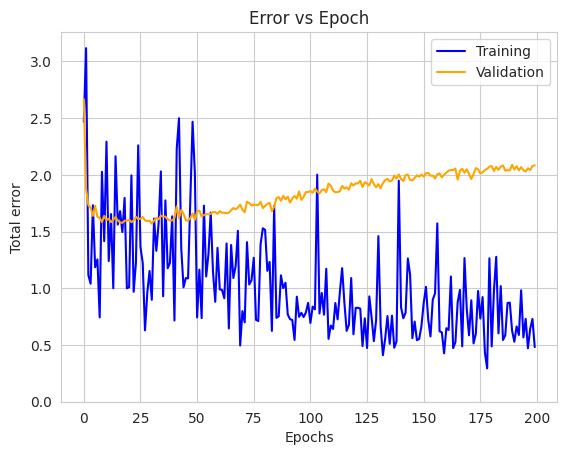

In [9]:
x, y_events, y_tdelta = load_data(6)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=2, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2119.0    70.633333
2      ED_outtime  2119.0    70.633333
3         CT_time  2580.0    86.000000
4         SW_time   420.0    14.000000
5        TPA_time    22.0     0.733333
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  3000.0   100.000000


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


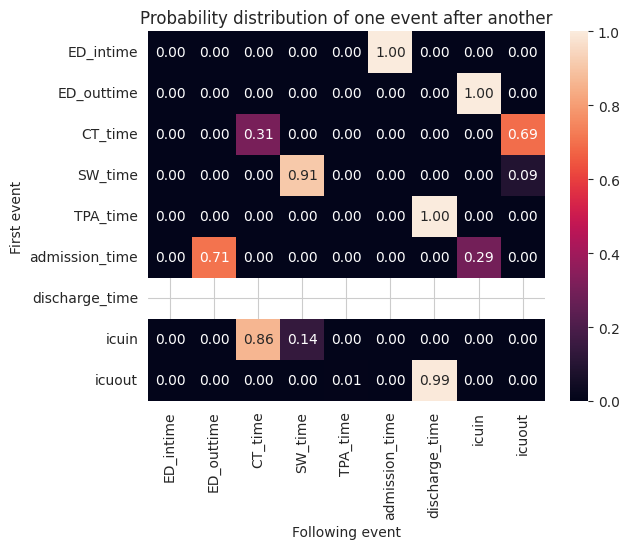

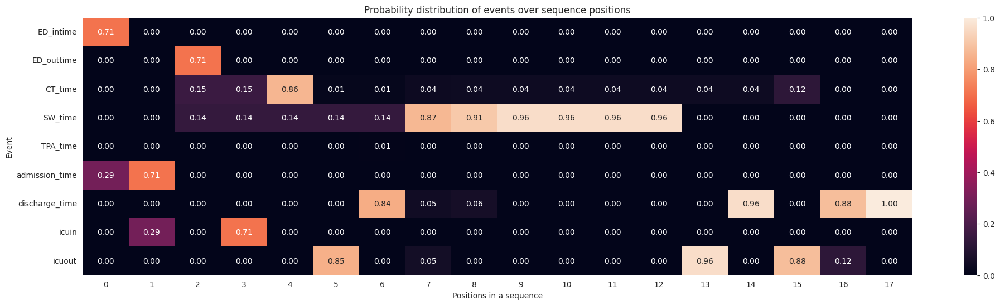

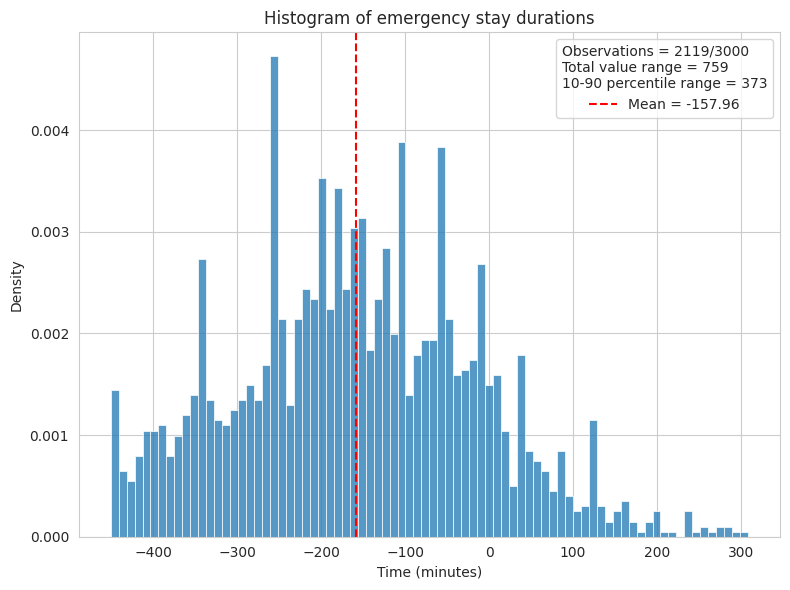

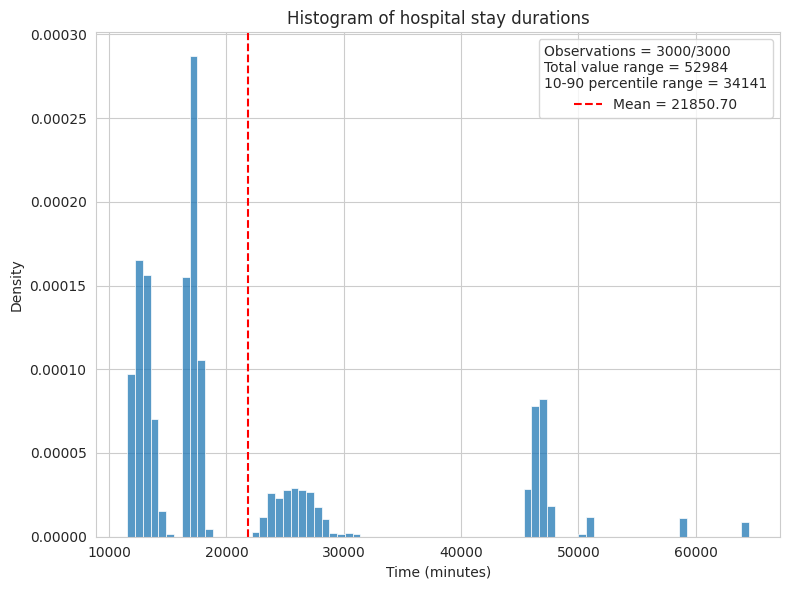

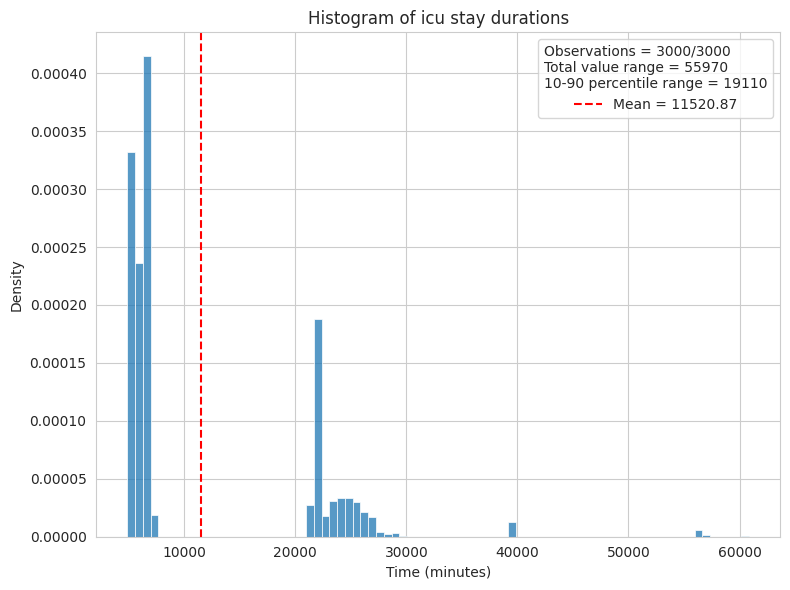

...

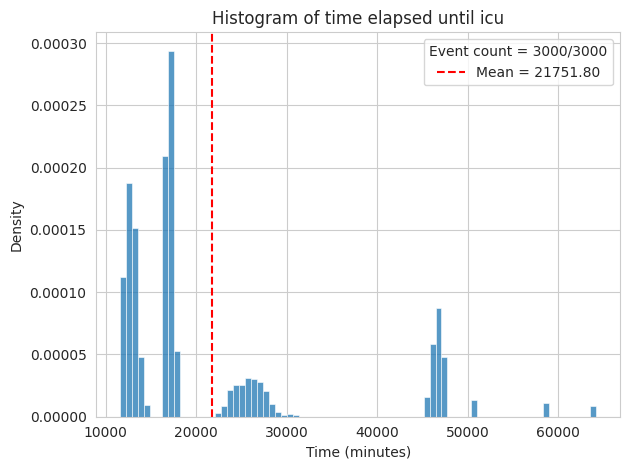

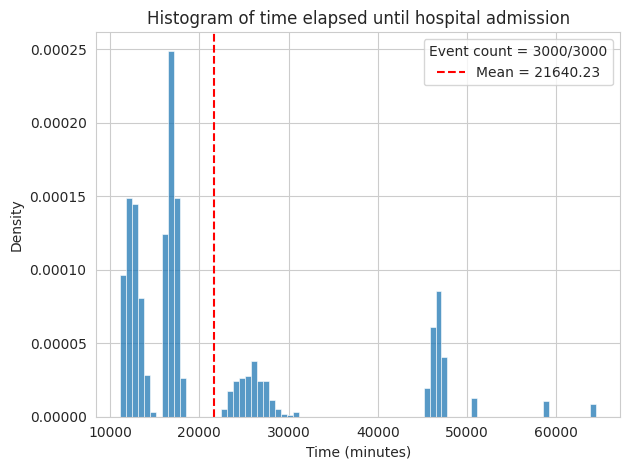

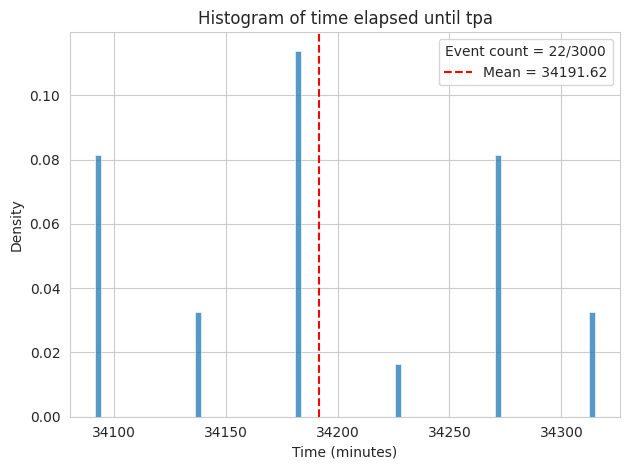

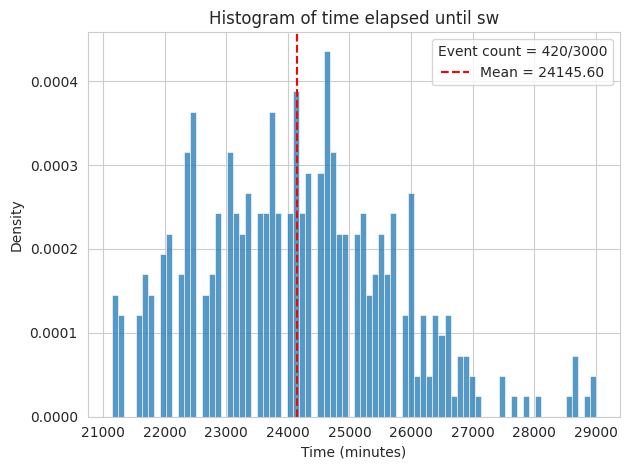

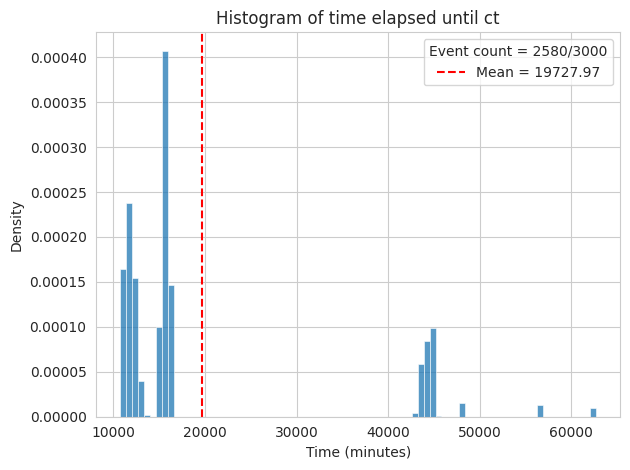

In [10]:
post_process(model)

## 6 - 8+

Epoch 1  --> Training: total loss=3.6603 -- Validation: total loss=3.0021 (Event loss=1.9306 + Tdelta loss=1.0716) -- Run time: 0.30 seconds.
Epoch 2  --> Training: total loss=3.4269 -- Validation: total loss=2.5365 (Event loss=1.5874 + Tdelta loss=0.9491) -- Run time: 0.31 seconds.
Epoch 3  --> Training: total loss=1.8130 -- Validation: total loss=2.1686 (Event loss=1.2246 + Tdelta loss=0.9440) -- Run time: 0.31 seconds.
Epoch 4  --> Training: total loss=1.4574 -- Validation: total loss=1.9245 (Event loss=0.9868 + Tdelta loss=0.9377) -- Run time: 0.44 seconds.
Epoch 5  --> Training: total loss=1.5136 -- Validation: total loss=1.8232 (Event loss=0.9106 + Tdelta loss=0.9126) -- Run time: 0.31 seconds.
Epoch 6  --> Training: total loss=2.4746 -- Validation: total loss=1.8311 (Event loss=0.8584 + Tdelta loss=0.9727) -- Run time: 0.29 seconds.
Epoch 7  --> Training: total loss=1.8426 -- Validation: total loss=1.7633 (Event loss=0.8153 + Tdelta loss=0.9480) -- Run time: 0.26 seconds.
Epoch 

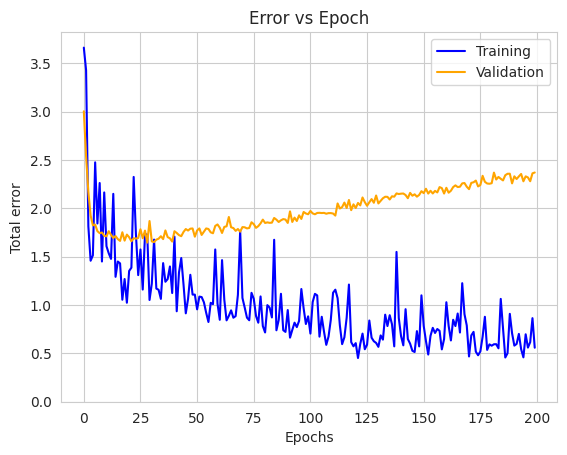

In [11]:
x, y_events, y_tdelta = load_data(8)

# initialize the neural network object
net1 = base.Net(device=device, input_length=x.shape[1], d_model=16, sequence_length=16, decoders_in_stack=2, num_heads=2, dropout=0.1, activation=nn.GELU())

# initialize the trainer class
model =  base.Healsformer(device=device, network=net1, epochs=200, learning_rate=0.001)

# pass the input data to the PyTorch data loader class
model.load_data(x=x, y_events=y_events, y_tdelta=y_tdelta, test_split=0.15, val_split=0.15, batch_size=128)

# train, test, and plot the loss vs. epoch plots
model.train(verbose=True)
model.test()
model.plot_error_vs_epoch()

                0       1  Percentages
0    Record count  3000.0   100.000000
1       ED_intime  2161.0    72.033333
2      ED_outtime  2161.0    72.033333
3         CT_time  2728.0    90.933333
4         SW_time  2799.0    93.300000
5        TPA_time     0.0     0.000000
6  admission_time  3000.0   100.000000
7  discharge_time  3000.0   100.000000
8           icuin  3000.0   100.000000
9          icuout  2456.0    81.866667


/home/logan/Documents/GitHub/Healthsformer/analysis.py:60: RuntimeWarning: invalid value encountered in divide
  probs = counts / counts.sum(axis=1).reshape(-1, 1)


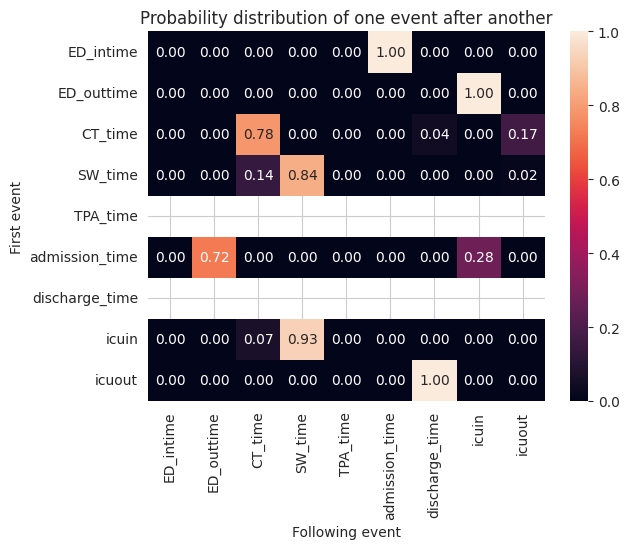

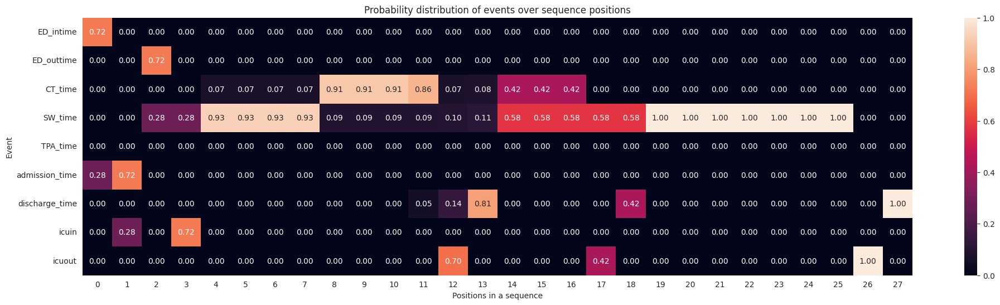

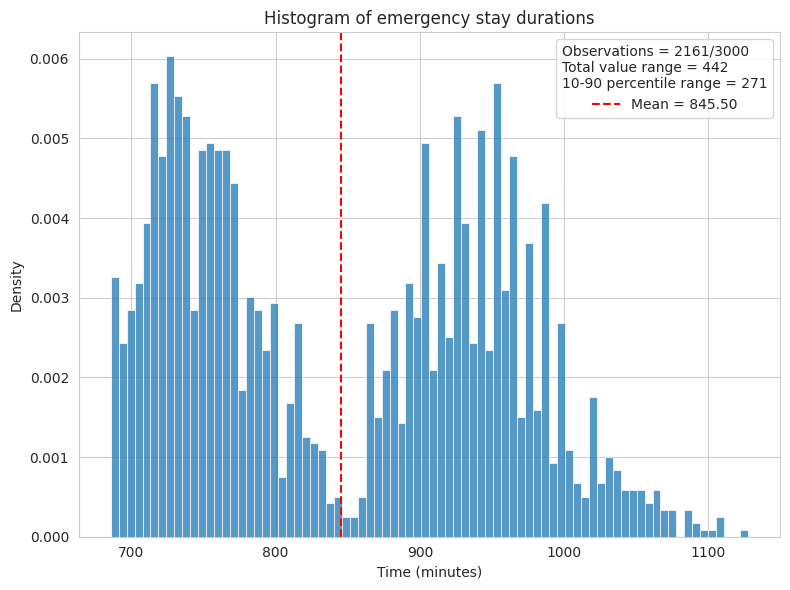

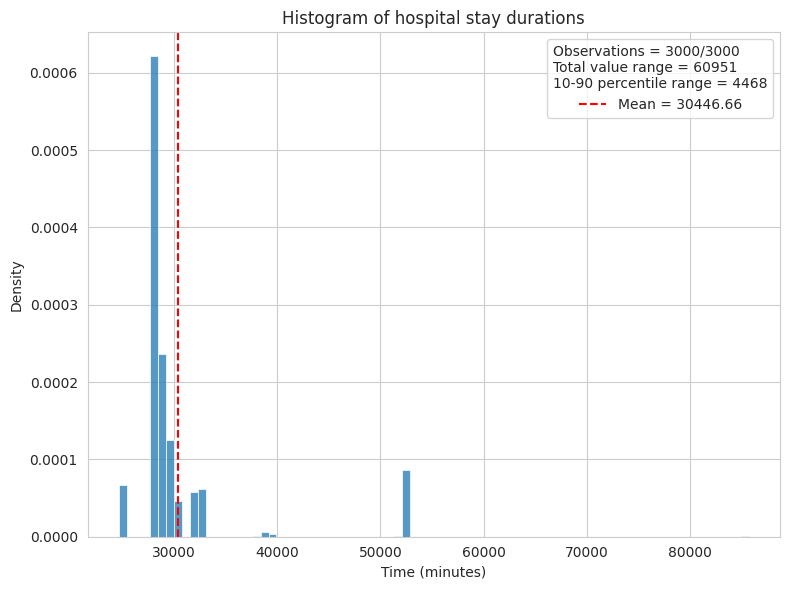

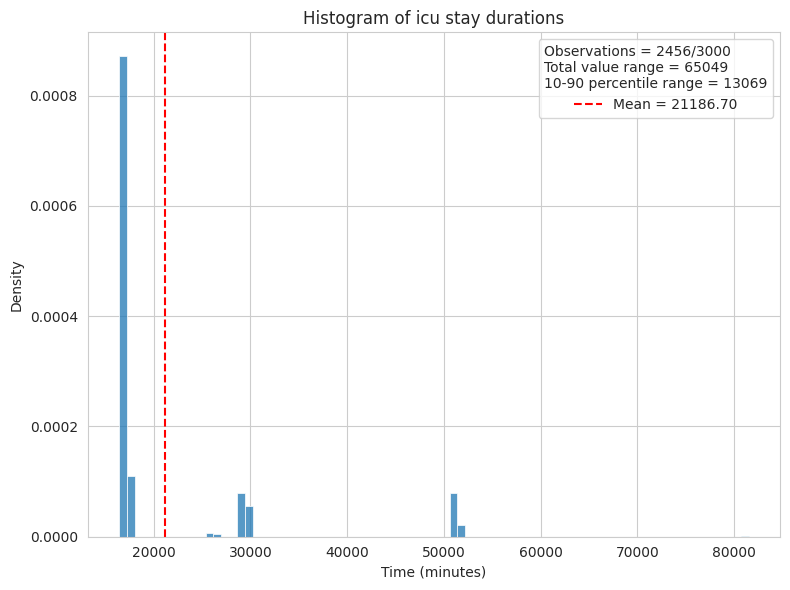

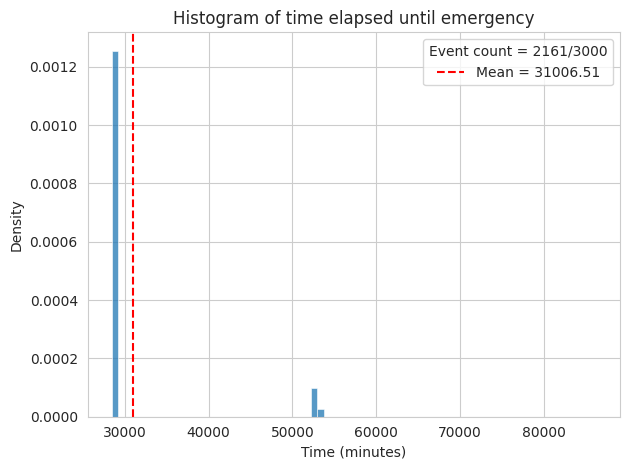

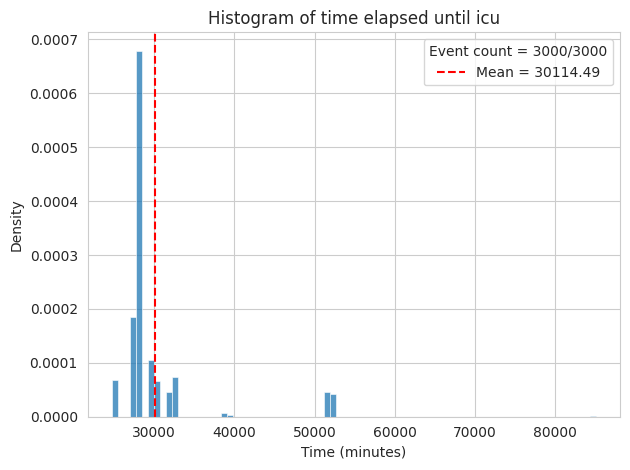

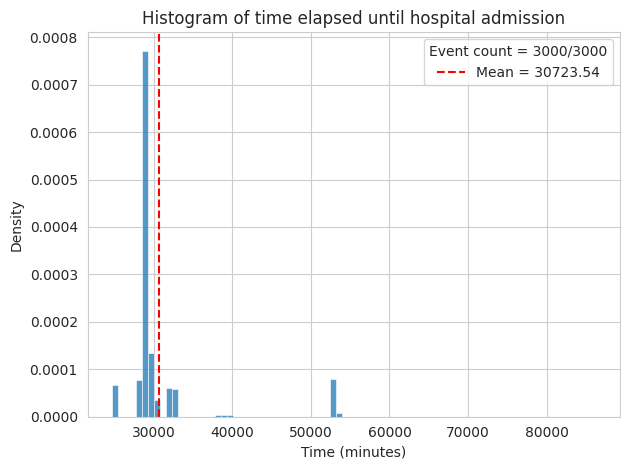

No intervals for event = tpa found.


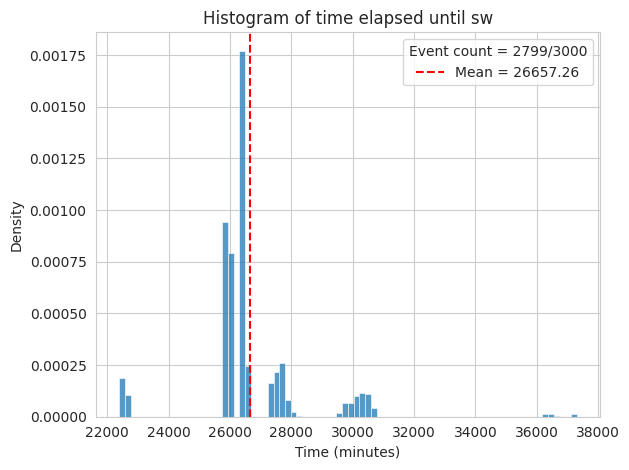

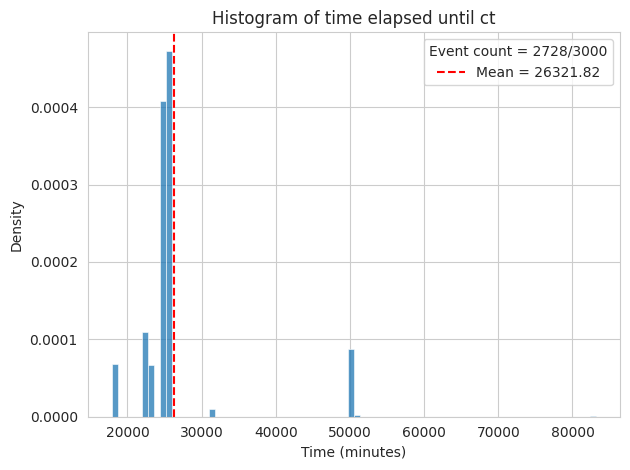

In [12]:
post_process(model)